# 불러오기

In [ ]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-nanum is already the newest version (20200506-1).
0 upgraded, 0 newly installed, 0 to remove and 31 not upgraded.
/usr/share/fonts: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/truetype: caching, new cache contents: 0 fonts, 3 dirs
/usr/share/fonts/truetype/humor-sans: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/liberation: caching, new cache contents: 16 fonts, 0 dirs
/usr/share/fonts/truetype/nanum: caching, new cache contents: 12 fonts, 0 dirs
/usr/local/share/fonts: caching, new cache contents: 0 fonts, 0 dirs
/root/.local/share/fonts: skipping, no such directory
/root/.fonts: skipping, no such directory
/usr/share/fonts/truetype: skipping, looped directory detected
/usr/share/fonts/truetype/humor-sans: skipping, looped directory detected
/usr/share/fonts/truetype/liberation: skipping, looped directory detected
/usr/share/fonts/truetype/

In [ ]:
import matplotlib.pyplot as plt

plt.rc('font', family='NanumBarunGothic')

In [ ]:

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import re
import numpy as np
from sklearn.preprocessing import StandardScaler
from prophet import Prophet
from statsmodels.tsa.statespace.sarimax import SARIMAX

import pandas_datareader as pdr
from statsmodels.tsa.api import SimpleExpSmoothing
from statsmodels.tsa.stattools import adfuller, acf
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt



In [ ]:


#dfrh_1 = pd.read_excel('/content/drive/MyDrive/EDA_2/비염_13.xlsx', sheet_name='외래입원주부상병')
#dfat_1 = pd.read_excel('/content/drive/MyDrive/EDA_2/아토피_13.xlsx', sheet_name='외래입원주부상병')
#dfas_1 = pd.read_excel('/content/drive/MyDrive/EDA_2/천식_13.xlsx', sheet_name='외래입원주부상병')



In [ ]:
# https://jumin.mois.go.kr/
# 2022.csv 파일 불러오기
df_2022 = pd.read_csv('/content/drive/MyDrive/EDA_2/2022.csv',encoding = 'cp949')

# 2019_2021.csv 파일 불러오기
df_2019_2021 = pd.read_csv('/content/drive/MyDrive/EDA_2/2019_2021.csv',encoding = 'cp949')

# 2016_2018.csv 파일 불러오기
df_2016_2018 = pd.read_csv('/content/drive/MyDrive/EDA_2/2016_2018.csv',encoding = 'cp949')

# 2013_2015.csv 파일 불러오기
df_2013_2015 = pd.read_csv('/content/drive/MyDrive/EDA_2/2013_2015.csv',encoding = 'cp949')


In [ ]:
CAS = pd.read_csv('/content/drive/MyDrive/EDA_2/아황산_최종.csv',encoding = 'utf-8')

In [ ]:
end = pd.read_csv('/content/drive/MyDrive/EDA_2/기상과질병데이터.csv',encoding = 'cp949')

In [ ]:
code = pd.read_excel('/content/drive/MyDrive/EDA_2/비염.xlsx', sheet_name='시군구코드(말소코드포함)')

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/EDA_2/아황산이산화.csv',encoding = 'cp949')

In [ ]:
df2 = pd.read_csv('/content/drive/MyDrive/EDA_2/최종최종.csv',encoding = 'cp949')

In [ ]:
dfrh_1 = pd.read_csv('/content/drive/MyDrive/EDA_2/dfrh_1_2.csv', encoding='utf-8' )
dfat_1 = pd.read_csv('/content/drive/MyDrive/EDA_2/dfat_1_2.csv',  encoding='utf-8')
dfas_1 = pd.read_csv('/content/drive/MyDrive/EDA_2/dfas_1_2.csv', encoding='utf-8' )


In [ ]:
def plot_standardized_data(df):
    # Convert '요양개시연월' to datetime and extract '연도'
    df['요양개시연월'] = pd.to_datetime(df['요양개시연월'], format='%Y-%m-%d')
    df['연도'] = df['요양개시연월'].dt.year

    temp_1 = df.groupby(['주소(시군구)', '요양개시연월','주소(시도)']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    temp_2 = temp_1.groupby(['주소(시군구)', '요양개시연월','주소(시도)']).agg({
            '진료에피소드 건수': 'sum',
            '인구수': 'sum'
        }).reset_index()

    temp_3 = temp_1.groupby([ '요양개시연월','주소(시도)']).agg({
            '진료에피소드 건수': 'sum',
            '인구수': 'sum'
        }).reset_index()


    # Calculate '인구 대비' and standardize
    temp_3['인구 대비'] = temp_3['진료에피소드 건수'] / temp_3['인구수']
    scaler = StandardScaler()
    temp_3['표준화'] = scaler.fit_transform(temp_3[['인구 대비']])

    return temp_3



rH = plot_standardized_data(dfrh_1)
aS = plot_standardized_data(dfas_1)
aT = plot_standardized_data(dfat_1)


In [ ]:
dfrh_1.head()

,요양개시연월,주소(시도),주소(시군구),성별,연령군,진료에피소드 건수,인구수,시군구코드,시군구명,지역명,연도,월
0,2013-01-01,서울,11110,1,0~5세,199,164634.0,11110,종로구,서울 종로구,2013,1
1,2013-01-01,서울,11110,1,6~11세,252,164634.0,11110,종로구,서울 종로구,2013,1
2,2013-01-01,서울,11110,1,12~17세,196,164634.0,11110,종로구,서울 종로구,2013,1
3,2013-01-01,서울,11110,1,18~44세,975,164634.0,11110,종로구,서울 종로구,2013,1
4,2013-01-01,서울,11110,1,45~64세,733,164634.0,11110,종로구,서울 종로구,2013,1


In [ ]:
rH.head()

,요양개시연월,주소(시도),진료에피소드 건수,인구수,인구 대비,표준화,연도,월
0,2013-01-01,강원,57890,1537704.0,0.037647,-0.152037,2013,1
1,2013-01-01,경기,517633,11997735.0,0.043144,0.261649,2013,1
2,2013-01-01,경남,141892,3318979.0,0.042752,0.232110,2013,1
3,2013-01-01,경북,103090,2698263.0,0.038206,-0.109968,2013,1
4,2013-01-01,광주,60846,1470061.0,0.041390,0.129646,2013,1


# 전처리

In [ ]:
address_mapping = {
    11: '서울', 26: '부산', 27: '대구', 28: '인천', 29: '광주',
    30: '대전', 31: '울산', 36: '세종', 41: '경기', 42: '강원',
    43: '충북', 44: '충남', 45: '전북', 46: '전남', 47: '경북',
    48: '경남', 50: '제주'
}

# 주소(시도) 열 값 업데이트
dfrh_1['주소(시도)'] = dfrh_1['주소(시도)'].map(address_mapping)
dfas_1['주소(시도)'] = dfas_1['주소(시도)'].map(address_mapping)
dfat_1['주소(시도)'] = dfat_1['주소(시도)'].map(address_mapping)


In [ ]:
dfrh_1['요양개시연월'] = pd.to_datetime(dfrh_1['요양개시연월'], format='%Y%m')


# dfas_1에 대해서 수행
dfas_1['요양개시연월'] = pd.to_datetime(dfas_1['요양개시연월'], format='%Y%m')


# dfat_1에 대해서 수행
dfat_1['요양개시연월'] = pd.to_datetime(dfat_1['요양개시연월'], format='%Y%m')


## 아황산 전처리

In [ ]:
CAS = pd.read_csv('/content/drive/MyDrive/EDA_2/아황산_최종.csv',encoding = 'utf-8')
CAS.head()

,구분(1),2013.01,2013.02,2013.03,2013.04,2013.05,2013.06,2013.07,2013.08,2013.09,...,2022.03,2022.04,2022.05,2022.06,2022.07,2022.08,2022.09,2022.10,2022.11,2022.12
0,서울,0.008,0.006,0.006,0.006,0.006,0.005,0.004,0.004,0.004,...,0.003,0.003,0.003,0.002,0.003,0.003,0.003,0.003,0.003,0.003
1,부산,0.008,0.007,0.008,0.006,0.008,0.008,0.007,0.008,0.007,...,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003
2,대구,0.008,0.007,0.005,0.004,0.004,0.003,0.003,0.003,0.002,...,0.002,0.002,0.002,0.001,0.002,0.002,0.001,0.001,0.002,0.002
3,인천,0.010,0.008,0.008,0.007,0.008,0.007,0.005,0.006,0.006,...,0.004,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.004,0.004
4,광주,0.006,0.005,0.005,0.005,0.004,0.004,0.004,0.004,0.004,...,0.003,0.003,0.003,0.002,0.003,0.003,0.003,0.003,0.003,0.003


In [ ]:
cas = CAS.T
cas.columns = cas.iloc[0]
cas.head()

구분(1),서울,부산,대구,인천,광주,대전,울산,세종,경기,강원,충북,충남,전북,전남,경북,경남,제주
구분(1),서울,부산,대구,인천,광주,대전,울산,세종,경기,강원,충북,충남,전북,전남,경북,경남,제주
2013.01,0.008,0.008,0.008,0.01,0.006,0.007,0.008,0.006,0.008,0.01,0.009,0.006,0.007,0.008,0.008,0.007,0.004
2013.02,0.006,0.007,0.007,0.008,0.005,0.006,0.007,0.005,0.006,0.007,0.007,0.005,0.006,0.008,0.007,0.006,0.003
2013.03,0.006,0.008,0.005,0.008,0.005,0.004,0.008,0.005,0.006,0.005,0.006,0.005,0.005,0.007,0.006,0.006,0.003
2013.04,0.006,0.006,0.004,0.007,0.005,0.003,0.007,0.004,0.005,0.004,0.005,0.004,0.005,0.006,0.005,0.005,0.002


In [ ]:

# 첫 번째 행을 제거
cas = cas[1:]

# 인덱스를 %y-%m 형식으로 변경
cas.index = pd.to_datetime(cas.index, format='%Y.%m')


In [ ]:
cas.head()

구분(1),서울,부산,대구,인천,광주,대전,울산,세종,경기,강원,충북,충남,전북,전남,경북,경남,제주
2013-01-01,0.008,0.008,0.008,0.01,0.006,0.007,0.008,0.006,0.008,0.01,0.009,0.006,0.007,0.008,0.008,0.007,0.004
2013-02-01,0.006,0.007,0.007,0.008,0.005,0.006,0.007,0.005,0.006,0.007,0.007,0.005,0.006,0.008,0.007,0.006,0.003
2013-03-01,0.006,0.008,0.005,0.008,0.005,0.004,0.008,0.005,0.006,0.005,0.006,0.005,0.005,0.007,0.006,0.006,0.003
2013-04-01,0.006,0.006,0.004,0.007,0.005,0.003,0.007,0.004,0.005,0.004,0.005,0.004,0.005,0.006,0.005,0.005,0.002
2013-05-01,0.006,0.008,0.004,0.008,0.004,0.003,0.011,0.004,0.006,0.003,0.004,0.004,0.004,0.006,0.005,0.006,0.003


In [ ]:
end = end.drop(end.columns[0], axis=1)
end.set_index('일시', inplace=True)
end.index = pd.to_datetime(end.index, format='%Y.%m')
end.head()

,주소(시도),평균기온(°C),평균최저기온(°C),평균최고기온(°C),월합강수량(00~24h만)(mm),인구대비 천식,인구대비 비염,인구대비 아토피
일시,,,,,,,,
2013-01-01,강원,-4.700000,-9.707692,0.838462,39.961538,0.006959,0.037647,0.002588
2013-02-01,강원,-1.484615,-6.792308,3.869231,36.992308,0.006662,0.035763,0.002615
2013-03-01,강원,4.946154,-1.000000,11.315385,54.123077,0.008314,0.043735,0.002685
2013-04-01,강원,8.830769,3.253846,14.584615,62.561538,0.007726,0.040480,0.002679
2013-05-01,강원,16.892308,11.269231,23.100000,91.561538,0.006778,0.032398,0.003026


In [ ]:
end = end.sort_values(by=['주소(시도)', '일시'])

In [ ]:
dates = end.index.unique()
locations = end['주소(시도)'].unique()


# '인구수' 열을 추가하고 값을 할당하기
end['아황산'] = np.nan  # NaN으로 초기값 설정

for date in dates:
    for location in locations:
        # transposed_population에서 값이 존재하는 경우에만 할당
        if date in cas.index and location in cas.columns:
            population_value = cas.loc[date, location]

            # 해당하는 행과 열에 값 할당
            mask = (end.index == date) & (end['주소(시도)'] == location)
            end.loc[mask, '아황산'] = population_value


In [ ]:
end.head()

,주소(시도),평균기온(°C),평균최저기온(°C),평균최고기온(°C),월합강수량(00~24h만)(mm),인구대비 천식,인구대비 비염,인구대비 아토피,아황산
일시,,,,,,,,,
2013-01-01,강원,-4.700000,-9.707692,0.838462,39.961538,0.006959,0.037647,0.002588,0.01
2013-02-01,강원,-1.484615,-6.792308,3.869231,36.992308,0.006662,0.035763,0.002615,0.007
2013-03-01,강원,4.946154,-1.000000,11.315385,54.123077,0.008314,0.043735,0.002685,0.005
2013-04-01,강원,8.830769,3.253846,14.584615,62.561538,0.007726,0.040480,0.002679,0.004
2013-05-01,강원,16.892308,11.269231,23.100000,91.561538,0.006778,0.032398,0.003026,0.003


In [ ]:
end.head()
end.to_csv('/content/drive/My Drive/아황산_진짜최종.csv', index=True, encoding='cp949')

## 인구 수 파일 전처리

In [ ]:
# Assuming '행정구역' is the common column in all dataframes

# Extract '행정구역' column from each dataframe
columns_2022 = set(df_2022['행정구역'])
columns_2019_2021 = set(df_2019_2021['행정구역'])
columns_2016_2018 = set(df_2016_2018['행정구역'])
columns_2013_2015 = set(df_2013_2015['행정구역'])

# Find common values
common_values = columns_2022.intersection(columns_2019_2021, columns_2016_2018, columns_2013_2015)

# Find values unique to each dataframe
unique_values_2022 = columns_2022 - common_values
unique_values_2019_2021 = columns_2019_2021 - common_values
unique_values_2016_2018 = columns_2016_2018 - common_values
unique_values_2013_2015 = columns_2013_2015 - common_values

# Print the results
print("Common Values:")
print(common_values)

print("\nUnique Values in 2022:")
print(unique_values_2022)

print("\nUnique Values in 2019-2021:")
print(unique_values_2019_2021)

print("\nUnique Values in 2016-2018:")
print(unique_values_2016_2018)

print("\nUnique Values in 2013-2015:")
print(unique_values_2013_2015)


Common Values:
{'충청남도 보령시 (4418000000)', '서울특별시 양천구 (1147000000)', '서울특별시 동대문구 (1123000000)', '충청남도 홍성군 (4480000000)', '충청북도 영동군 (4374000000)', '강원도 횡성군 (4273000000)', '대구광역시 북구 (2723000000)', '경기도 과천시 (4129000000)', '강원도 강릉시 (4215000000)', '전라북도 장수군 (4574000000)', '경상남도 창원시 진해구 (4812900000)', '전라북도 김제시 (4521000000)', '강원도 철원군 (4278000000)', '서울특별시 동작구 (1159000000)', '경상남도 창원시 (4812000000)', '경기도 이천시 (4150000000)', '전라남도 영암군 (4683000000)', '인천광역시 남동구 (2820000000)', '강원도 홍천군 (4272000000)', '경상남도  (4800000000)', '부산광역시 사하구 (2638000000)', '충청남도 천안시 서북구 (4413300000)', '경상북도 영양군 (4776000000)', '충청남도 아산시 (4420000000)', '경기도 시흥시 (4139000000)', '경상북도 영천시 (4723000000)', '제주특별자치도 서귀포시 (5013000000)', '경기도 여주시 (4167000000)', '경상남도 양산시 (4833000000)', '대구광역시 수성구 (2726000000)', '경상북도 포항시 북구 (4711300000)', '강원도 동해시 (4217000000)', '경상북도 경산시 (4729000000)', '경기도 고양시 덕양구 (4128100000)', '전라북도 남원시 (4519000000)', '서울특별시 광진구 (1121500000)', '강원도 원주시 (4213000000)', '전라남도 장흥군 (4680000000)', '경상북도 청송군 (4775000000

In [ ]:
columns_2022 = set(df_2022['행정구역'])
columns_2019_2021 = set(df_2019_2021['행정구역'])
columns_2016_2018 = set(df_2016_2018['행정구역'])
columns_2013_2015 = set(df_2013_2015['행정구역'])

# Find common values
common_values = columns_2022.intersection(columns_2019_2021, columns_2016_2018, columns_2013_2015)

# Filter dataframes to keep only rows with common '행정구역'
df_2022 = df_2022[df_2022['행정구역'].isin(common_values)]
df_2019_2021 = df_2019_2021[df_2019_2021['행정구역'].isin(common_values)]
df_2016_2018 = df_2016_2018[df_2016_2018['행정구역'].isin(common_values)]
df_2013_2015 = df_2013_2015[df_2013_2015['행정구역'].isin(common_values)]


In [ ]:
keywords_to_remove = ['세대수', '남여 비율']
def drop_columns_containing(df, keywords):
    columns_to_drop = [col for col in df.columns if any(keyword in col for keyword in keywords)]
    df.drop(columns=columns_to_drop, inplace=True)

for df in [df_2022, df_2019_2021, df_2016_2018, df_2013_2015]:
    drop_columns_containing(df, keywords_to_remove)


<ipython-input-13-1c7132cf2826>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=columns_to_drop, inplace=True)
<ipython-input-13-1c7132cf2826>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=columns_to_drop, inplace=True)
<ipython-input-13-1c7132cf2826>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=columns_to_drop, inplace=True)
<ipython-input-13-1c7132cf2826>:4: SettingWithCopyWarni

In [ ]:
df_2022['시군구코드'] = df_2022['행정구역'].apply(lambda x: re.search(r'\((\d+)\)', x).group(1)[:5])
df_2019_2021['시군구코드'] = df_2019_2021['행정구역'].apply(lambda x: re.search(r'\((\d+)\)', x).group(1)[:5])
df_2016_2018['시군구코드'] = df_2016_2018['행정구역'].apply(lambda x: re.search(r'\((\d+)\)', x).group(1)[:5])
df_2013_2015['시군구코드'] = df_2013_2015['행정구역'].apply(lambda x: re.search(r'\((\d+)\)', x).group(1)[:5])

<ipython-input-14-1e6d70b1ebc3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2022['시군구코드'] = df_2022['행정구역'].apply(lambda x: re.search(r'\((\d+)\)', x).group(1)[:5])
<ipython-input-14-1e6d70b1ebc3>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2019_2021['시군구코드'] = df_2019_2021['행정구역'].apply(lambda x: re.search(r'\((\d+)\)', x).group(1)[:5])
<ipython-input-14-1e6d70b1ebc3>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,co

In [ ]:
def clean_and_convert_to_int(df):
    # ',' 제거
    df = df.replace(',', '', regex=True)

    # 첫 번째 열을 제외한 모든 열의 데이터 타입을 int로 변경
    for column in df.columns[1:]:
        df[column] = pd.to_numeric(df[column], errors='coerce', downcast='integer')

    return df

df_2022 = clean_and_convert_to_int(df_2022)
df_2019_2021 = clean_and_convert_to_int(df_2019_2021)
df_2016_2018 = clean_and_convert_to_int(df_2016_2018)
df_2013_2015 = clean_and_convert_to_int(df_2013_2015)

In [ ]:
def merge_and_dropna(df, code):
    #df = pd.merge(df, code[['시군구코드', '시도명','시군구명']], left_on='시군구코드', right_on='시군구코드', how='left')
    df = df.dropna(subset=['행정구역'])
    return df

# 함수를 각 데이터프레임에 적용
df_2022 = merge_and_dropna(df_2022, code)
df_2019_2021 = merge_and_dropna(df_2019_2021, code)
df_2016_2018 = merge_and_dropna(df_2016_2018, code)
df_2013_2015 = merge_and_dropna(df_2013_2015, code)


In [ ]:
df_2022 = df_2022.drop(['행정구역'], axis=1)
df_2019_2021 = df_2019_2021.drop(['행정구역'], axis=1)
df_2016_2018 = df_2016_2018.drop(['행정구역'], axis=1)
df_2013_2015 = df_2013_2015.drop(['행정구역'], axis=1)

# 열 이름에서 날짜 추출 후 날짜 형식으로 변환
def convert_columns_to_date(df):
    df.columns = pd.to_datetime(df.columns.str.extract(r'(\d{4}년\d{2}월)')[0], format='%Y년%m월')
    return df

# 함수 적용
df_2022 = convert_columns_to_date(df_2022)
df_2019_2021 = convert_columns_to_date(df_2019_2021)
df_2016_2018 = convert_columns_to_date(df_2016_2018)
df_2013_2015 = convert_columns_to_date(df_2013_2015)

In [ ]:
last_col_name = '주소(시군구)'

# 마지막 열 이름 변경
df_2022.rename(columns={df_2022.columns[-1]: last_col_name}, inplace=True)
df_2019_2021.rename(columns={df_2019_2021.columns[-1]: last_col_name}, inplace=True)
df_2016_2018.rename(columns={df_2016_2018.columns[-1]: last_col_name}, inplace=True)
df_2013_2015.rename(columns={df_2013_2015.columns[-1]: last_col_name}, inplace=True)



In [ ]:
df_2019_2021 = df_2019_2021.drop(['주소(시군구)'], axis=1)
df_2016_2018 = df_2016_2018.drop(['주소(시군구)'], axis=1)
df_2013_2015 = df_2013_2015.drop(['주소(시군구)'], axis=1)

## 인구수 합치기

In [ ]:
# 네 개의 데이터프레임을 '주소(시군구)'를 기준으로 가로로 병합
df_2013_2015.reset_index(drop=True, inplace=True)
df_2016_2018.reset_index(drop=True, inplace=True)
df_2019_2021.reset_index(drop=True, inplace=True)
df_2022.reset_index(drop=True, inplace=True)

population = pd.concat([df_2013_2015, df_2016_2018, df_2019_2021, df_2022], axis=1)
print(len(population))


277


In [ ]:
# 'population' 데이터프레임을 트랜스포즈
transposed_population = population.T

# 마지막 행을 열 이름으로 지정
transposed_population.columns = transposed_population.iloc[-1]

# 마지막 행 제거
transposed_population = transposed_population[:-1]

# '주소(시군구)' 열을 제외한 나머지 열을 datetime 타입으로 변환
transposed_population.index = pd.to_datetime(transposed_population.index, errors='coerce')

# 결과 확인
transposed_population.head(12)


주소(시군구),11000.0,11110.0,11140.0,11170.0,11200.0,11215.0,11230.0,11260.0,11290.0,11305.0,...,48820.0,48840.0,48850.0,48860.0,48870.0,48880.0,48890.0,50000.0,50110.0,50130.0
0,,,,,,,,,,,,,,,,,,,,,
2013-01-01,10195064.0,164634.0,133155.0,243048.0,300628.0,371406.0,363032.0,418971.0,481521.0,342969.0,...,56879.0,48060.0,50576.0,35738.0,40656.0,63092.0,50159.0,584045.0,430061.0,153984.0
2013-02-01,10196434.0,163881.0,132934.0,242815.0,301741.0,371409.0,362966.0,418897.0,481440.0,342692.0,...,56804.0,47854.0,50426.0,35787.0,40656.0,63079.0,49980.0,585231.0,431031.0,154200.0
2013-03-01,10192057.0,162777.0,132652.0,242630.0,302038.0,371170.0,362625.0,418569.0,481651.0,342574.0,...,56785.0,47758.0,50424.0,35793.0,40658.0,63058.0,50107.0,586149.0,431716.0,154433.0
2013-04-01,10185955.0,162281.0,132419.0,242255.0,302026.0,370866.0,362380.0,418360.0,481357.0,342241.0,...,56796.0,47708.0,50366.0,35818.0,40631.0,63076.0,50065.0,587153.0,432613.0,154540.0
2013-05-01,10181807.0,161761.0,132281.0,242019.0,301787.0,370545.0,363793.0,418430.0,480931.0,341791.0,...,56726.0,47631.0,50291.0,35782.0,40648.0,63057.0,50019.0,588001.0,433397.0,154604.0
2013-06-01,10176560.0,161485.0,132042.0,241818.0,301648.0,370279.0,364718.0,418266.0,480766.0,341293.0,...,56663.0,47574.0,50324.0,35886.0,40654.0,63060.0,50081.0,588618.0,433920.0,154698.0
2013-07-01,10172002.0,161232.0,131745.0,241583.0,301384.0,370109.0,365094.0,418022.0,480439.0,340805.0,...,56623.0,47522.0,50245.0,35859.0,40683.0,63038.0,49958.0,589622.0,434735.0,154887.0
2013-08-01,10168997.0,161137.0,131452.0,241214.0,301106.0,369908.0,365227.0,417685.0,480002.0,340530.0,...,56517.0,47512.0,50287.0,35912.0,40664.0,63026.0,49936.0,590450.0,435396.0,155054.0
2013-09-01,10166691.0,161004.0,131085.0,240927.0,300734.0,370036.0,365227.0,417482.0,479537.0,340425.0,...,56465.0,47435.0,50246.0,35958.0,40686.0,63017.0,49884.0,591341.0,436093.0,155248.0


## 인구수 추가


In [ ]:


# transposed_population과 dfrh_1의 일치하는 요양개시연월과 주소(시군구) 열의 값 가져오기
dates = dfrh_1['요양개시연월'].unique()
locations = dfrh_1['주소(시군구)'].unique()


# '인구수' 열을 추가하고 값을 할당하기
dfrh_1['인구수'] = np.nan  # NaN으로 초기값 설정

for date in dates:
    for location in locations:
        # transposed_population에서 값이 존재하는 경우에만 할당
        if date in transposed_population.index and location in transposed_population.columns:
            population_value = transposed_population.loc[date, location]

            # 해당하는 행과 열에 값 할당
            mask = (dfrh_1['요양개시연월'] == date) & (dfrh_1['주소(시군구)'] == location)
            dfrh_1.loc[mask, '인구수'] = population_value


# dfat_1에 대한 작업
dates_at = dfat_1['요양개시연월'].unique()
locations_at = dfat_1['주소(시군구)'].unique()

dfat_1['인구수'] = np.nan  # NaN으로 초기값 설정

for date in dates_at:
    for location in locations_at:
        # transposed_population에서 값이 존재하는 경우에만 할당
        if date in transposed_population.index and location in transposed_population.columns:
            population_value = transposed_population.loc[date, location]

            # 해당하는 행과 열에 값 할당
            mask = (dfat_1['요양개시연월'] == date) & (dfat_1['주소(시군구)'] == location)
            dfat_1.loc[mask, '인구수'] = population_value


# dfas_1에 대한 작업
dates_as = dfas_1['요양개시연월'].unique()
locations_as = dfas_1['주소(시군구)'].unique()

dfas_1['인구수'] = np.nan  # NaN으로 초기값 설정

for date in dates_as:
    for location in locations_as:
        # transposed_population에서 값이 존재하는 경우에만 할당
        if date in transposed_population.index and location in transposed_population.columns:
            population_value = transposed_population.loc[date, location]

            # 해당하는 행과 열에 값 할당
            mask = (dfas_1['요양개시연월'] == date) & (dfas_1['주소(시군구)'] == location)
            dfas_1.loc[mask, '인구수'] = population_value



In [ ]:
# Merge 'dfrh_1' with 'code' DataFrame
dfrh_1 = pd.merge(dfrh_1, code[['시군구코드', '시군구명']], left_on='주소(시군구)', right_on='시군구코드', how='left')

# Merge 'dfas_1' with 'code' DataFrame
dfas_1 = pd.merge(dfas_1, code[['시군구코드', '시군구명']], left_on='주소(시군구)', right_on='시군구코드', how='left')

# Merge 'dfat_1' with 'code' DataFrame
dfat_1 = pd.merge(dfat_1, code[['시군구코드', '시군구명']], left_on='주소(시군구)', right_on='시군구코드', how='left')


In [ ]:
# For dfrh_1
dfrh_1['지역명'] = dfrh_1['주소(시도)'] + ' ' + dfrh_1['시군구명']

# For dfas_1
dfas_1['지역명'] = dfas_1['주소(시도)'] + ' ' + dfas_1['시군구명']

# For dfat_1
dfat_1['지역명'] = dfat_1['주소(시도)'] + ' ' + dfat_1['시군구명']


In [ ]:
# 데이터프레임을 CSV 파일로 저장 (UTF-8 인코딩)
dfrh_1.to_csv('/content/drive/MyDrive/dfrh_1_2.csv', index=False, encoding='utf-8')
dfas_1.to_csv('/content/drive/MyDrive/dfas_1_2.csv', index=False, encoding='utf-8')
dfat_1.to_csv('/content/drive/MyDrive/dfat_1_2.csv', index=False, encoding='utf-8')


## 기본 통계


In [ ]:
dfas_1.head()

,요양개시연월,주소(시도),주소(시군구),성별,연령군,진료에피소드 건수,인구수,시군구코드,시군구명,지역명
0,2013-01-01,서울,11110,1,0,53,164634.0,11110,종로구,서울 종로구
1,2013-01-01,서울,11110,1,1,47,164634.0,11110,종로구,서울 종로구
2,2013-01-01,서울,11110,1,2,17,164634.0,11110,종로구,서울 종로구
3,2013-01-01,서울,11110,1,3,94,164634.0,11110,종로구,서울 종로구
4,2013-01-01,서울,11110,1,4,109,164634.0,11110,종로구,서울 종로구


In [ ]:
dfas_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 353783 entries, 0 to 353782
Data columns (total 10 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   요양개시연월     353783 non-null  object 
 1   주소(시도)     353783 non-null  object 
 2   주소(시군구)    353783 non-null  int64  
 3   성별         353783 non-null  int64  
 4   연령군        353783 non-null  int64  
 5   진료에피소드 건수  353783 non-null  int64  
 6   인구수        351815 non-null  float64
 7   시군구코드      353783 non-null  int64  
 8   시군구명       352343 non-null  object 
 9   지역명        352343 non-null  object 
dtypes: float64(1), int64(5), object(4)
memory usage: 27.0+ MB


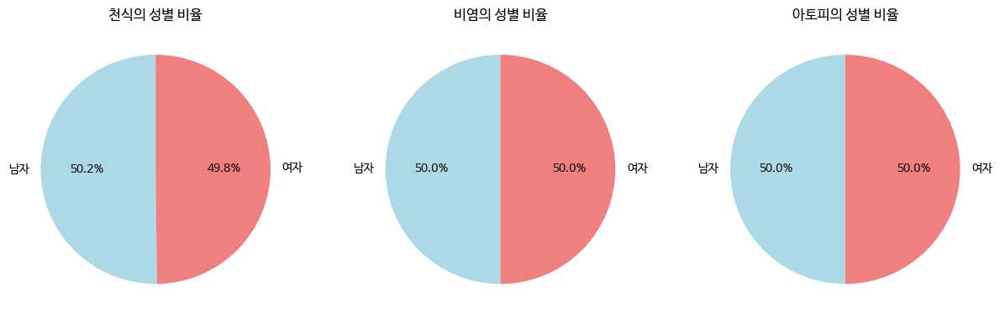

In [ ]:
dataframes = [dfas_1, dfrh_1, dfat_1]

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# 파이 차트 그리기
for i, (df, condition) in enumerate(zip(dataframes, ['천식', '비염', '아토피'])):
    gender_counts = df['성별'].value_counts()
    total_count = len(df)
    gender_ratios = gender_counts / total_count

    axs[i].pie(gender_ratios, labels=['남자', '여자'], autopct='%1.1f%%', startangle=90, colors=['lightblue', 'lightcoral'])
    axs[i].set_title(f'{condition}의 성별 비율')

plt.show()

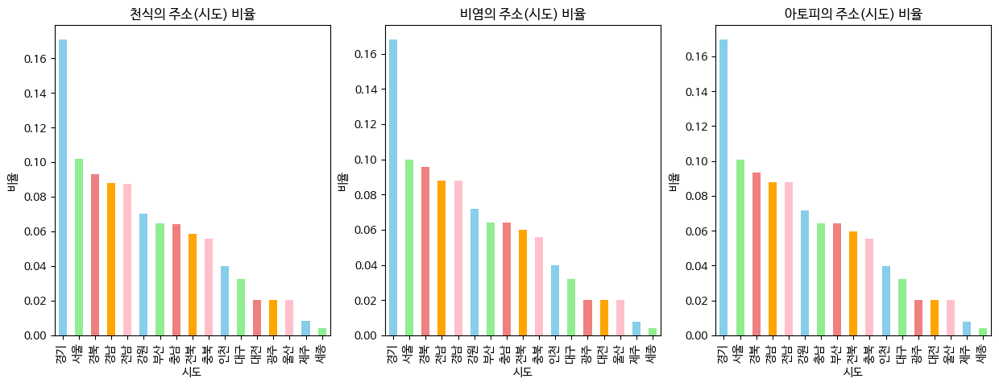

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# 막대 그래프 그리기
for i, df in enumerate(dataframes):
    address_counts = df['주소(시도)'].value_counts()
    total_count = len(df)
    address_ratios = address_counts / total_count

    # 각 플롯의 타이틀을 '천식', '비염', '아토피'로 설정
    titles = ['천식', '비염', '아토피']

    address_ratios.plot(kind='bar', ax=axs[i], color=['skyblue', 'lightgreen', 'lightcoral', 'orange', 'pink'])
    axs[i].set_title(f'{titles[i]}의 주소(시도) 비율')  # 각 플롯의 타이틀 설정
    axs[i].set_xlabel('시도')
    axs[i].set_ylabel('비율')

plt.show()


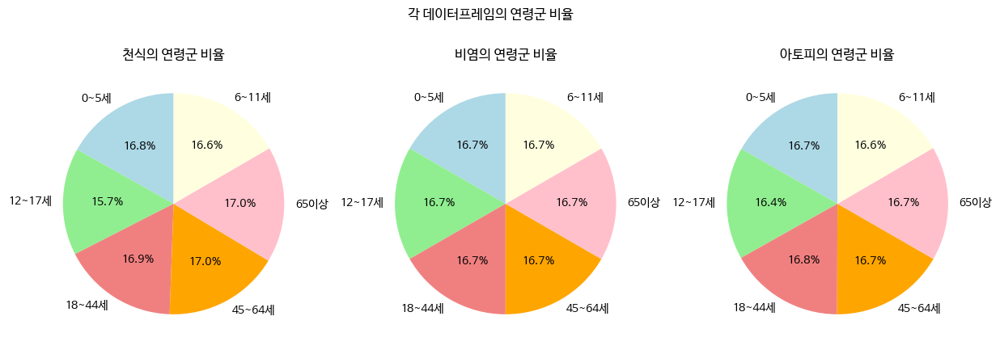

In [ ]:
age_labels = {
    0: '0~5세',
    1: '6~11세',
    2: '12~17세',
    3: '18~44세',
    4: '45~64세',
    5: '65이상'
}

# 그래프 출력
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# 파이 차트 그리기
for i, (df, condition) in enumerate(zip(dataframes, ['천식', '비염', '아토피'])):
    df['연령군'] = df['연령군'].map(age_labels)  # 라벨 적용

    age_group_counts = df['연령군'].value_counts().sort_index()
    total_count = len(df)
    age_group_ratios = age_group_counts / total_count

    age_group_ratios.plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=['lightblue', 'lightgreen', 'lightcoral', 'orange', 'pink', 'lightyellow'], ax=axs[i])
    axs[i].set_title(f'{condition}의 연령군 비율')
    axs[i].set_ylabel('')  # y축 레이블 제거

# 전체 그래프 제목
plt.suptitle('각 데이터프레임의 연령군 비율')

plt.show()

In [ ]:
def calculate_correlation(df):
    # Group by '지역명' and '요양개시연월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['지역명', '요양개시연월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate the correlation
    correlation = grouped_df['인구수'].corr(grouped_df['진료에피소드 건수'])

    print(f"Correlation between '인구수' and '진료에피소드 건수': {correlation}")

# Example usage
calculate_correlation(dfas_1)
calculate_correlation(dfat_1)
calculate_correlation(dfrh_1)


Correlation between '인구수' and '진료에피소드 건수': 0.801804710301994
Correlation between '인구수' and '진료에피소드 건수': 0.9456263085951894
Correlation between '인구수' and '진료에피소드 건수': 0.8845528339808628


## 인구수 처리 안한 시각화

아토피

In [ ]:
dfat_1.head()

,요양개시연월,주소(시도),주소(시군구),성별,연령군,진료에피소드 건수,인구수,시군구코드,시군구명,지역명
0,2013-01-01,서울,11110,1,0~5세,49,164634.0,11110,종로구,서울 종로구
1,2013-01-01,서울,11110,1,6~11세,20,164634.0,11110,종로구,서울 종로구
2,2013-01-01,서울,11110,1,12~17세,17,164634.0,11110,종로구,서울 종로구
3,2013-01-01,서울,11110,1,18~44세,52,164634.0,11110,종로구,서울 종로구
4,2013-01-01,서울,11110,1,45~64세,22,164634.0,11110,종로구,서울 종로구


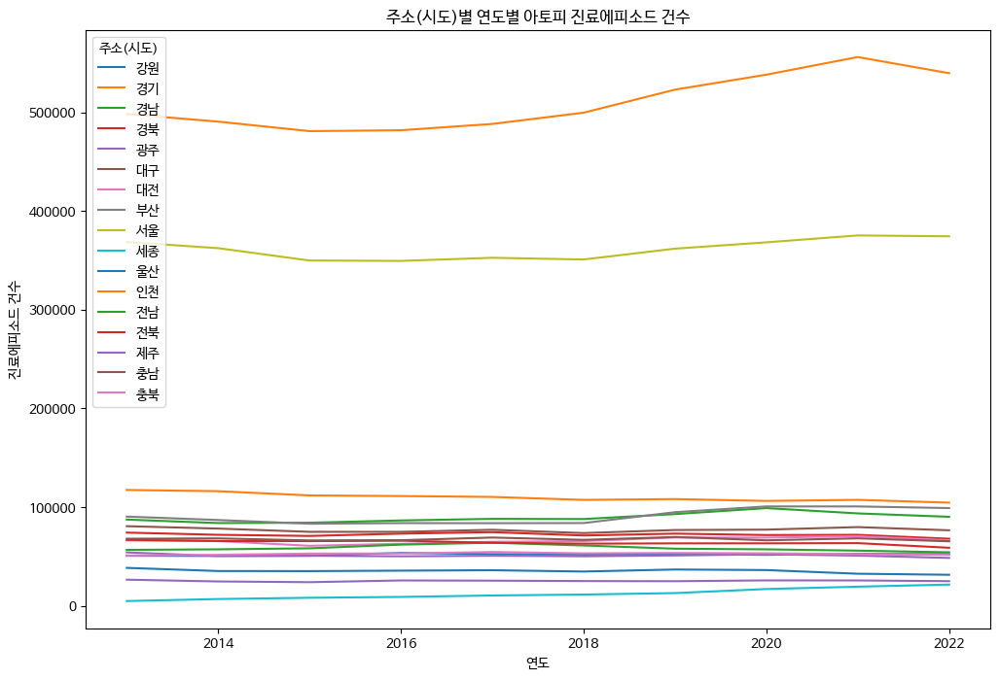

In [ ]:
dfat_1['요양개시연월'] = pd.to_datetime(dfat_1['요양개시연월'], format='%Y-%m-%d')
dfat_1['연도'] = dfat_1['요양개시연월'].dt.year

grouped_by_address_year = dfat_1.groupby(['주소(시도)', '연도']).agg({'진료에피소드 건수': 'sum'}).reset_index()

# 각 주소(시도)별로 선 그래프 그리기
plt.figure(figsize=(12, 8))

for address in grouped_by_address_year['주소(시도)'].unique():
    address_data = grouped_by_address_year[grouped_by_address_year['주소(시도)'] == address]
    plt.plot(address_data['연도'], address_data['진료에피소드 건수'], label=address)

# 레전드를 왼쪽에 위치
plt.legend(title='주소(시도)', loc='upper left')

plt.title('주소(시도)별 연도별 아토피 진료에피소드 건수')
plt.xlabel('연도')
plt.ylabel('진료에피소드 건수')
plt.show()

천식

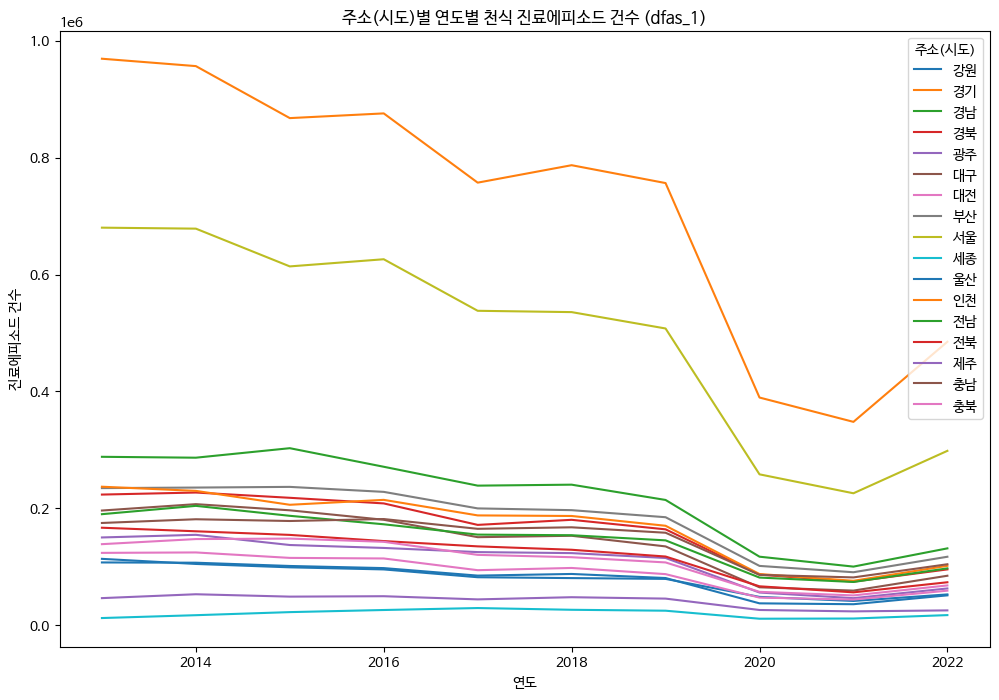

In [ ]:
dfas_1['요양개시연월'] = pd.to_datetime(dfas_1['요양개시연월'], format='%Y-%m-%d')
dfas_1['연도'] = dfas_1['요양개시연월'].dt.year

grouped_by_address_year_dfas = dfas_1.groupby(['주소(시도)', '연도']).agg({'진료에피소드 건수': 'sum'}).reset_index()

plt.figure(figsize=(12, 8))

for address in grouped_by_address_year_dfas['주소(시도)'].unique():
    address_data = grouped_by_address_year_dfas[grouped_by_address_year_dfas['주소(시도)'] == address]
    plt.plot(address_data['연도'], address_data['진료에피소드 건수'], label=address)

plt.title('주소(시도)별 연도별 천식 진료에피소드 건수 (dfas_1)')
plt.xlabel('연도')
plt.ylabel('진료에피소드 건수')
plt.legend(title='주소(시도)')
plt.show()

비염

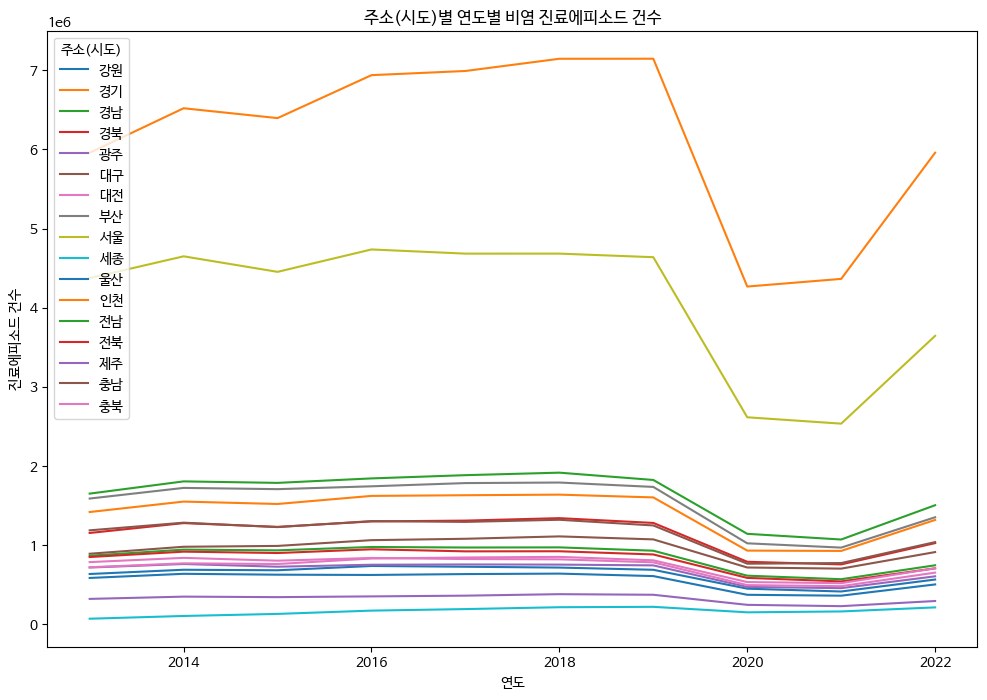

In [ ]:
dfrh_1['요양개시연월'] = pd.to_datetime(dfrh_1['요양개시연월'], format='%Y-%m-%d')
dfrh_1['연도'] = dfrh_1['요양개시연월'].dt.year

grouped_by_address_year_dfrh = dfrh_1.groupby(['주소(시도)', '연도']).agg({'진료에피소드 건수': 'sum'}).reset_index()

plt.figure(figsize=(12, 8))

for address in grouped_by_address_year_dfrh['주소(시도)'].unique():
    address_data = grouped_by_address_year_dfrh[grouped_by_address_year_dfrh['주소(시도)'] == address]
    plt.plot(address_data['연도'], address_data['진료에피소드 건수'], label=address)

plt.title('주소(시도)별 연도별 비염 진료에피소드 건수')
plt.xlabel('연도')
plt.ylabel('진료에피소드 건수')
plt.legend(title='주소(시도)',loc='upper left')
plt.show()

In [ ]:
plt.figure(figsize=(12, 8))

for address in grouped_dfat_1['주소(시도)'].unique():
    address_data = grouped_dfat_1[grouped_dfat_1['주소(시도)'] == address]
    plt.plot(address_data['월'], address_data['진료에피소드 건수'], label=address)

plt.title('주소(시도) 별 월별 진료에피소드 건수')
plt.xlabel('월')
plt.ylabel('진료에피소드 건수')
plt.legend(title='주소(시도)')
plt.show()

## 인구수 처리

## 연월 확인

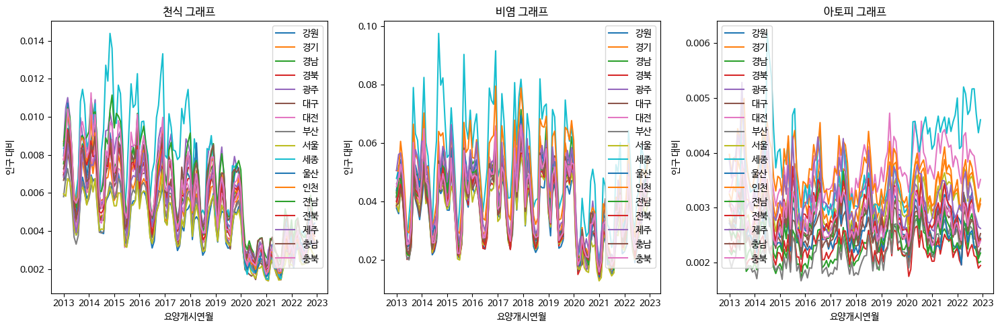

In [ ]:
for df in [aS, rH, aT]:
    df['요양개시연월'] = pd.to_datetime(df['요양개시연월'])

# 주소(시도)별로 그룹화하여 평균값 계산
grouped_aS = aS.groupby(['주소(시도)', '요양개시연월']).mean().reset_index()
grouped_rH = rH.groupby(['주소(시도)', '요양개시연월']).mean().reset_index()
grouped_aT = aT.groupby(['주소(시도)', '요양개시연월']).mean().reset_index()

# 그래프 그리기
plt.figure(figsize=(15, 5))

# aS 그래프
plt.subplot(1, 3, 1)
for address in grouped_aS['주소(시도)'].unique():
    subset = grouped_aS[grouped_aS['주소(시도)'] == address]
    plt.plot(subset['요양개시연월'], subset['인구 대비'], label=address)
plt.title('천식 그래프')
plt.xlabel('요양개시연월')
plt.ylabel('인구 대비')
plt.legend()

# rH 그래프
plt.subplot(1, 3, 2)
for address in grouped_rH['주소(시도)'].unique():
    subset = grouped_rH[grouped_rH['주소(시도)'] == address]
    plt.plot(subset['요양개시연월'], subset['인구 대비'], label=address)
plt.title('비염 그래프')
plt.xlabel('요양개시연월')
plt.ylabel('인구 대비')
plt.legend()

# aT 그래프
plt.subplot(1, 3, 3)
for address in grouped_aT['주소(시도)'].unique():
    subset = grouped_aT[grouped_aT['주소(시도)'] == address]
    plt.plot(subset['요양개시연월'], subset['인구 대비'], label=address)
plt.title('아토피 그래프')
plt.xlabel('요양개시연월')
plt.ylabel('인구 대비')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
rH['연도'] = pd.to_datetime(rH['요양개시연월'], format='%y').dt.year

# Example for aS dataframe
aS['연도'] = pd.to_datetime(aS['요양개시연월'], format='%y').dt.year

# Example for aT dataframe
aT['연도'] = pd.to_datetime(aT['요양개시연월'], format='%y').dt.year

<ipython-input-14-df20753d3008>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = rH.groupby(['주소(시도)', '연도']).mean().reset_index()


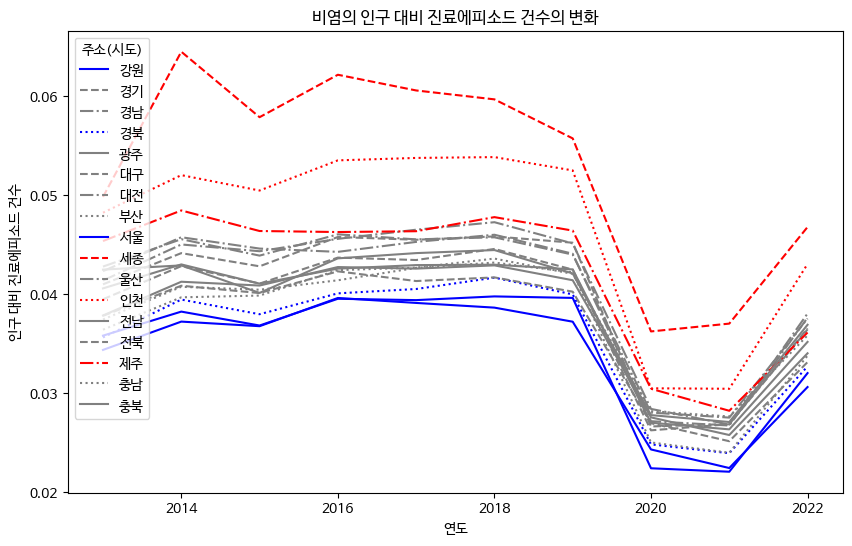

In [ ]:
grouped_df = rH.groupby(['주소(시도)', '연도']).mean().reset_index()

# 연도에 따른 평균 값이 가장 높은 3개의 지역, 가장 낮은 3개의 지역을 제외
top3 = grouped_df.groupby('주소(시도)')['인구 대비'].mean().nlargest(3).index
bottom3 = grouped_df.groupby('주소(시도)')['인구 대비'].mean().nsmallest(3).index

# Define a list of line styles and colors
line_styles = ['-', '--', '-.', ':']
colors = ['gray'] * len(grouped_df['주소(시도)'].unique())

# Iterate through unique addresses and apply different line styles and colors
plt.figure(figsize=(10, 6))
for i, address in enumerate(grouped_df['주소(시도)'].unique()):
    subset = grouped_df[grouped_df['주소(시도)'] == address]

    # Exclude top 3 and bottom 3 regions from different line styles and colors
    if address not in top3 and address not in bottom3:
        plt.plot(subset['연도'], subset['인구 대비'], label=address, linestyle=line_styles[i % len(line_styles)], color='gray')
    else:
        # Use different color for top 3 and bottom 3 regions
        color = 'red' if address in top3 else 'blue'
        plt.plot(subset['연도'], subset['인구 대비'], label=address, linestyle=line_styles[i % len(line_styles)], color=color)

plt.title('비염의 인구 대비 진료에피소드 건수의 변화')
plt.xlabel('연도')
plt.ylabel('인구 대비 진료에피소드 건수')
plt.legend(title='주소(시도)', loc='upper left')
plt.show()

<ipython-input-15-f80ce3bcaa41>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = aT.groupby(['주소(시도)', '연도']).mean().reset_index()


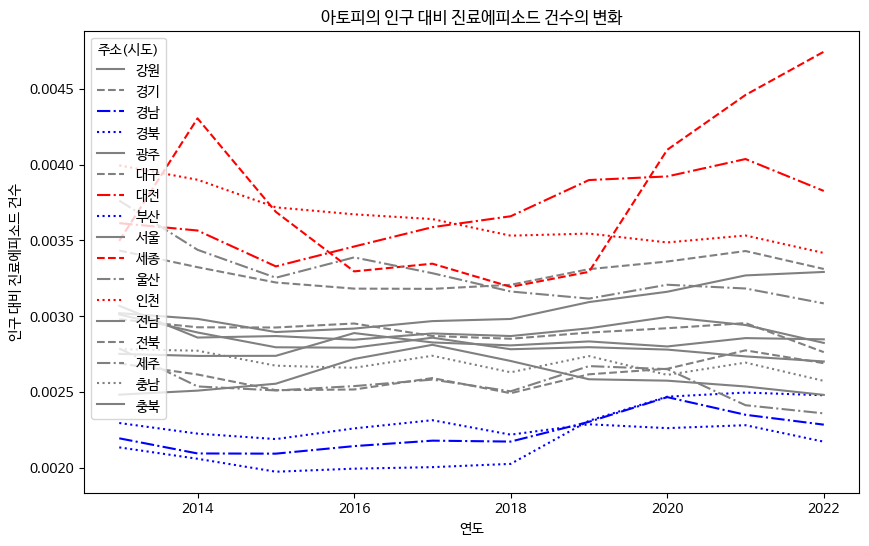

In [ ]:
grouped_df = aT.groupby(['주소(시도)', '연도']).mean().reset_index()

# 연도에 따른 평균 값이 가장 높은 3개의 지역, 가장 낮은 3개의 지역을 제외
top3 = grouped_df.groupby('주소(시도)')['인구 대비'].mean().nlargest(3).index
bottom3 = grouped_df.groupby('주소(시도)')['인구 대비'].mean().nsmallest(3).index

# Define a list of line styles and colors
line_styles = ['-', '--', '-.', ':']
colors = ['gray'] * len(grouped_df['주소(시도)'].unique())

# Iterate through unique addresses and apply different line styles and colors
plt.figure(figsize=(10, 6))
for i, address in enumerate(grouped_df['주소(시도)'].unique()):
    subset = grouped_df[grouped_df['주소(시도)'] == address]

    # Exclude top 3 and bottom 3 regions from different line styles and colors
    if address not in top3 and address not in bottom3:
        plt.plot(subset['연도'], subset['인구 대비'], label=address, linestyle=line_styles[i % len(line_styles)], color='gray')
    else:
        # Use different color for top 3 and bottom 3 regions
        color = 'red' if address in top3 else 'blue'
        plt.plot(subset['연도'], subset['인구 대비'], label=address, linestyle=line_styles[i % len(line_styles)], color=color)

plt.title('아토피의 인구 대비 진료에피소드 건수의 변화')
plt.xlabel('연도')
plt.ylabel('인구 대비 진료에피소드 건수')
plt.legend(title='주소(시도)', loc='upper left')
plt.show()

<ipython-input-16-6978a63ec83d>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = aS.groupby(['주소(시도)', '연도']).mean().reset_index()


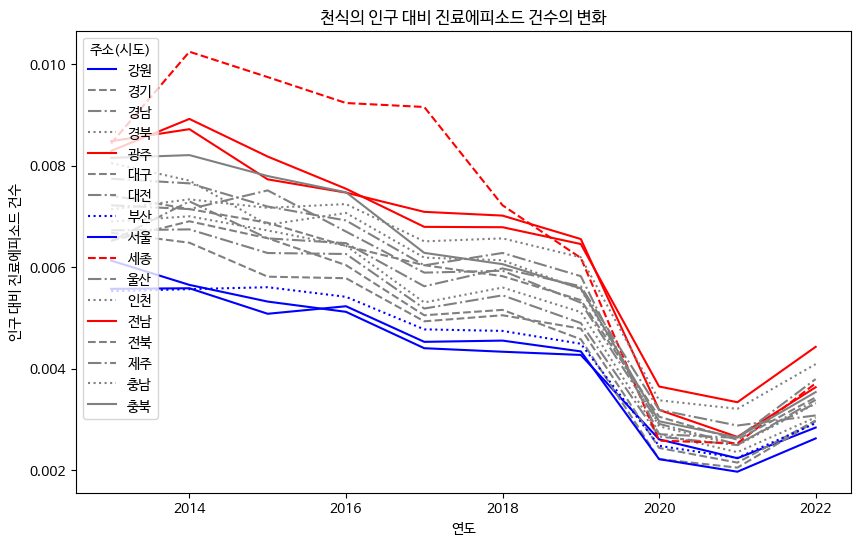

In [ ]:
grouped_df = aS.groupby(['주소(시도)', '연도']).mean().reset_index()

# 연도에 따른 평균 값이 가장 높은 3개의 지역, 가장 낮은 3개의 지역을 제외
top3 = grouped_df.groupby('주소(시도)')['인구 대비'].mean().nlargest(3).index
bottom3 = grouped_df.groupby('주소(시도)')['인구 대비'].mean().nsmallest(3).index

# Define a list of line styles and colors
line_styles = ['-', '--', '-.', ':']
colors = ['gray'] * len(grouped_df['주소(시도)'].unique())

# Iterate through unique addresses and apply different line styles and colors
plt.figure(figsize=(10, 6))
for i, address in enumerate(grouped_df['주소(시도)'].unique()):
    subset = grouped_df[grouped_df['주소(시도)'] == address]

    # Exclude top 3 and bottom 3 regions from different line styles and colors
    if address not in top3 and address not in bottom3:
        plt.plot(subset['연도'], subset['인구 대비'], label=address, linestyle=line_styles[i % len(line_styles)], color='gray')
    else:
        # Use different color for top 3 and bottom 3 regions
        color = 'red' if address in top3 else 'blue'
        plt.plot(subset['연도'], subset['인구 대비'], label=address, linestyle=line_styles[i % len(line_styles)], color=color)

plt.title('천식의 인구 대비 진료에피소드 건수의 변화')
plt.xlabel('연도')
plt.ylabel('인구 대비 진료에피소드 건수')
plt.legend(title='주소(시도)', loc='upper left')
plt.show()

<ipython-input-111-640a88978750>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = rH.groupby(['주소(시도)', '연도']).mean().reset_index()


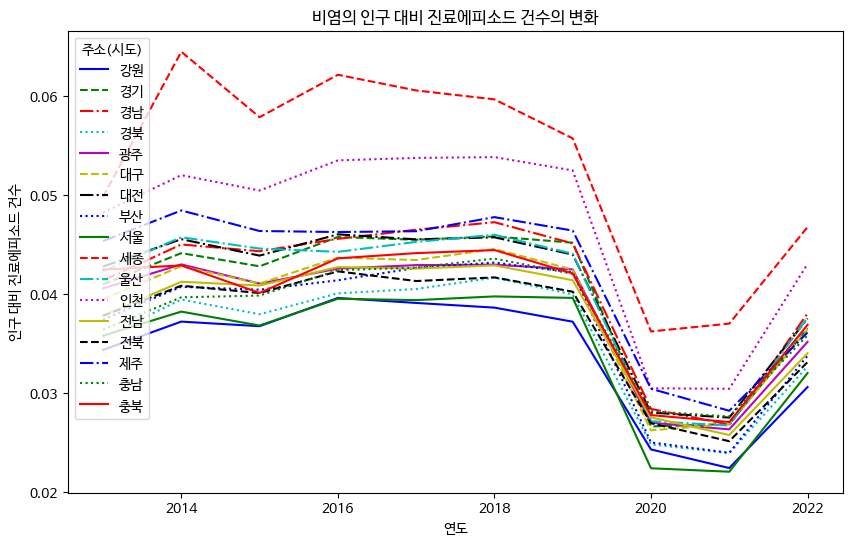

In [ ]:

grouped_df = rH.groupby(['주소(시도)', '연도']).mean().reset_index()

plt.figure(figsize=(10, 6))

# Define a list of line styles and colors
line_styles = ['-', '--', '-.', ':']
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

# Iterate through unique addresses and apply different line styles and colors
for i, address in enumerate(grouped_df['주소(시도)'].unique()):
    subset = grouped_df[grouped_df['주소(시도)'] == address]
    plt.plot(subset['연도'], subset['인구 대비'], label=address, linestyle=line_styles[i % len(line_styles)], color=colors[i % len(colors)])

plt.title('비염의 인구 대비 진료에피소드 건수의 변화')
plt.xlabel('연도')
plt.ylabel('인구 대비 진료에피소드 건수')
plt.legend(title='주소(시도)', loc='upper left')
plt.show()


<ipython-input-114-479fc2b43555>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = aS.groupby(['주소(시도)', '연도']).mean().reset_index()


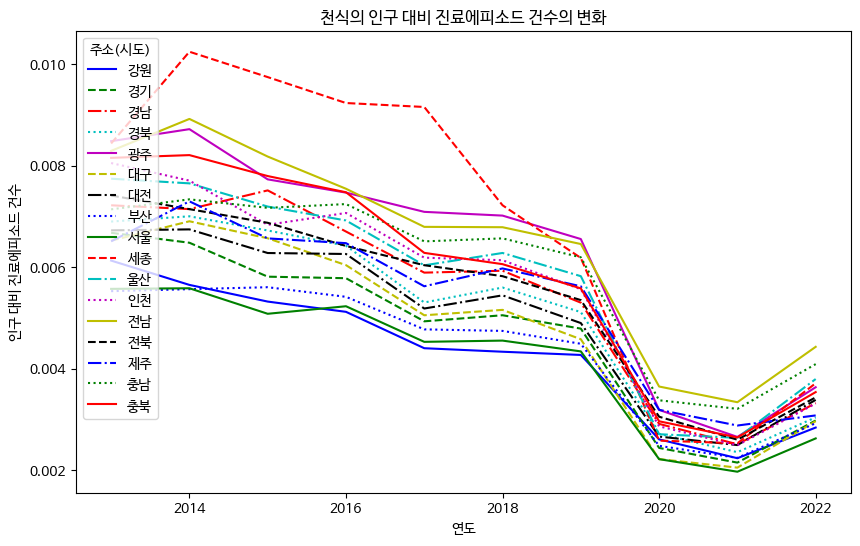

In [ ]:

grouped_df = aS.groupby(['주소(시도)', '연도']).mean().reset_index()

plt.figure(figsize=(10, 6))

# Define a list of line styles and colors
line_styles = ['-', '--', '-.', ':']
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

# Iterate through unique addresses and apply different line styles and colors
for i, address in enumerate(grouped_df['주소(시도)'].unique()):
    subset = grouped_df[grouped_df['주소(시도)'] == address]
    plt.plot(subset['연도'], subset['인구 대비'], label=address, linestyle=line_styles[i % len(line_styles)], color=colors[i % len(colors)])

plt.title('천식의 인구 대비 진료에피소드 건수의 변화')
plt.xlabel('연도')
plt.ylabel('인구 대비 진료에피소드 건수')
plt.legend(title='주소(시도)', loc='upper left')
plt.show()


<ipython-input-115-c23ab5c98b44>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = aT.groupby(['주소(시도)', '연도']).mean().reset_index()


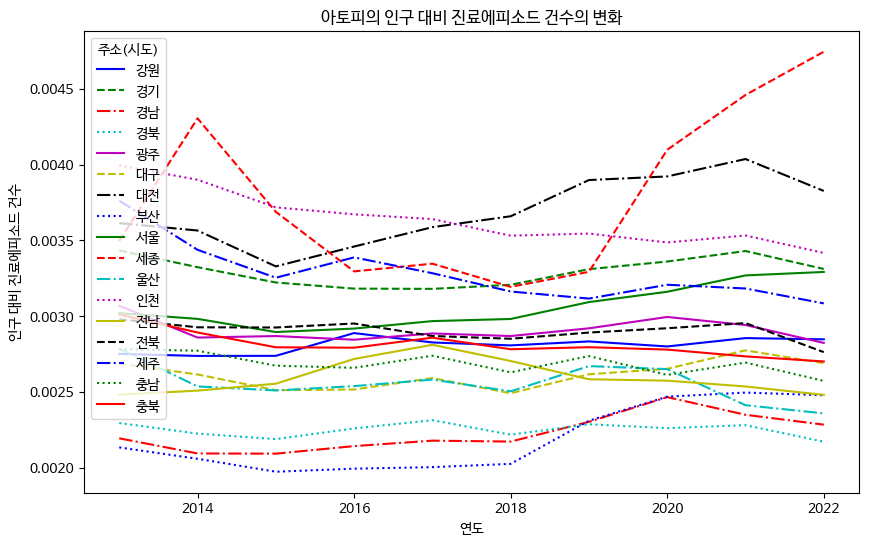

In [ ]:

grouped_df = aT.groupby(['주소(시도)', '연도']).mean().reset_index()

plt.figure(figsize=(10, 6))

# Define a list of line styles and colors
line_styles = ['-', '--', '-.', ':']
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

# Iterate through unique addresses and apply different line styles and colors
for i, address in enumerate(grouped_df['주소(시도)'].unique()):
    subset = grouped_df[grouped_df['주소(시도)'] == address]
    plt.plot(subset['연도'], subset['인구 대비'], label=address, linestyle=line_styles[i % len(line_styles)], color=colors[i % len(colors)])

plt.title('아토피의 인구 대비 진료에피소드 건수의 변화')
plt.xlabel('연도')
plt.ylabel('인구 대비 진료에피소드 건수')
plt.legend(title='주소(시도)', loc='upper left')
plt.show()


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


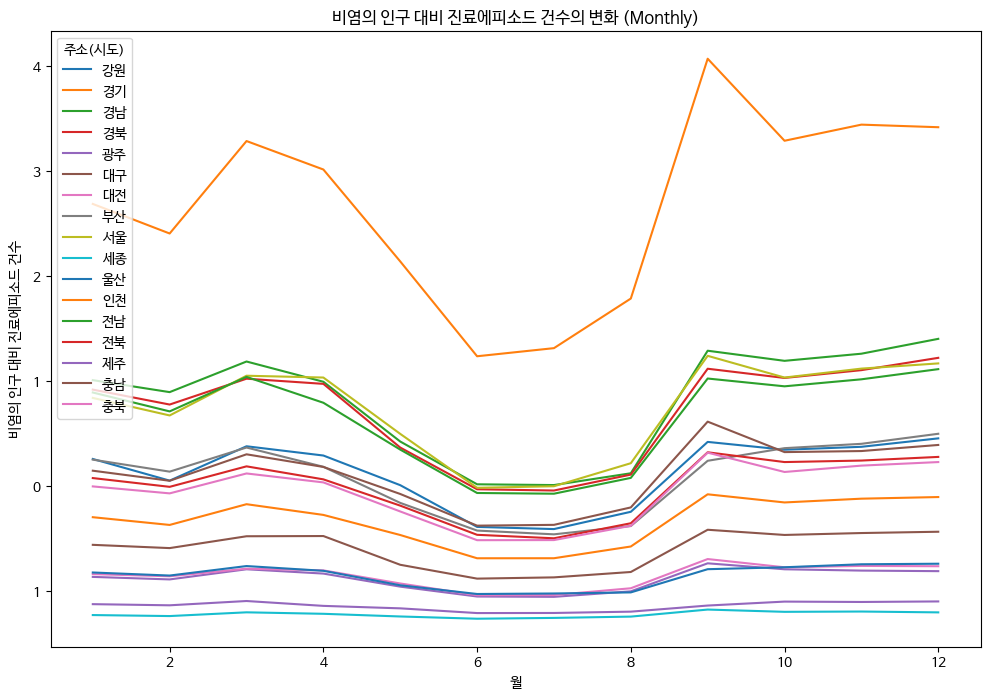

In [ ]:
def plot_standardized_data_monthly(df):
    # Convert '요양개시연월' to datetime and extract '연도' and '월'
    df['요양개시연월'] = pd.to_datetime(df['요양개시연월'], format='%Y-%m-%d')
    df['연도'] = df['요양개시연월'].dt.year
    df['월'] = df['요양개시연월'].dt.month

    # Group by '주소(시도)' and '월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['주소(시도)', '월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']
    scaler = StandardScaler()
    grouped_df['표준화'] = scaler.fit_transform(grouped_df[['인구 대비']])

    # Plotting
    plt.figure(figsize=(12, 8))

    # Assuming you have unique '주소(시도)' values
    for address in grouped_df['주소(시도)'].unique():
        subset = grouped_df[grouped_df['주소(시도)'] == address]
        plt.plot(subset['월'], subset['표준화'], label=address)

    plt.title('비염의 인구 대비 진료에피소드 건수의 변화 (Monthly)')
    plt.xlabel('월')
    plt.ylabel('비염의 인구 대비 진료에피소드 건수')
    plt.legend(title='주소(시도)',loc='upper left')
    plt.show()

# Example usage with dfrh_1
plot_standardized_data_monthly(dfrh_1)


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


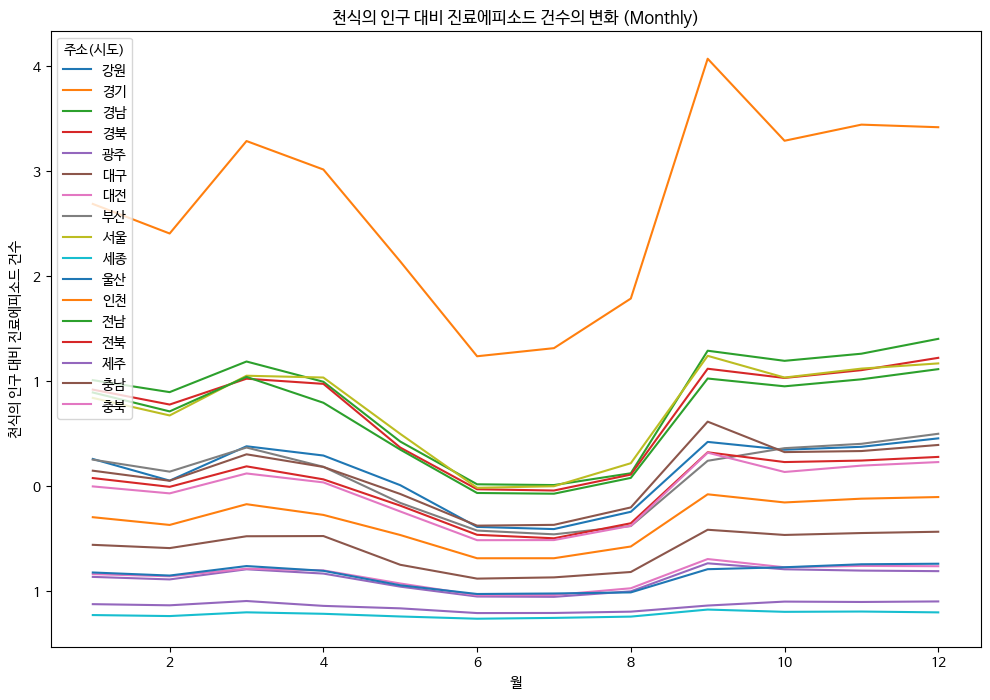

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


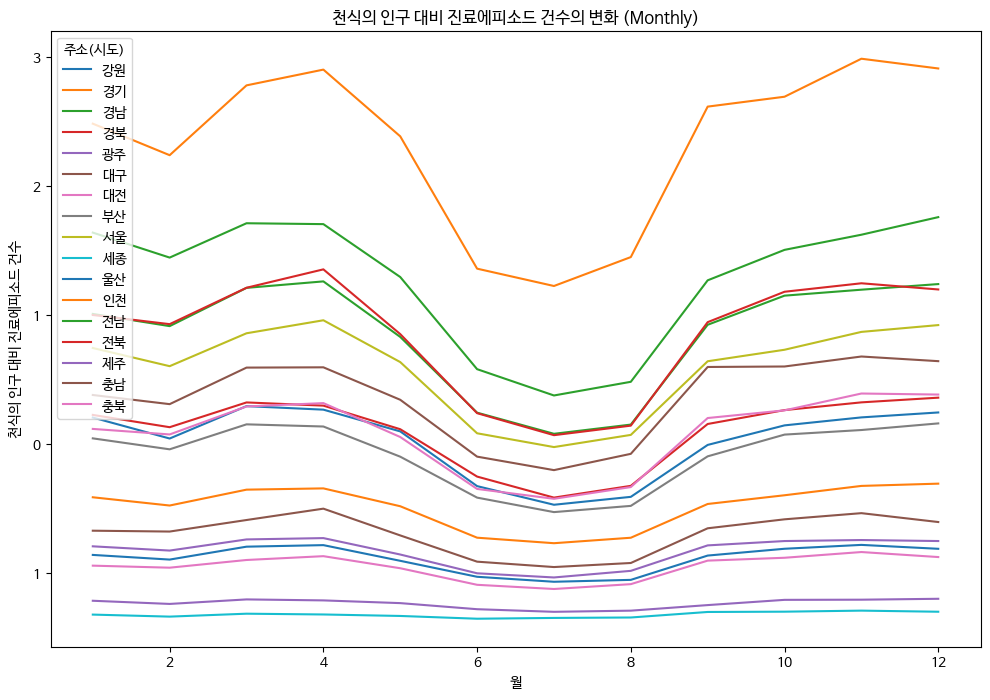

In [ ]:
def plot_standardized_data_monthly(df):
    # Convert '요양개시연월' to datetime and extract '연도' and '월'
    df['요양개시연월'] = pd.to_datetime(df['요양개시연월'], format='%Y-%m-%d')
    df['연도'] = df['요양개시연월'].dt.year
    df['월'] = df['요양개시연월'].dt.month

    # Group by '주소(시도)' and '월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['주소(시도)', '월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']
    scaler = StandardScaler()
    grouped_df['표준화'] = scaler.fit_transform(grouped_df[['인구 대비']])

    # Plotting
    plt.figure(figsize=(12, 8))

    # Assuming you have unique '주소(시도)' values
    for address in grouped_df['주소(시도)'].unique():
        subset = grouped_df[grouped_df['주소(시도)'] == address]
        plt.plot(subset['월'], subset['표준화'], label=address)

    plt.title('천식의 인구 대비 진료에피소드 건수의 변화 (Monthly)')
    plt.xlabel('월')
    plt.ylabel('천식의 인구 대비 진료에피소드 건수')
    plt.legend(title='주소(시도)',loc='upper left')
    plt.show()

# Example usage with dfrh_1
plot_standardized_data_monthly(dfrh_1)

# Example usage with dfrh_1
plot_standardized_data_monthly(dfas_1)

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


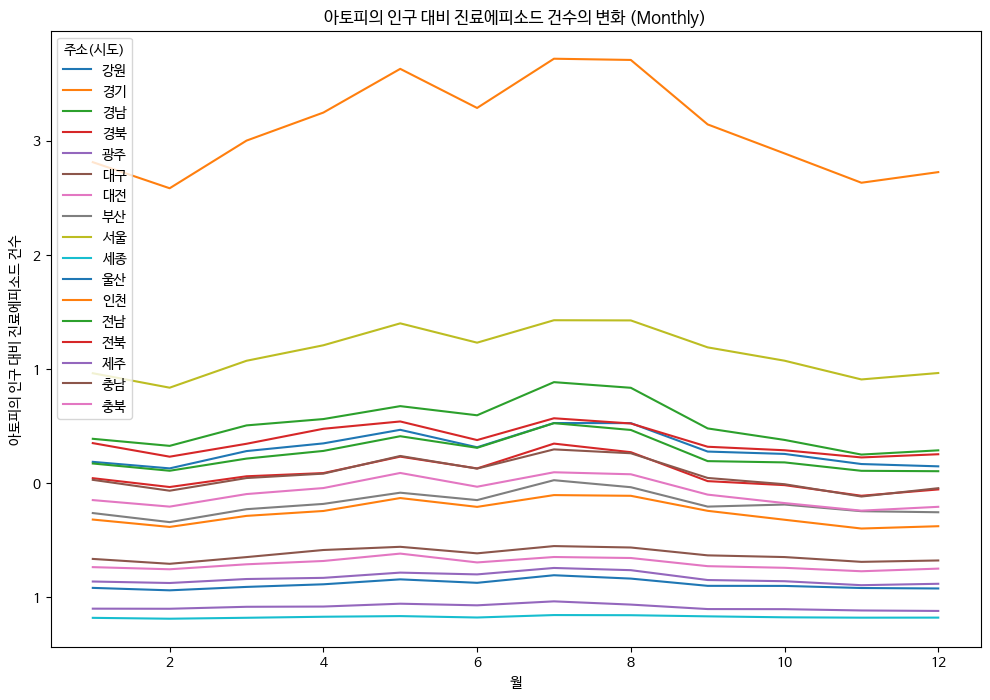

In [ ]:
def plot_standardized_data_monthly(df):
    # Convert '요양개시연월' to datetime and extract '연도' and '월'
    df['요양개시연월'] = pd.to_datetime(df['요양개시연월'], format='%Y-%m-%d')
    df['연도'] = df['요양개시연월'].dt.year
    df['월'] = df['요양개시연월'].dt.month

    # Group by '주소(시도)' and '월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['주소(시도)', '월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']
    scaler = StandardScaler()
    grouped_df['표준화'] = scaler.fit_transform(grouped_df[['인구 대비']])

    # Plotting
    plt.figure(figsize=(12, 8))

    # Assuming you have unique '주소(시도)' values
    for address in grouped_df['주소(시도)'].unique():
        subset = grouped_df[grouped_df['주소(시도)'] == address]
        plt.plot(subset['월'], subset['표준화'], label=address)

    plt.title('아토피의 인구 대비 진료에피소드 건수의 변화 (Monthly)')
    plt.xlabel('월')
    plt.ylabel('아토피의 인구 대비 진료에피소드 건수')
    plt.legend(title='주소(시도)',loc='upper left')
    plt.show()

plot_standardized_data_monthly(dfat_1)

In [ ]:
rH['월'] = pd.to_datetime(rH['요양개시연월'], format='%m').dt.month

# Example for aS dataframe
aS['월'] = pd.to_datetime(aS['요양개시연월'], format='%m').dt.month

# Example for aT dataframe
aT['월'] = pd.to_datetime(aT['요양개시연월'], format='%m').dt.month

<ipython-input-125-a070bf32b006>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = rH.groupby(['주소(시도)', '월']).mean().reset_index()


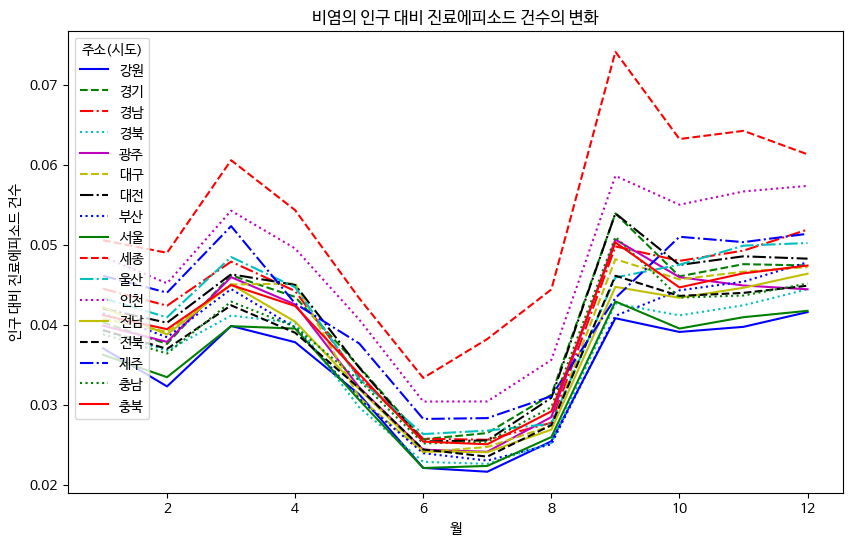

In [ ]:

grouped_df = rH.groupby(['주소(시도)', '월']).mean().reset_index()

plt.figure(figsize=(10, 6))

# Define a list of line styles and colors
line_styles = ['-', '--', '-.', ':']
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

# Iterate through unique addresses and apply different line styles and colors
for i, address in enumerate(grouped_df['주소(시도)'].unique()):
    subset = grouped_df[grouped_df['주소(시도)'] == address]
    plt.plot(subset['월'], subset['인구 대비'], label=address, linestyle=line_styles[i % len(line_styles)], color=colors[i % len(colors)])

plt.title('비염의 인구 대비 진료에피소드 건수의 변화')
plt.xlabel('월')
plt.ylabel('인구 대비 진료에피소드 건수')
plt.legend(title='주소(시도)', loc='upper left')
plt.show()


<ipython-input-126-c678f9ea04a1>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = aS.groupby(['주소(시도)', '월']).mean().reset_index()


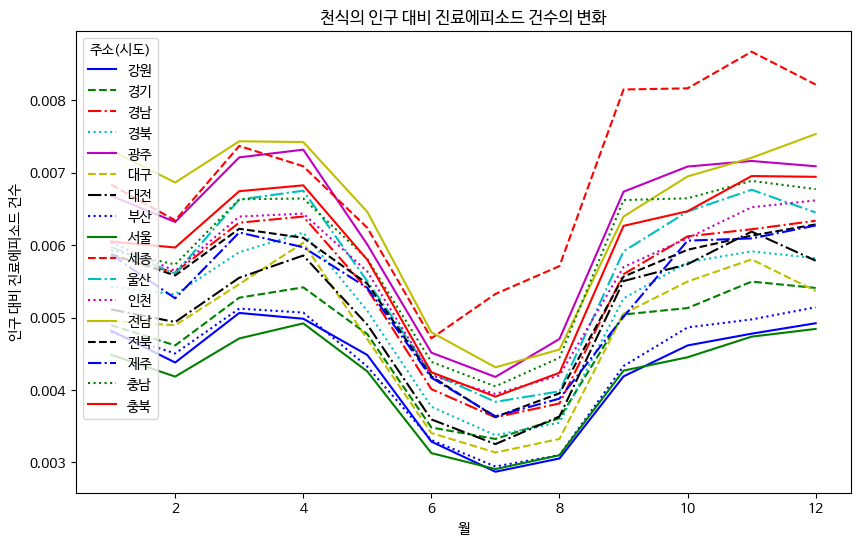

In [ ]:

grouped_df = aS.groupby(['주소(시도)', '월']).mean().reset_index()

plt.figure(figsize=(10, 6))

# Define a list of line styles and colors
line_styles = ['-', '--', '-.', ':']
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

# Iterate through unique addresses and apply different line styles and colors
for i, address in enumerate(grouped_df['주소(시도)'].unique()):
    subset = grouped_df[grouped_df['주소(시도)'] == address]
    plt.plot(subset['월'], subset['인구 대비'], label=address, linestyle=line_styles[i % len(line_styles)], color=colors[i % len(colors)])

plt.title('천식의 인구 대비 진료에피소드 건수의 변화')
plt.xlabel('월')
plt.ylabel('인구 대비 진료에피소드 건수')
plt.legend(title='주소(시도)', loc='upper left')
plt.show()


<ipython-input-127-fbd74eb93f6c>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = aT.groupby(['주소(시도)', '월']).mean().reset_index()


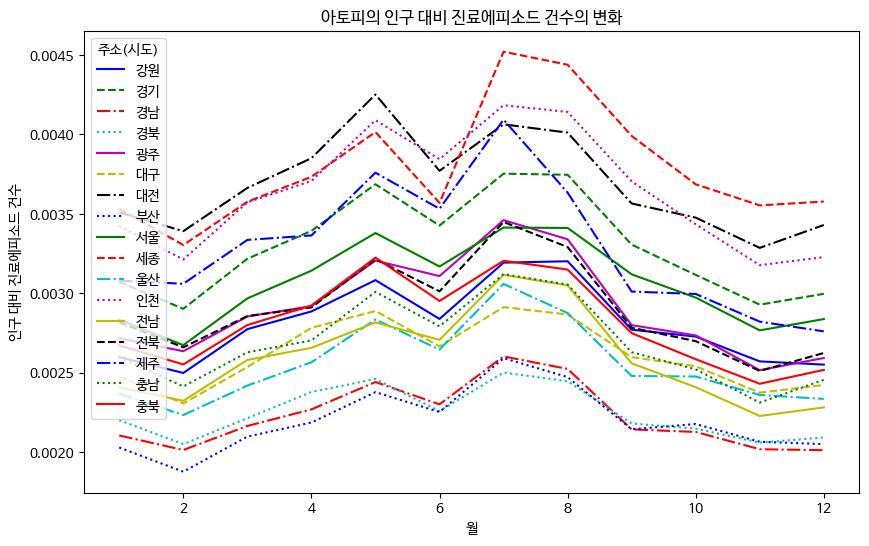

In [ ]:

grouped_df = aT.groupby(['주소(시도)', '월']).mean().reset_index()

plt.figure(figsize=(10, 6))

# Define a list of line styles and colors
line_styles = ['-', '--', '-.', ':']
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

# Iterate through unique addresses and apply different line styles and colors
for i, address in enumerate(grouped_df['주소(시도)'].unique()):
    subset = grouped_df[grouped_df['주소(시도)'] == address]
    plt.plot(subset['월'], subset['인구 대비'], label=address, linestyle=line_styles[i % len(line_styles)], color=colors[i % len(colors)])

plt.title('아토피의 인구 대비 진료에피소드 건수의 변화')
plt.xlabel('월')
plt.ylabel('인구 대비 진료에피소드 건수')
plt.legend(title='주소(시도)', loc='upper left')
plt.show()


## 시군구별 인구 대비 진료 에피소드 건수 top, bottom 10

In [ ]:
dfas_1.head()

,요양개시연월,주소(시도),주소(시군구),성별,연령군,진료에피소드 건수,인구수,시군구코드,시군구명,지역명,연도
0,2013-01-01,서울,11110,1,0,53,164634.0,11110,종로구,서울 종로구,2013
1,2013-01-01,서울,11110,1,1,47,164634.0,11110,종로구,서울 종로구,2013
2,2013-01-01,서울,11110,1,2,17,164634.0,11110,종로구,서울 종로구,2013
3,2013-01-01,서울,11110,1,3,94,164634.0,11110,종로구,서울 종로구,2013
4,2013-01-01,서울,11110,1,4,109,164634.0,11110,종로구,서울 종로구,2013


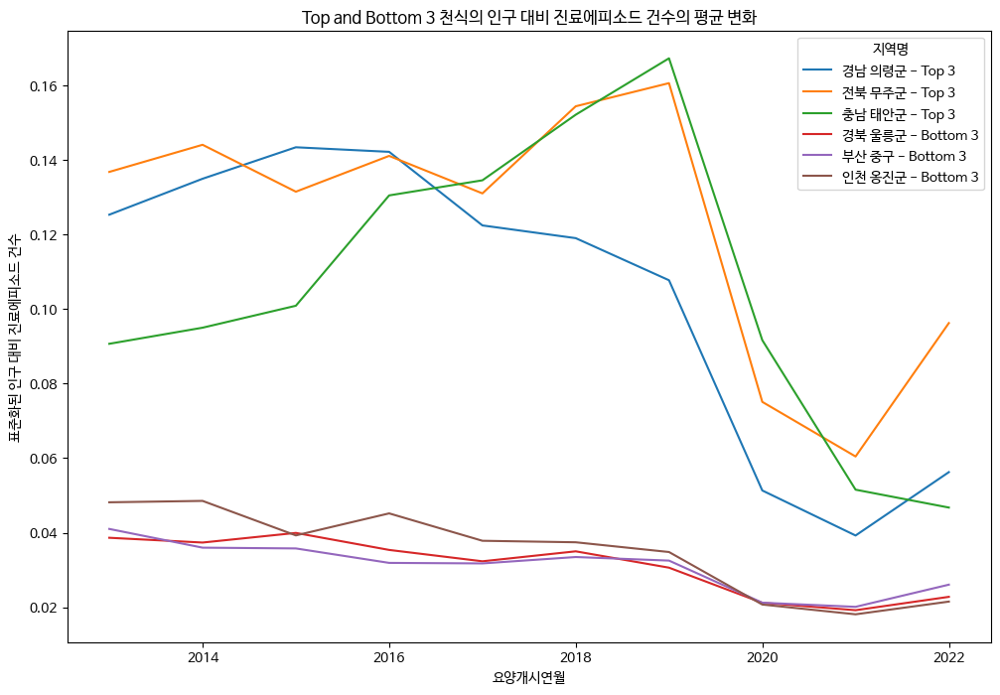

In [ ]:
def plot_top_bottom_addresses(df):
    # Group by '지역명' and '요양개시연월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['지역명', '연도']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']
    scaler = StandardScaler()
    grouped_df['표준화'] = scaler.fit_transform(grouped_df[['인구 대비']])

    # Calculate the 10-year average for each address
    avg_std_by_address = grouped_df.groupby('지역명')['인구 대비'].mean()

    # Manually select the top and bottom 10 addresses based on the 10-year average
    top_10_addresses = avg_std_by_address.nlargest(3).index
    bottom_10_addresses = avg_std_by_address.nsmallest(3).index

    # Filter the original dataframe for the selected addresses
    top_10_df = grouped_df[grouped_df['지역명'].isin(top_10_addresses)]
    bottom_10_df = grouped_df[grouped_df['지역명'].isin(bottom_10_addresses)]

    # Plotting for both top and bottom addresses on the same graph
    plt.figure(figsize=(12, 8))

    for address in top_10_df['지역명'].unique():
        subset = top_10_df[top_10_df['지역명'] == address]
        plt.plot(subset['연도'], subset['인구 대비'], label=f"{address} - Top 3")

    for address in bottom_10_df['지역명'].unique():
        subset = bottom_10_df[bottom_10_df['지역명'] == address]
        plt.plot(subset['연도'], subset['인구 대비'], label=f"{address} - Bottom 3")

    plt.title('Top and Bottom 3 천식의 인구 대비 진료에피소드 건수의 평균 변화')
    plt.xlabel('요양개시연월')
    plt.ylabel('표준화된 인구 대비 진료에피소드 건수')
    plt.legend(title='지역명')
    plt.show()

# Example usage with dfas_1
plot_top_bottom_addresses(dfas_1)


In [ ]:
dfas_2 = dfas_1.copy(
)
grouped_df = dfas_2.groupby(['지역명', '요양개시연월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean',
        '연도':'mean'
    }).reset_index()

grouped_df.head()

,지역명,요양개시연월,진료에피소드 건수,인구수,연도
0,강원 강릉시,2013-01-01,1293,217517.0,2013.0
1,강원 강릉시,2013-02-01,1209,217203.0,2013.0
2,강원 강릉시,2013-03-01,1378,217216.0,2013.0
3,강원 강릉시,2013-04-01,1327,217342.0,2013.0
4,강원 강릉시,2013-05-01,1204,217213.0,2013.0


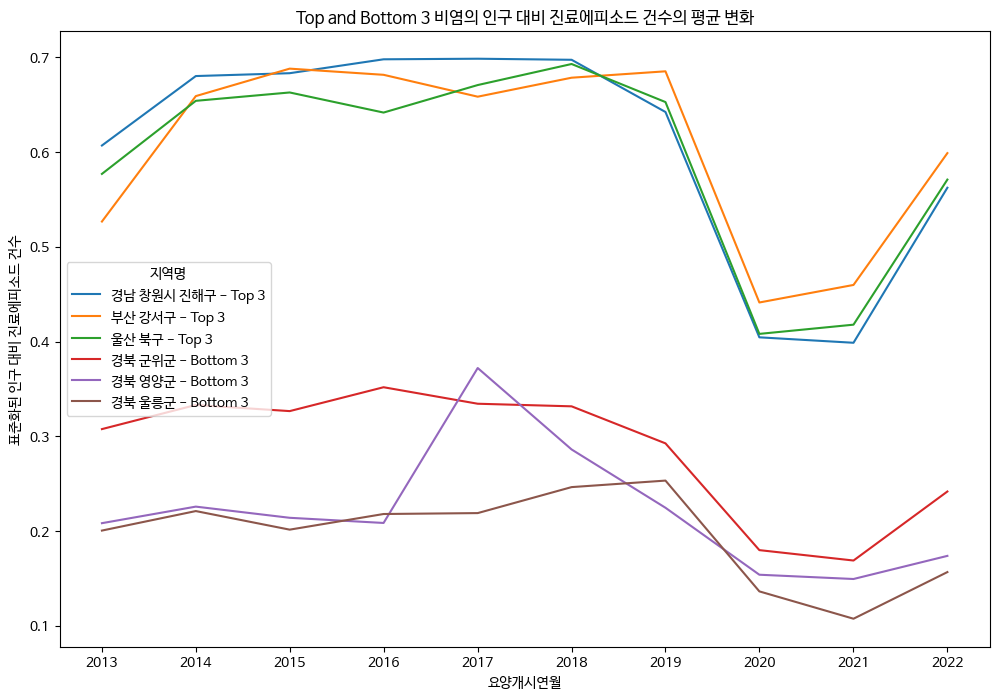

In [ ]:
def plot_top_bottom_addresses(df):
    # Group by '지역명' and '요양개시연월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['지역명', '요양개시연월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean',
         '연도':'mean'
    }).reset_index()

    grouped_df = df.groupby(['지역명', '연도']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean',

    }).reset_index()
    grouped_df['연도'] = pd.to_datetime(grouped_df['연도'], format='%Y')
    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']

    # Calculate the 10-year average for each address
    avg_std_by_address = grouped_df.groupby('지역명')['인구 대비'].mean()

    # Manually select the top and bottom 10 addresses based on the 10-year average
    top_10_addresses = avg_std_by_address.nlargest(3).index
    bottom_10_addresses = avg_std_by_address.nsmallest(3).index

    # Filter the original dataframe for the selected addresses
    top_10_df = grouped_df[grouped_df['지역명'].isin(top_10_addresses)]
    bottom_10_df = grouped_df[grouped_df['지역명'].isin(bottom_10_addresses)]

    # Plotting for both top and bottom addresses on the same graph
    plt.figure(figsize=(12, 8))

    for address in top_10_df['지역명'].unique():
        subset = top_10_df[top_10_df['지역명'] == address]
        plt.plot(subset['연도'], subset['인구 대비'], label=f"{address} - Top 3")

    for address in bottom_10_df['지역명'].unique():
        subset = bottom_10_df[bottom_10_df['지역명'] == address]
        plt.plot(subset['연도'], subset['인구 대비'], label=f"{address} - Bottom 3")

    plt.title('Top and Bottom 3 비염의 인구 대비 진료에피소드 건수의 평균 변화')
    plt.xlabel('요양개시연월')
    plt.ylabel('표준화된 인구 대비 진료에피소드 건수')
    plt.legend(title='지역명')
    plt.show()

plot_top_bottom_addresses(dfrh_1)

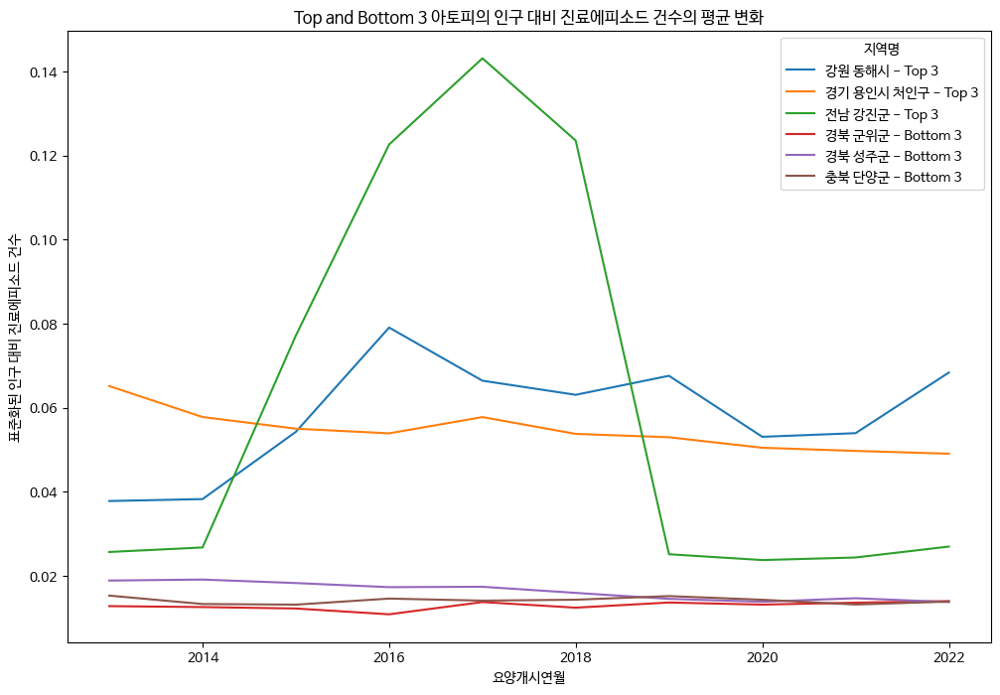

In [ ]:
def plot_top_bottom_addresses(df):
    # Group by '지역명' and '요양개시연월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['지역명', '요양개시연월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    grouped_df = df.groupby(['지역명', '요양개시연월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']
    scaler = StandardScaler()
    grouped_df['표준화'] = scaler.fit_transform(grouped_df[['인구 대비']])

    # Calculate the 10-year average for each address
    avg_std_by_address = grouped_df.groupby('지역명')['인구 대비'].mean()

    # Manually select the top and bottom 10 addresses based on the 10-year average
    top_10_addresses = avg_std_by_address.nlargest(3).index
    bottom_10_addresses = avg_std_by_address.nsmallest(3).index

    # Filter the original dataframe for the selected addresses
    top_10_df = grouped_df[grouped_df['지역명'].isin(top_10_addresses)]
    bottom_10_df = grouped_df[grouped_df['지역명'].isin(bottom_10_addresses)]

    # Plotting for both top and bottom addresses on the same graph
    plt.figure(figsize=(12, 8))

    for address in top_10_df['지역명'].unique():
        subset = top_10_df[top_10_df['지역명'] == address]
        plt.plot(subset['연도'], subset['인구 대비'], label=f"{address} - Top 3")

    for address in bottom_10_df['지역명'].unique():
        subset = bottom_10_df[bottom_10_df['지역명'] == address]
        plt.plot(subset['연도'], subset['인구 대비'], label=f"{address} - Bottom 3")

    plt.title('Top and Bottom 3 아토피의 인구 대비 진료에피소드 건수의 평균 변화')
    plt.xlabel('요양개시연월')
    plt.ylabel('표준화된 인구 대비 진료에피소드 건수')
    plt.legend(title='지역명')
    plt.show()

plot_top_bottom_addresses(dfat_1)

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


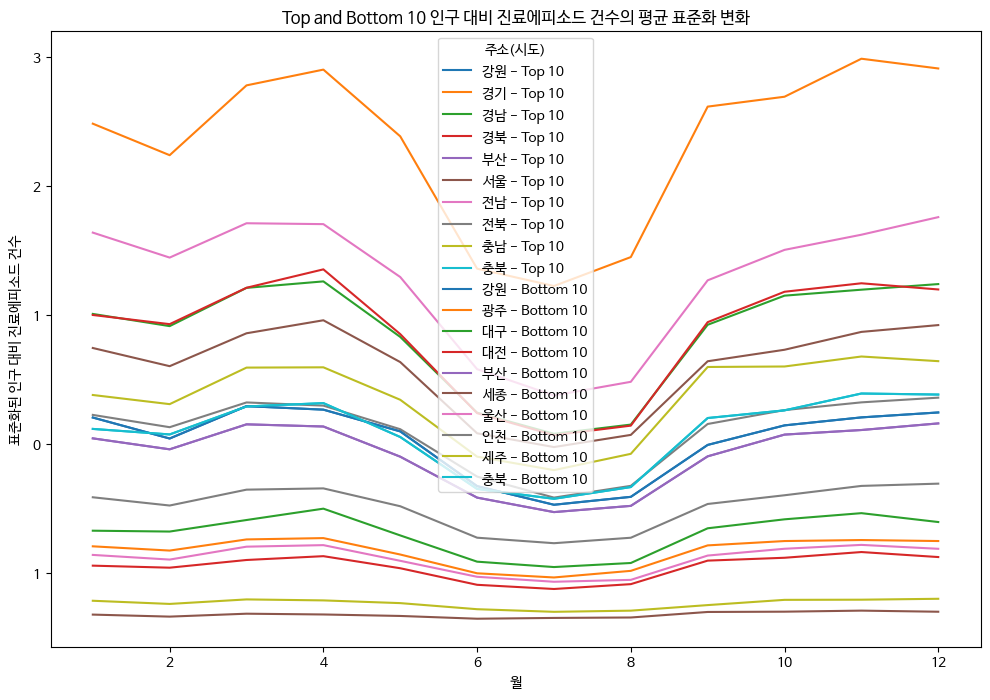

In [ ]:
def plot_top_bottom_addresses(df):
    # Group by '주소(시도)' and '월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['주소(시도)', '월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']
    scaler = StandardScaler()
    grouped_df['표준화'] = scaler.fit_transform(grouped_df[['인구 대비']])

    # Calculate the 10-year average for each address
    avg_std_by_address = grouped_df.groupby('주소(시도)')['표준화'].mean()

    # Select the top and bottom 10 addresses based on the 10-year average
    top_10_addresses = avg_std_by_address.nlargest(10).index
    bottom_10_addresses = avg_std_by_address.nsmallest(10).index

    # Filter the original dataframe for the selected addresses
    top_10_df = grouped_df[grouped_df['주소(시도)'].isin(top_10_addresses)]
    bottom_10_df = grouped_df[grouped_df['주소(시도)'].isin(bottom_10_addresses)]

    # Plotting for selected addresses
    plt.figure(figsize=(12, 8))
    for address in top_10_df['주소(시도)'].unique():
        subset = top_10_df[top_10_df['주소(시도)'] == address]
        plt.plot(subset['월'], subset['표준화'], label=f"{address} - Top 10")

    for address in bottom_10_df['주소(시도)'].unique():
        subset = bottom_10_df[bottom_10_df['주소(시도)'] == address]
        plt.plot(subset['월'], subset['표준화'], label=f"{address} - Bottom 10")

    plt.title('Top and Bottom 10 인구 대비 진료에피소드 건수의 평균 표준화 변화')
    plt.xlabel('월')
    plt.ylabel('표준화된 인구 대비 진료에피소드 건수')
    plt.legend(title='주소(시도)')
    plt.show()

# Example usage with dfas_1
plot_top_bottom_addresses(dfas_1)


## 평균 인구 대비 진료 에피소드 건수


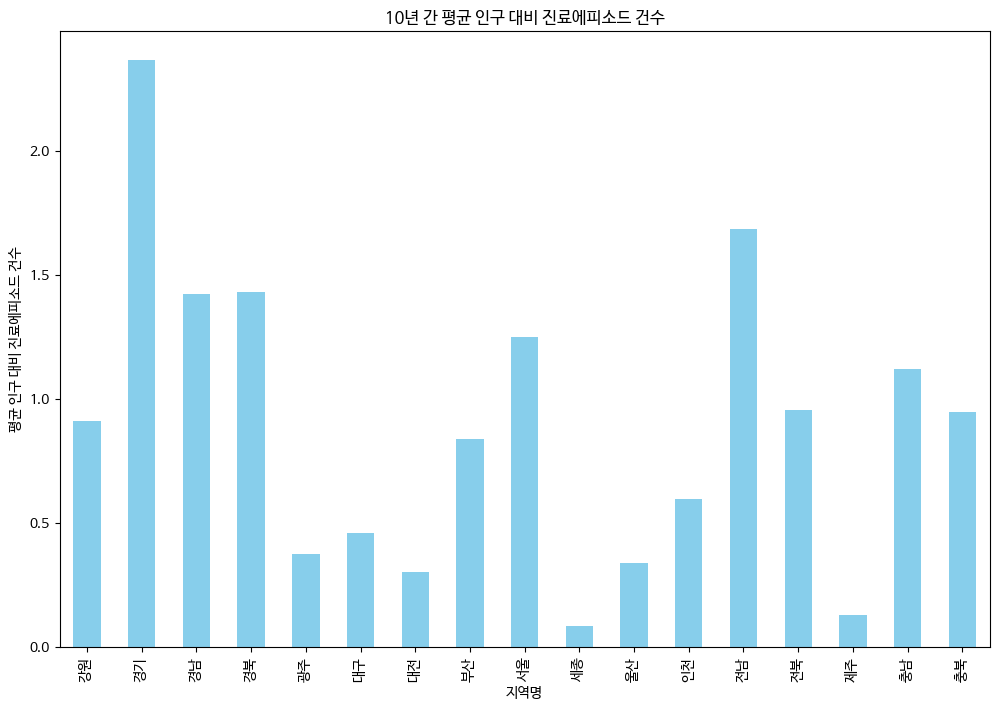

In [ ]:
import matplotlib.pyplot as plt

def plot_avg_popul(df):
    # Extract '연도' from '요양개시연월'
    df['연도'] = df['요양개시연월'].dt.year

    # Group by '주소(시도)' and '연도', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['주소(시도)', '연도']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']

    # Calculate the 10-year average for each region
    avg_by_region = grouped_df.groupby('주소(시도)')['인구 대비'].mean()

    # Plotting
    plt.figure(figsize=(12, 8))
    avg_by_region.plot(kind='bar', color='skyblue')
    plt.title('10년 간 평균 인구 대비 진료에피소드 건수')
    plt.xlabel('지역명')
    plt.ylabel('평균 인구 대비 진료에피소드 건수')
    plt.show()

# Example usage
plot_avg_popul(dfas_1)


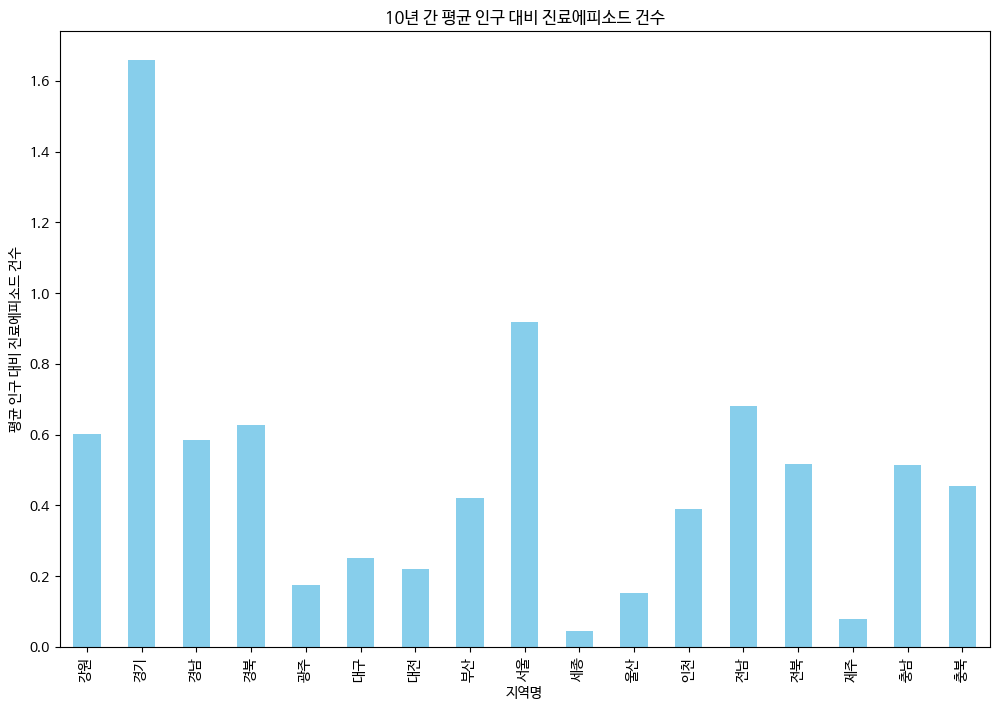

In [ ]:
plot_avg_popul(dfat_1)

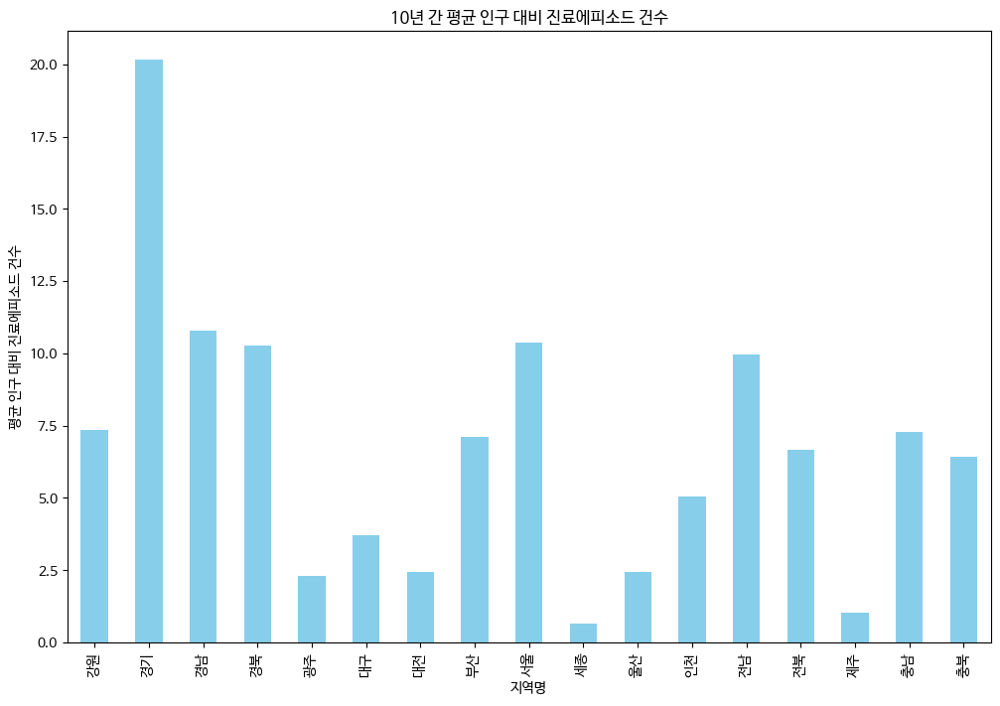

In [ ]:
plot_avg_popul(dfrh_1)

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


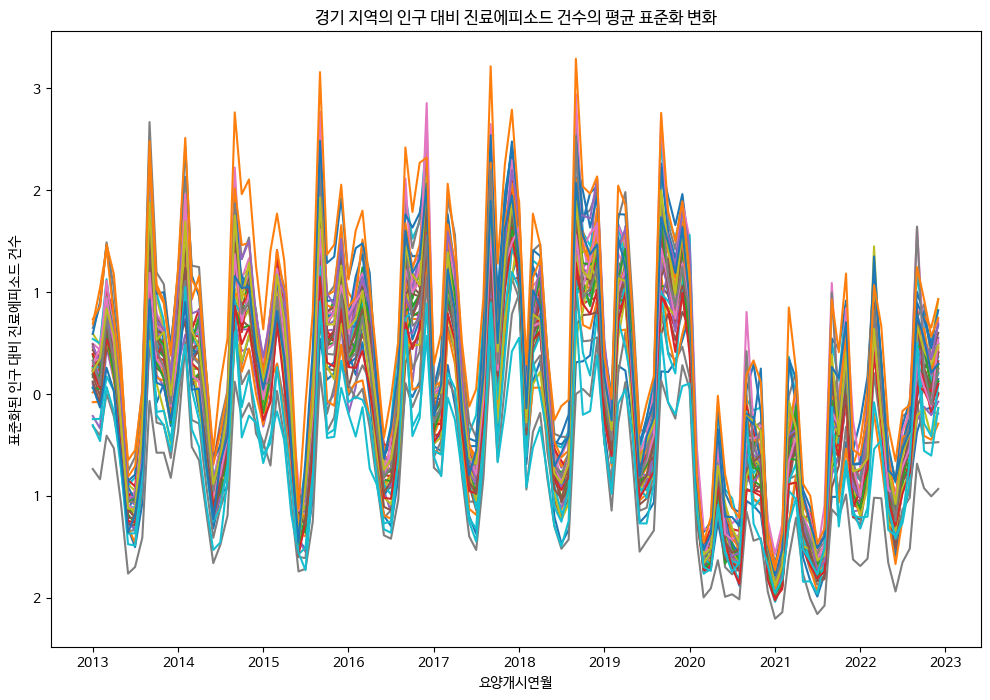

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


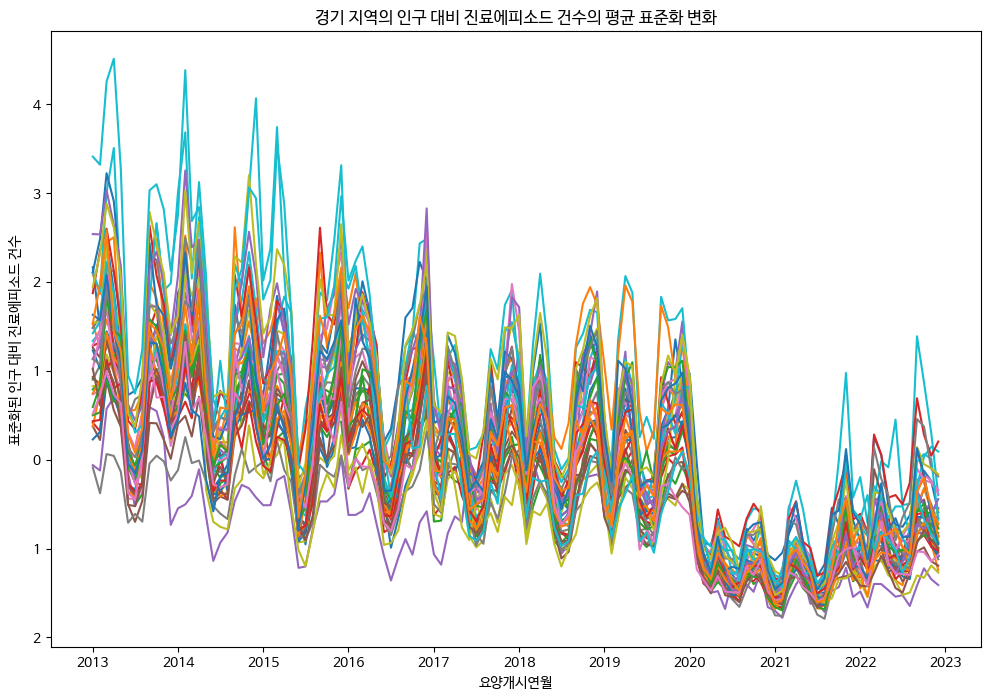

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


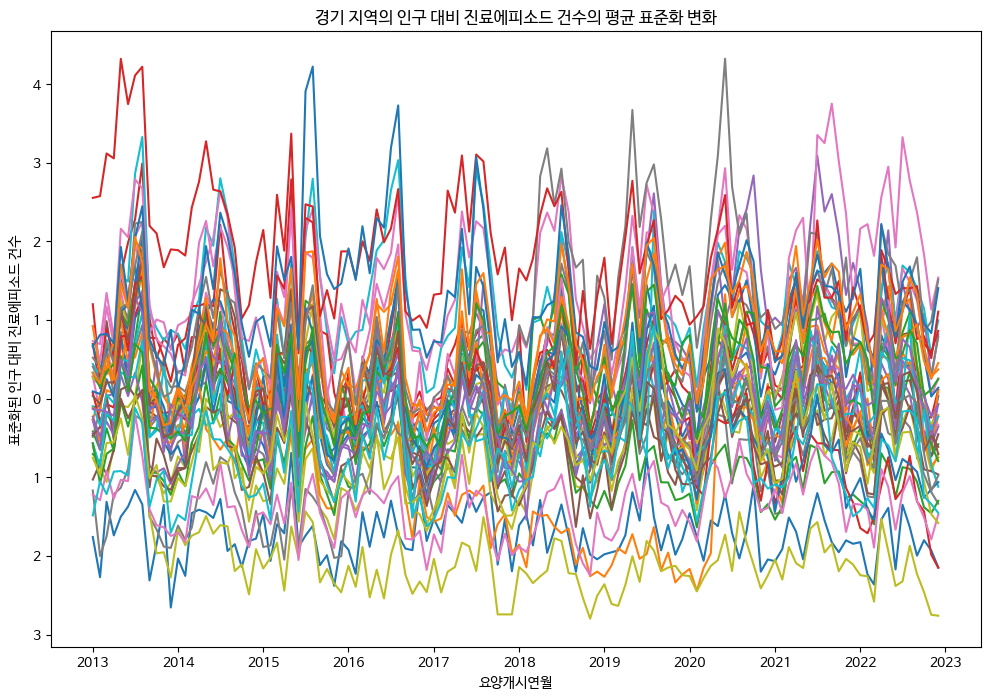

In [ ]:
def plot_gyeonggi_addresses(df):
    # Filter rows where '주소(시도)' is '경기'
    gyeonggi_df = df[df['주소(시도)'] == '경기']

    # Group by '지역명' and '요양개시연월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = gyeonggi_df.groupby(['지역명', '요양개시연월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']
    scaler = StandardScaler()
    grouped_df['표준화'] = scaler.fit_transform(grouped_df[['인구 대비']])

    # Plotting for '경기' addresses
    plt.figure(figsize=(12, 8))

    for region in grouped_df['지역명'].unique():
        subset = grouped_df[grouped_df['지역명'] == region]
        plt.plot(subset['요양개시연월'], subset['표준화'], label=region)

    plt.title('경기 지역의 인구 대비 진료에피소드 건수의 평균 표준화 변화')
    plt.xlabel('요양개시연월')
    plt.ylabel('표준화된 인구 대비 진료에피소드 건수')
    plt.show()

# Example usage with dfas_1
plot_gyeonggi_addresses(dfrh_1)
plot_gyeonggi_addresses(dfas_1)
plot_gyeonggi_addresses(dfat_1)


# 계절성 제거


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


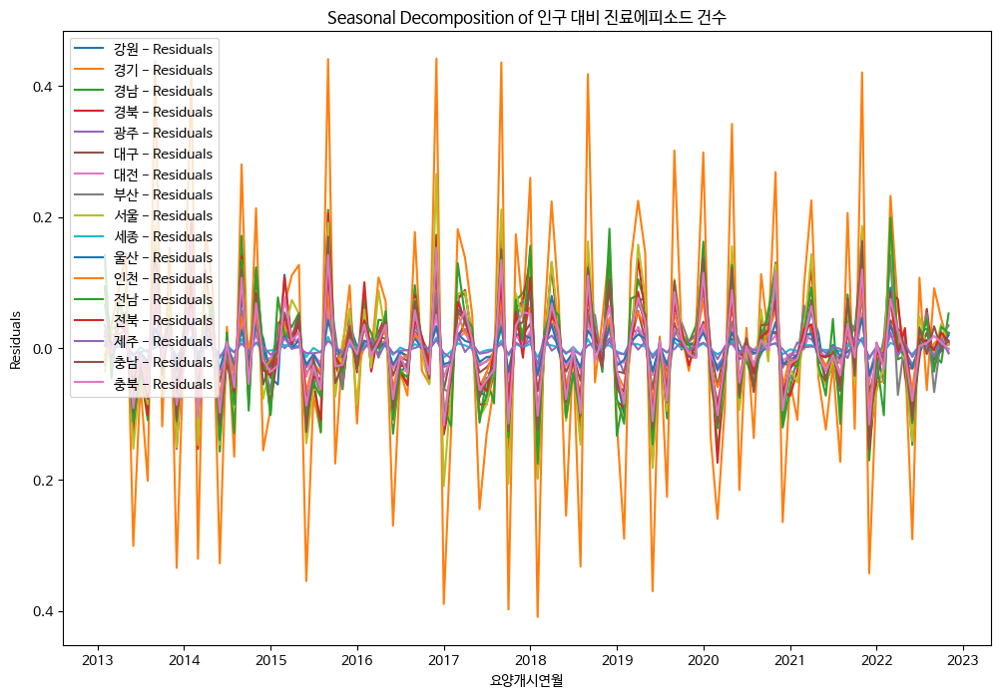

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.seasonal import seasonal_decompose

def plot_standardized_data(df):
    # Convert '요양개시연월' to datetime and extract '연도'
    df['요양개시연월'] = pd.to_datetime(df['요양개시연월'], format='%Y-%m-%d')
    df['연도'] = df['요양개시연월'].dt.year

    # Group by '주소(시도)' and '요양개시연월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['주소(시도)', '요양개시연월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']
    scaler = StandardScaler()
    grouped_df['표준화'] = scaler.fit_transform(grouped_df[['인구 대비']])

    # Seasonal decomposition
    plt.figure(figsize=(12, 8))

    for address in grouped_df['주소(시도)'].unique():
        subset = grouped_df[grouped_df['주소(시도)'] == address]
        subset.set_index('요양개시연월', inplace=True)
        decomposition = seasonal_decompose(subset['인구 대비'], period=3)  # Assuming monthly data

        plt.plot(subset.index, decomposition.resid, label=f"{address} - Residuals")

    # Plotting
    plt.title('Seasonal Decomposition of 인구 대비 진료에피소드 건수')
    plt.xlabel('요양개시연월')
    plt.ylabel('Residuals')
    plt.legend()
    plt.show()

# Example usage with dfrh_1
plot_standardized_data(dfrh_1)


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


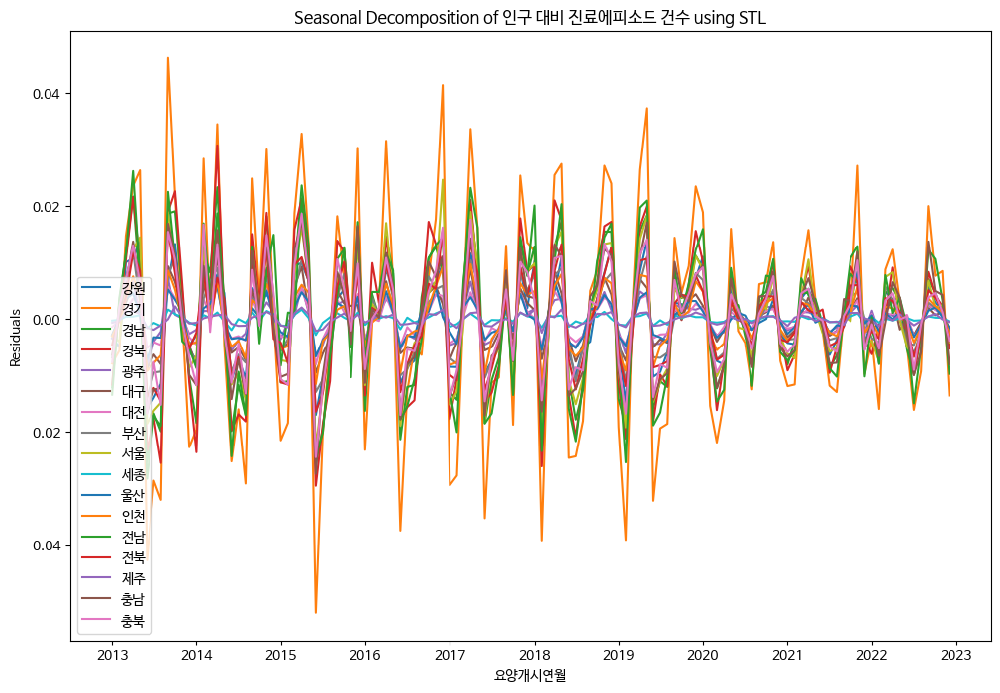

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.seasonal import STL

def plot_standardized_data(df):
    # Convert '요양개시연월' to datetime and extract '연도'
    df['요양개시연월'] = pd.to_datetime(df['요양개시연월'], format='%Y-%m-%d')
    df['연도'] = df['요양개시연월'].dt.year

    # Group by '주소(시도)' and '요양개시연월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['주소(시도)', '요양개시연월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']
    scaler = StandardScaler()
    grouped_df['표준화'] = scaler.fit_transform(grouped_df[['인구 대비']])

    # Seasonal decomposition using STL
    plt.figure(figsize=(12, 8))

    for address in grouped_df['주소(시도)'].unique():
        subset = grouped_df[grouped_df['주소(시도)'] == address]
        subset.set_index('요양개시연월', inplace=True)
        decomposition = STL(subset['인구 대비'], period=3).fit()  # Assuming monthly data

        plt.plot(subset.index, decomposition.resid, label=f"{address}")

    # Plotting
    plt.title('Seasonal Decomposition of 인구 대비 진료에피소드 건수 using STL')
    plt.xlabel('요양개시연월')
    plt.ylabel('Residuals')
    plt.legend()
    plt.show()

# Example usage with dfrh_1
plot_standardized_data(dfas_1)


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


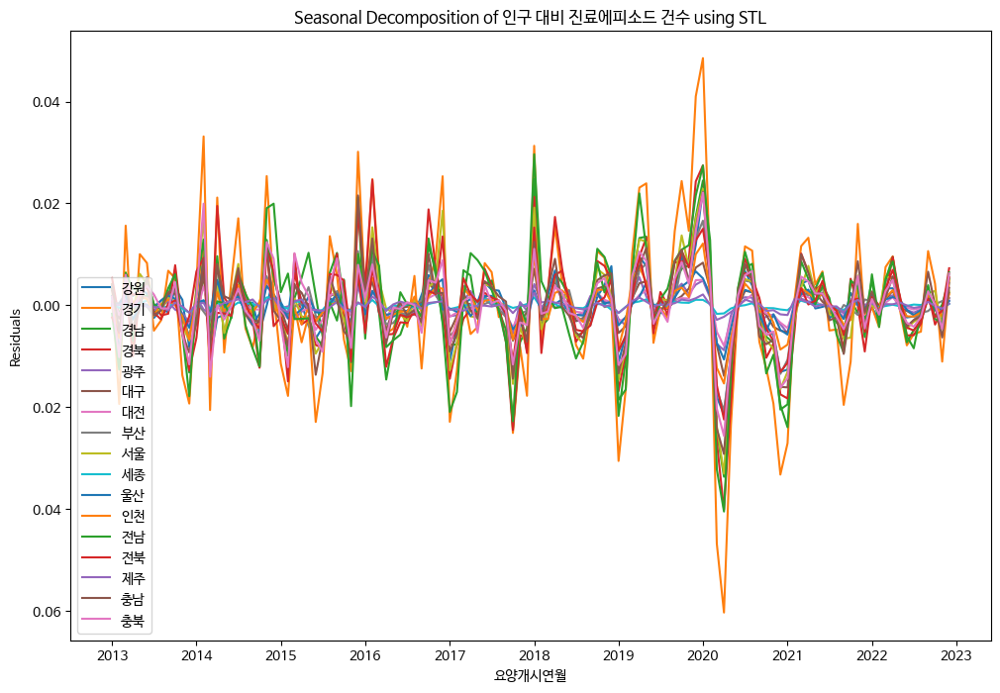

In [ ]:
plot_standardized_data(dfat_1)

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


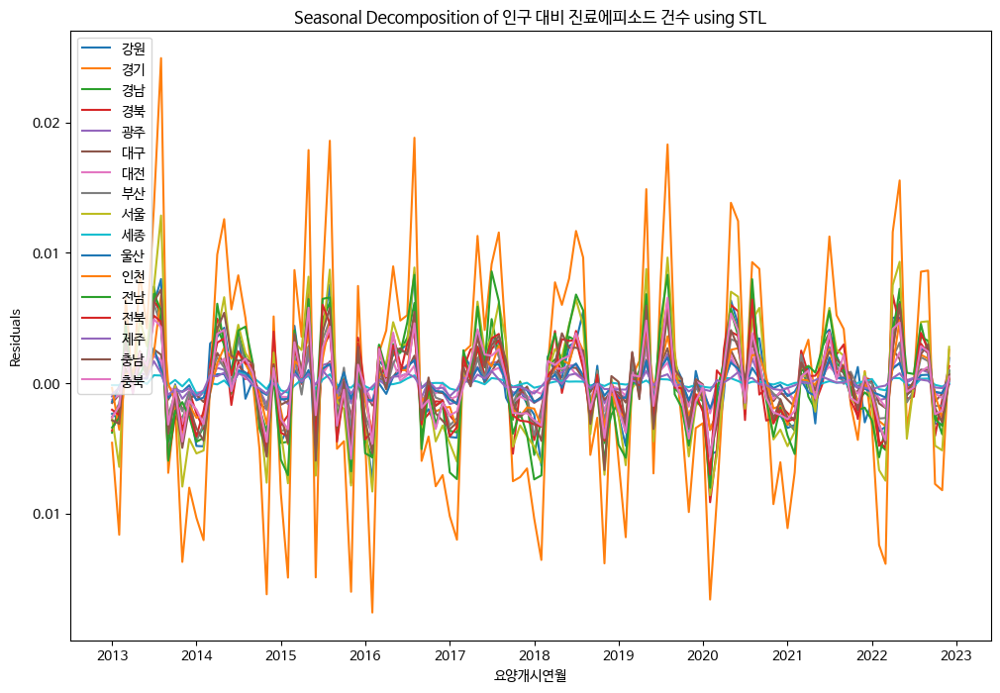

In [ ]:
def plot_standardized_data(df):
    # Convert '요양개시연월' to datetime and extract '연도'
    df['요양개시연월'] = pd.to_datetime(df['요양개시연월'], format='%Y-%m-%d')
    df['연도'] = df['요양개시연월'].dt.year

    # Group by '주소(시도)' and '요양개시연월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['주소(시도)', '요양개시연월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']
    scaler = StandardScaler()
    grouped_df['표준화'] = scaler.fit_transform(grouped_df[['인구 대비']])

    # Seasonal decomposition using STL
    plt.figure(figsize=(12, 8))

    for address in grouped_df['주소(시도)'].unique():
        subset = grouped_df[grouped_df['주소(시도)'] == address]
        subset.set_index('요양개시연월', inplace=True)
        decomposition = STL(subset['인구 대비'], period=6).fit()  # Assuming monthly data

        plt.plot(subset.index, decomposition.resid, label=f"{address}")
        #decomposition.plot()


    # Plotting
    plt.title('Seasonal Decomposition of 인구 대비 진료에피소드 건수 using STL')
    plt.xlabel('요양개시연월')
    plt.ylabel('Residuals')
    plt.legend()
    plt.show()


plot_standardized_data(dfat_1)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/seasonal.py:359: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.tight_layout()
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/seasonal.py:359: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.tight_layout()
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/seasonal.py:359: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.tight_layout()
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/seasonal.py:359: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.tight_layout()
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/seasonal.py:359: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.tight_layout()
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/seasonal.py:359: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.tight_layout()
/usr/local/lib/python3.10/di

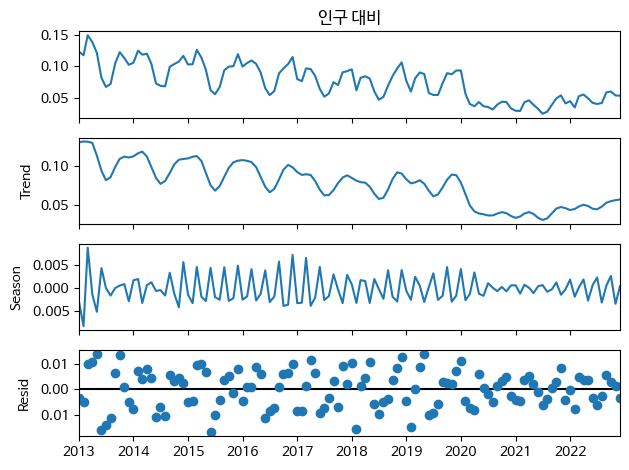

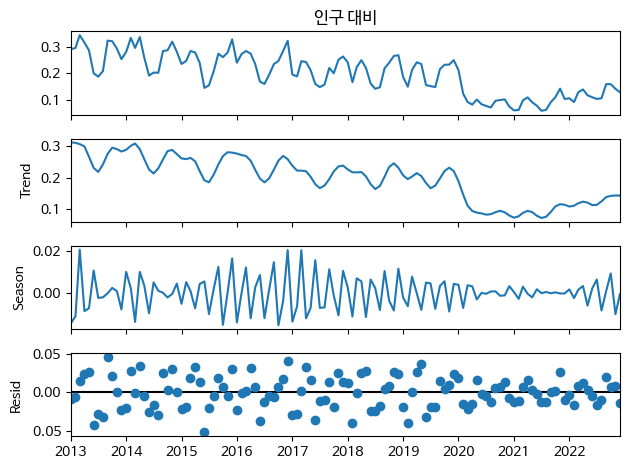

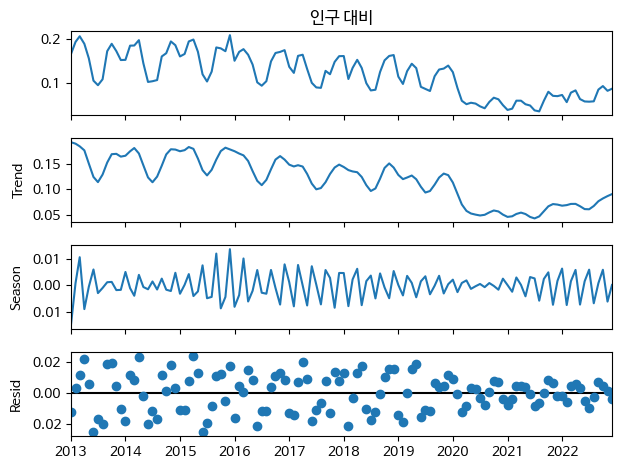

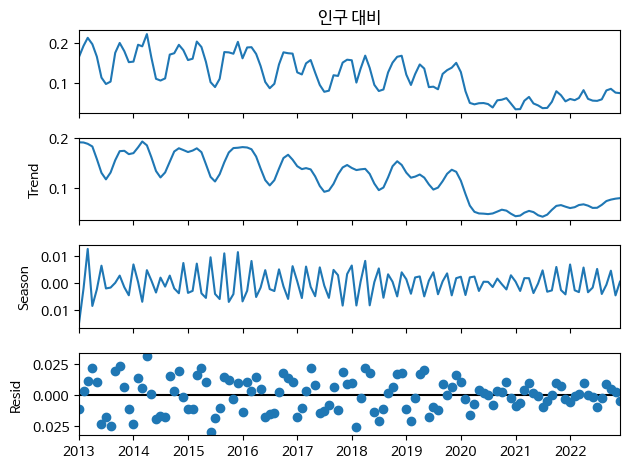

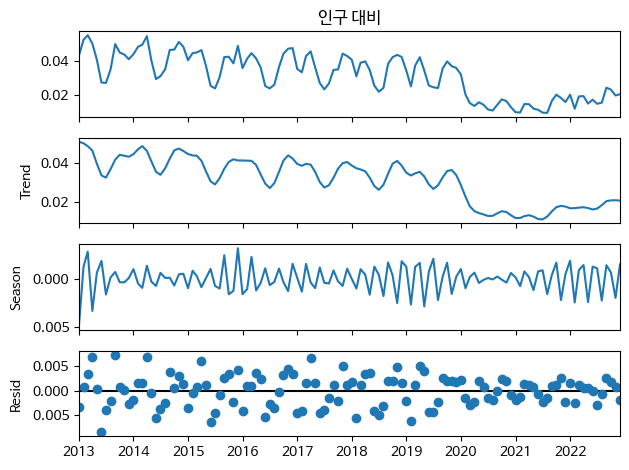

...

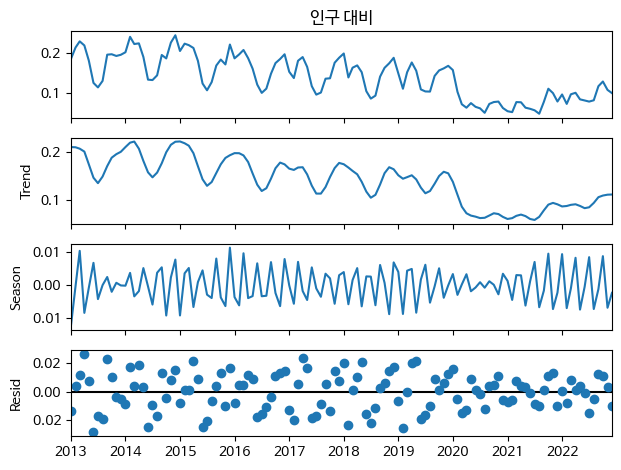

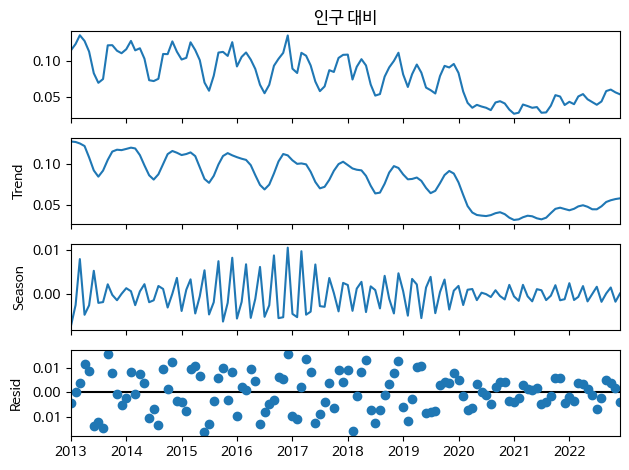

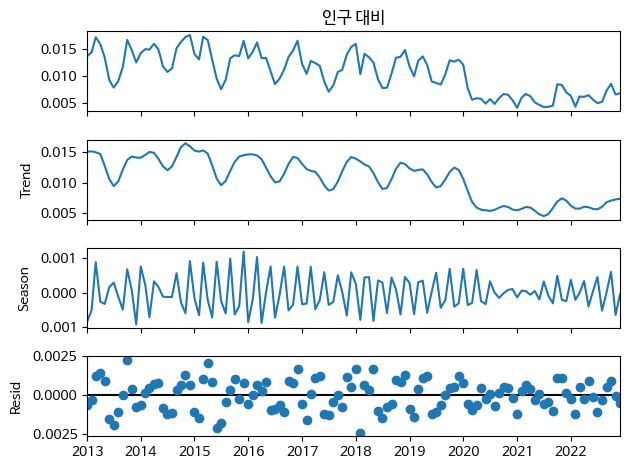

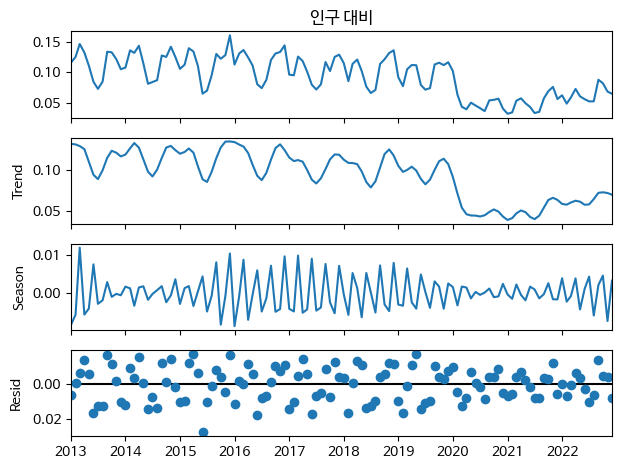

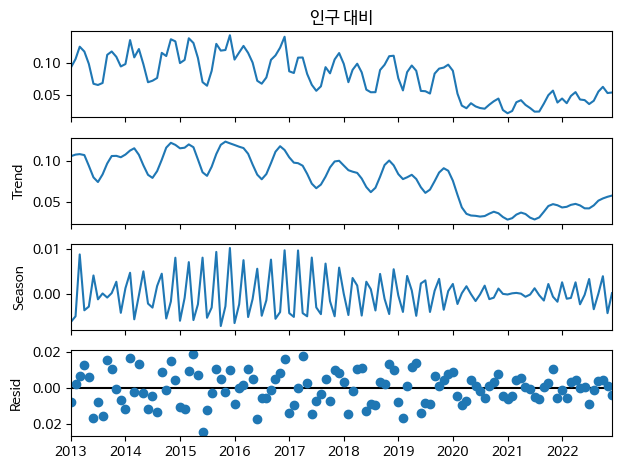

In [ ]:
def plot_standardized_data(df):
    # Convert '요양개시연월' to datetime and extract '연도'
    df['요양개시연월'] = pd.to_datetime(df['요양개시연월'], format='%Y-%m-%d')
    df['연도'] = df['요양개시연월'].dt.year

    # Group by '주소(시도)' and '요양개시연월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['주소(시도)', '요양개시연월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']
    scaler = StandardScaler()
    grouped_df['표준화'] = scaler.fit_transform(grouped_df[['인구 대비']])

    # Seasonal decomposition using STL
    #plt.figure(figsize=(12, 8))

    for address in grouped_df['주소(시도)'].unique():
        subset = grouped_df[grouped_df['주소(시도)'] == address]
        subset.set_index('요양개시연월', inplace=True)
        decomposition = STL(subset['인구 대비'], period=3).fit()  # Assuming monthly data
        decomposition.plot()


        #plt.plot(subset.index, decomposition.seasonal, label=f"{address}")

    # Plotting
    #plt.title('Seasonal Decomposition of 인구 대비 진료에피소드 건수 using STL')
    #plt.xlabel('요양개시연월')
    #plt.ylabel('Residuals')
    #plt.legend()
    #plt.show()

# Example usage with dfrh_1
plot_standardized_data(dfas_1)

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


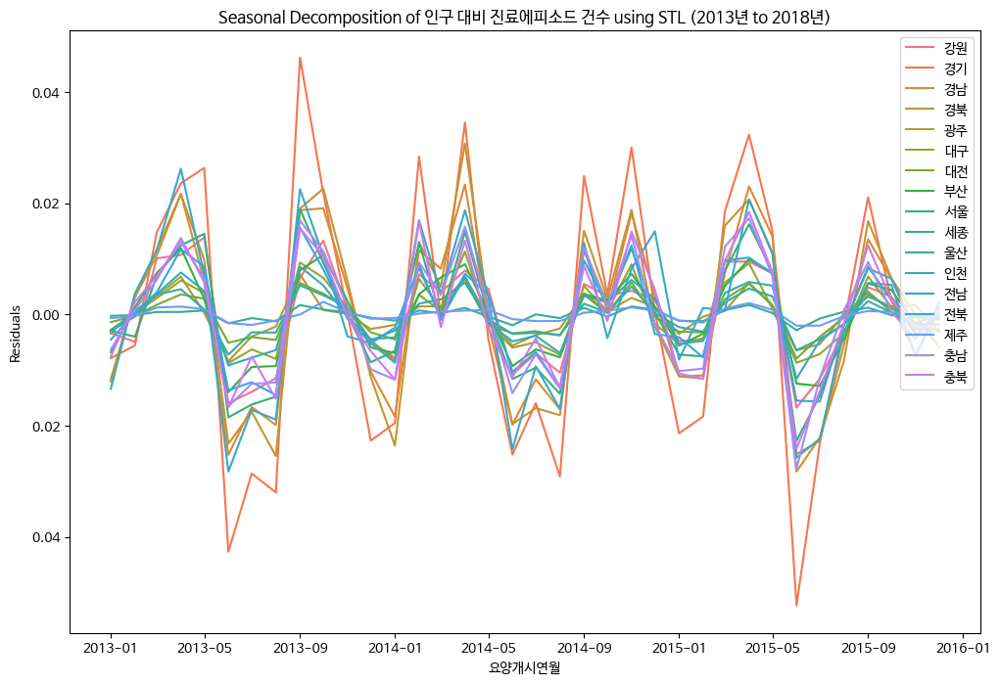

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.seasonal import STL
import seaborn as sns

def plot_standardized_data(df):
    # Convert '요양개시연월' to datetime and extract '연도'
    df['요양개시연월'] = pd.to_datetime(df['요양개시연월'], format='%Y-%m-%d')
    df['연도'] = df['요양개시연월'].dt.year

    # Group by '주소(시도)' and '요양개시연월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['주소(시도)', '요양개시연월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']
    scaler = StandardScaler()
    grouped_df['표준화'] = scaler.fit_transform(grouped_df[['인구 대비']])

    # Seasonal decomposition using STL
    plt.figure(figsize=(12, 8))

    # 사용할 Seaborn 색상 팔레트 생성 (8개의 서로 다른 색상)
    colors = sns.color_palette("husl", n_colors=20)

    for i, address in enumerate(grouped_df['주소(시도)'].unique()):
        subset = grouped_df[grouped_df['주소(시도)'] == address]
        subset.set_index('요양개시연월', inplace=True)

        # Subset the data for the desired time period (2013년 to 2018년)
        subset = subset.loc['2013-01-01':'2015-12-31']

        decomposition = STL(subset['인구 대비'], period=3).fit()  # Assuming monthly data
        # Use a different color for each line
        line_color = colors[i % len(colors)]  # 색상이 부족하면 다시 처음부터 사용

        # Plotting with distinct colors
        plt.plot(subset.index, decomposition.resid, label=f"{address}", color=line_color)


    # Plotting
    plt.title('Seasonal Decomposition of 인구 대비 진료에피소드 건수 using STL (2013년 to 2018년)')
    plt.xlabel('요양개시연월')
    plt.ylabel('Residuals')

    # Display the legend
    plt.legend()

    plt.show()

# Example usage with dfrh_1
plot_standardized_data(dfas_1)


<Figure size 1200x800 with 0 Axes>

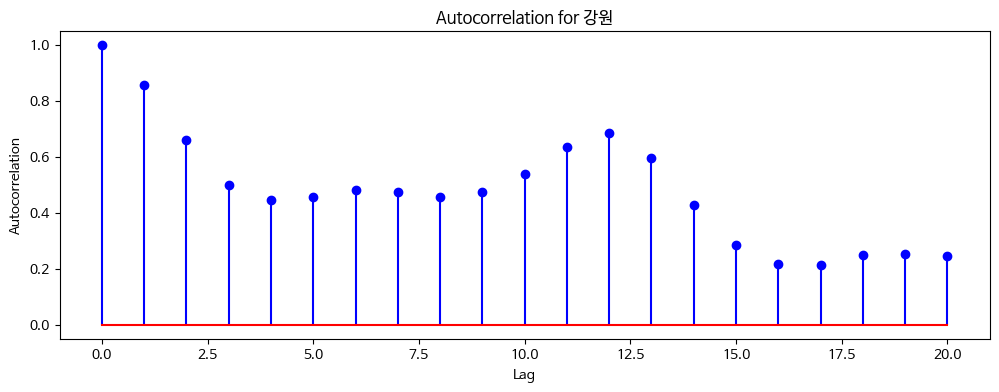

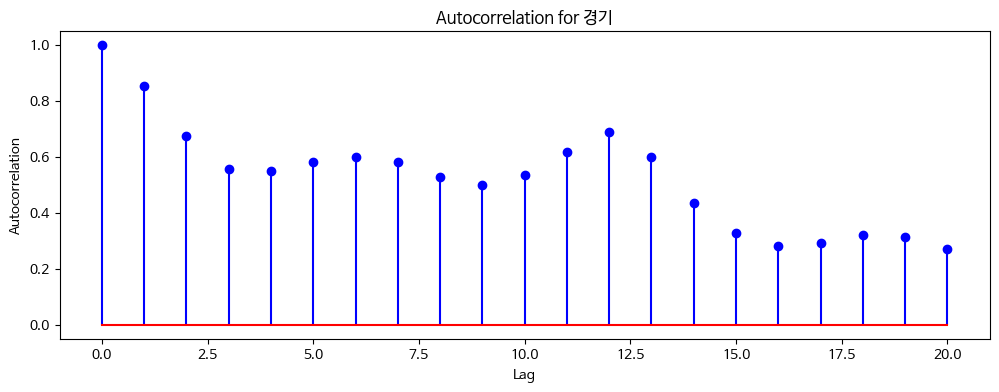

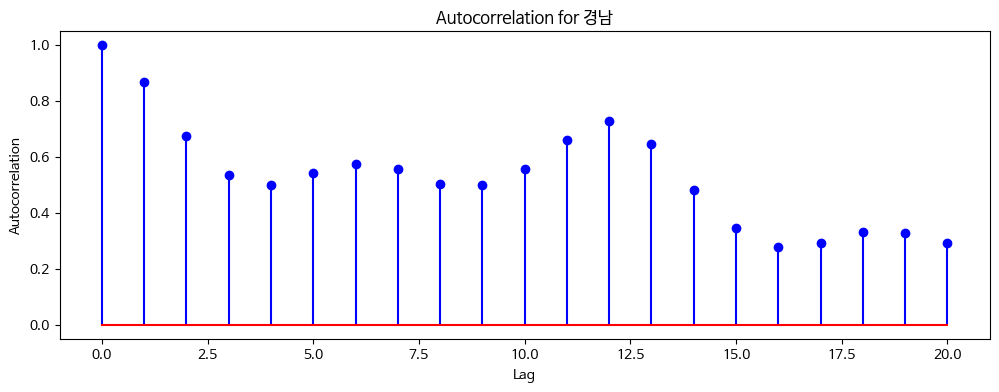

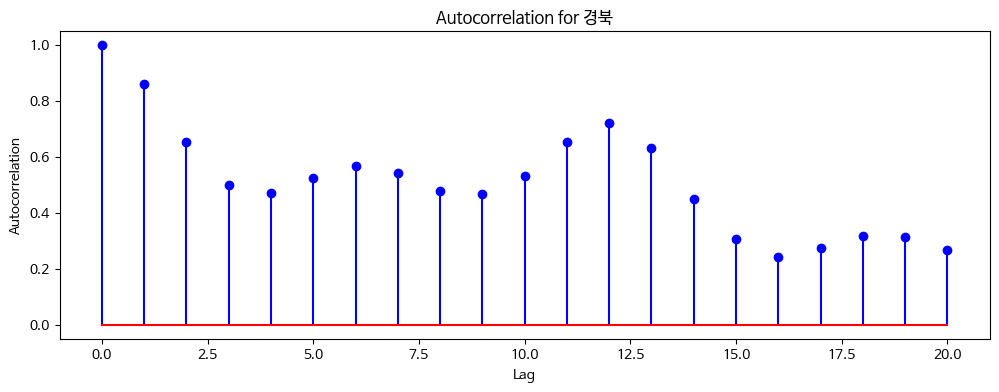

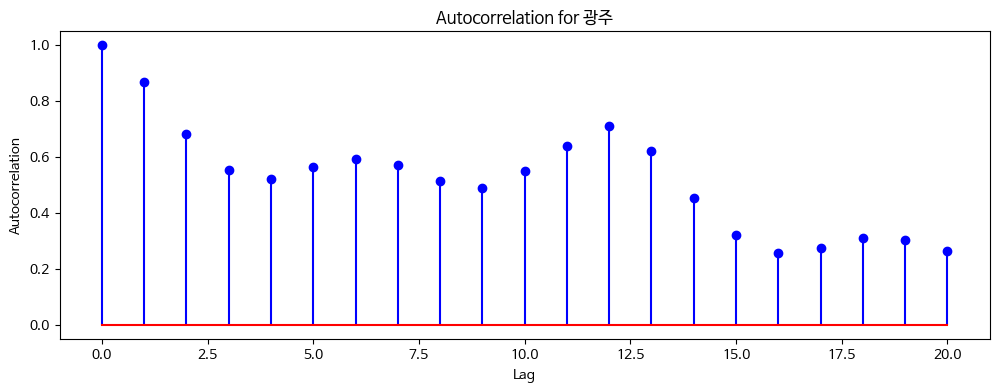

...

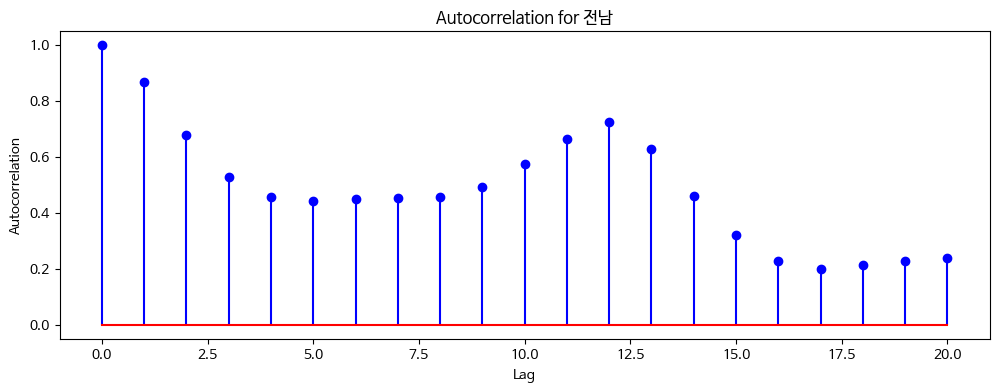

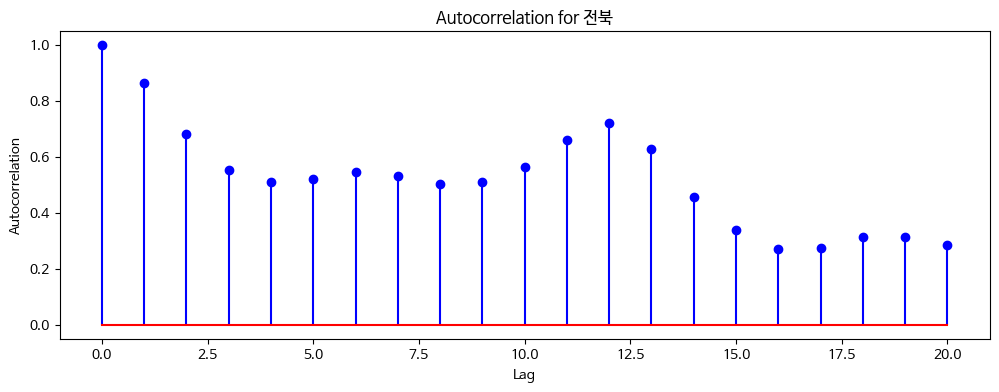

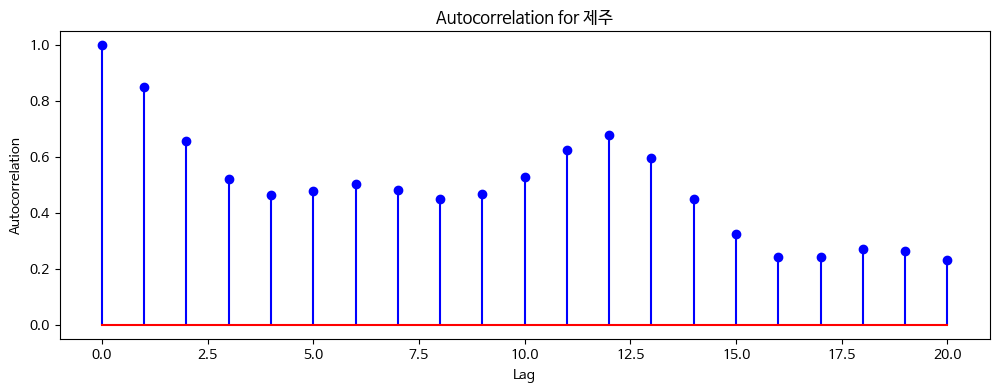

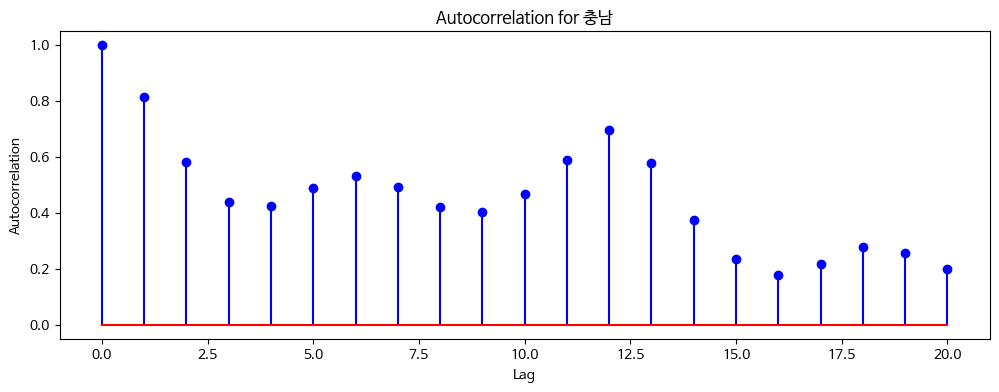

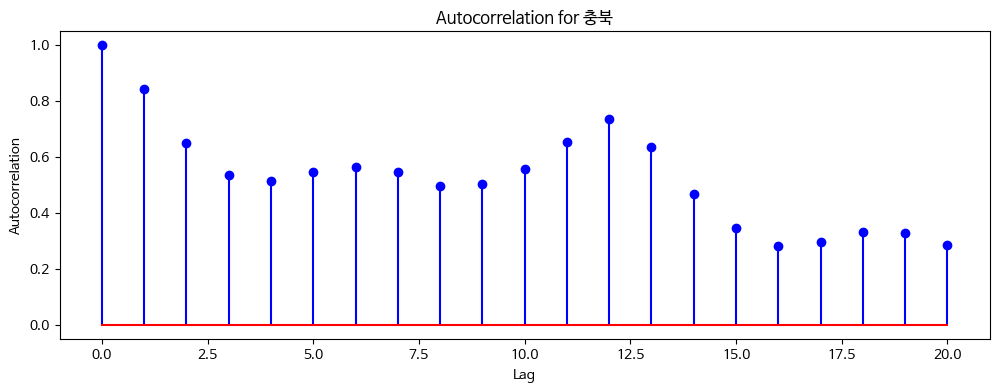

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.seasonal import STL
from sklearn.preprocessing import StandardScaler
import seaborn as sns

def plot_standardized_data(df):
    df['요양개시연월'] = pd.to_datetime(df['요양개시연월'], format='%Y-%m-%d')
    df['연도'] = df['요양개시연월'].dt.year

    # Group by '주소(시도)' and '요양개시연월', calculate sum of '진료에피소드 건수' and mean of '인구수'
    grouped_df = df.groupby(['주소(시도)', '요양개시연월']).agg({
        '진료에피소드 건수': 'sum',
        '인구수': 'mean'
    }).reset_index()

    # Calculate '인구 대비' and standardize
    grouped_df['인구 대비'] = grouped_df['진료에피소드 건수'] / grouped_df['인구수']
    scaler = StandardScaler()
    grouped_df['표준화'] = scaler.fit_transform(grouped_df[['인구 대비']])

    # Seasonal decomposition using STL
    plt.figure(figsize=(12, 8))
    colors = sns.color_palette("husl", n_colors=20)

    for i, address in enumerate(grouped_df['주소(시도)'].unique()):
        subset = grouped_df[grouped_df['주소(시도)'] == address]
        subset.set_index('요양개시연월', inplace=True)

        line_color = colors[i % len(colors)]

        # Plotting with distinct colors


        # Calculate and plot autocorrelation for resid
        lag_acf = acf(subset['인구 대비'], nlags=20)
        plt.figure(figsize=(12, 4))
        plt.stem(range(len(lag_acf)), lag_acf, markerfmt='bo', linefmt='b-', basefmt='r-')
        plt.title(f'Autocorrelation for {address}')
        plt.xlabel('Lag')
        plt.ylabel('Autocorrelation')
        plt.show()

plot_standardized_data(dfas_1)


# 예시 데이터 생성 (grouped_df는 이미 생성된 것으로 가정)
# plot_standardized_data(grouped_df)


In [ ]:
region = list(rH['주소(시도)'].unique())

## 천식


In [ ]:

# 주소(시도) 열의 유니크한 값들 가져오기
unique_addresses = aS['주소(시도)'].unique()

# 각 주소(시도)별로 데이터프레임을 만들어 저장할 빈 리스트
result_frames = []

# 각 주소(시도)에 대해 반복
for address in unique_addresses:
    # 해당 주소(시도)에 해당하는 행들만 추출
    subset_df = aS[aS['주소(시도)'] == address][['요양개시연월', '인구 대비']]

    # 새로운 데이터프레임을 리스트에 추가
    result_frames.append(subset_df)

# 각 주소(시도)별로 만들어진 데이터프레임들을 딕셔너리로 저장
result_dict = dict(zip(unique_addresses, result_frames))



In [ ]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt

# 주어진 데이터프레임 rH
# 예를 들어, rH 데이터프레임이 다음과 같다고 가정합니다.
# rH = pd.DataFrame({'주소(시도)': ['강원', '경기', '강원', '경남', '서울', '서울'],
#                   '요양개시연월': ['202101', '202102', '202103', '202104', '202105', '202106'],
#                   '인구 대비': [100, 150, 120, 200, 180, 250]})

# '요양개시연월'을 날짜로 변환
aS['요양개시연월'] = pd.to_datetime(aS['요양개시연월'], format='%Y%m')

# 각 지역별로 ADF 검정을 수행하고 결과를 출력하는 함수
def adf_test(data, address):
    result = adfuller(data)
    print(f"ADF Statistic for {address}: {result[0]}")
    print(f"P-value: {result[1]}")
    print("Critical Values:")
    for key, value in result[4].items():
        print(f"   {key}: {value}")

# 각 지역별로 시계열 정상성 검정 수행
for address in region:
    subset_df = result_dict[address]

    # '인구 대비'를 대상으로 ADF 검정 수행
    adf_test(subset_df['인구 대비'], address)




ADF Statistic for 강원: -1.2716652373975714
P-value: 0.6420337760121448
Critical Values:
   1%: -3.4936021509366793
   5%: -2.8892174239808703
   10%: -2.58153320754717
ADF Statistic for 경기: -1.4215493379111714
P-value: 0.5719026114513989
Critical Values:
   1%: -3.4936021509366793
   5%: -2.8892174239808703
   10%: -2.58153320754717
ADF Statistic for 경남: -0.9061115212727352
P-value: 0.7859531437589435
Critical Values:
   1%: -3.4936021509366793
   5%: -2.8892174239808703
   10%: -2.58153320754717
ADF Statistic for 경북: -0.9567949940415972
P-value: 0.7686945271802208
Critical Values:
   1%: -3.4936021509366793
   5%: -2.8892174239808703
   10%: -2.58153320754717
ADF Statistic for 광주: -1.060177749645601
P-value: 0.7306886113602139
Critical Values:
   1%: -3.4936021509366793
   5%: -2.8892174239808703
   10%: -2.58153320754717
ADF Statistic for 대구: -1.1756288224114584
P-value: 0.6839907481148149
Critical Values:
   1%: -3.4936021509366793
   5%: -2.8892174239808703
   10%: -2.58153320754717

<ipython-input-35-fedb2cf58f6d>:32: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


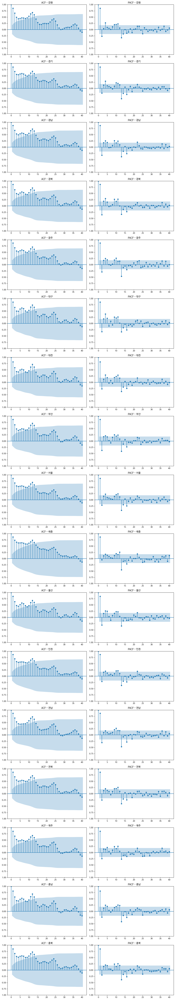

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# Number of regions
num_regions = len(region)

# Number of columns in the grid
num_cols = 2

# Number of rows in the grid (ceil division)
num_rows = num_regions

# Set up the subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 4 * num_rows))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop through each region and plot ACF and PACF
for i, address in enumerate(region):
    subset_df = result_dict[address]

    # Plot ACF for the original time series data
    plot_acf(subset_df['인구 대비'], lags=40, ax=axes[i * 2])
    axes[i * 2].set_title(f'ACF - {address}')

    # Plot PACF for the original time series data
    plot_pacf(subset_df['인구 대비'], lags=40, ax=axes[i * 2 + 1])
    axes[i * 2 + 1].set_title(f'PACF - {address}')

# Adjust layout
plt.tight_layout()
plt.show()


<ipython-input-27-ad9b7e220e3e>:26: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


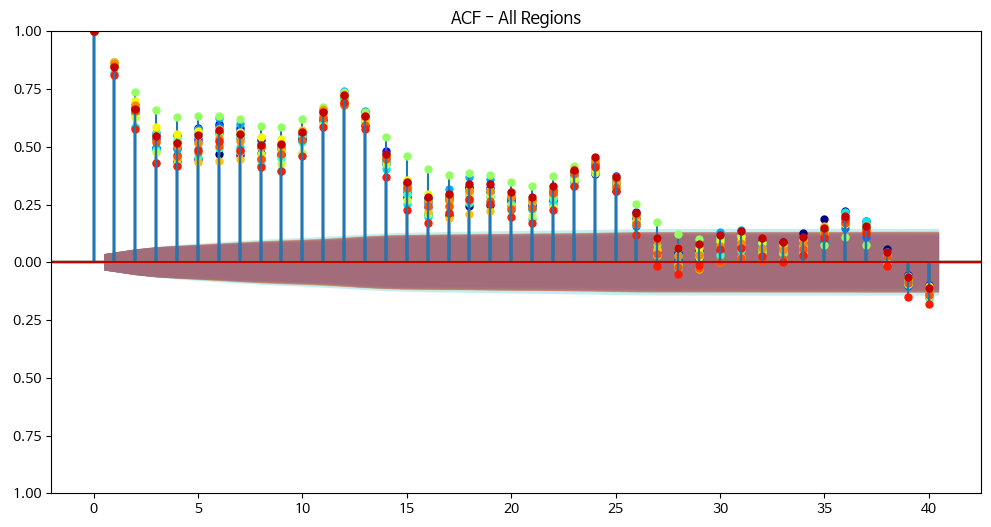

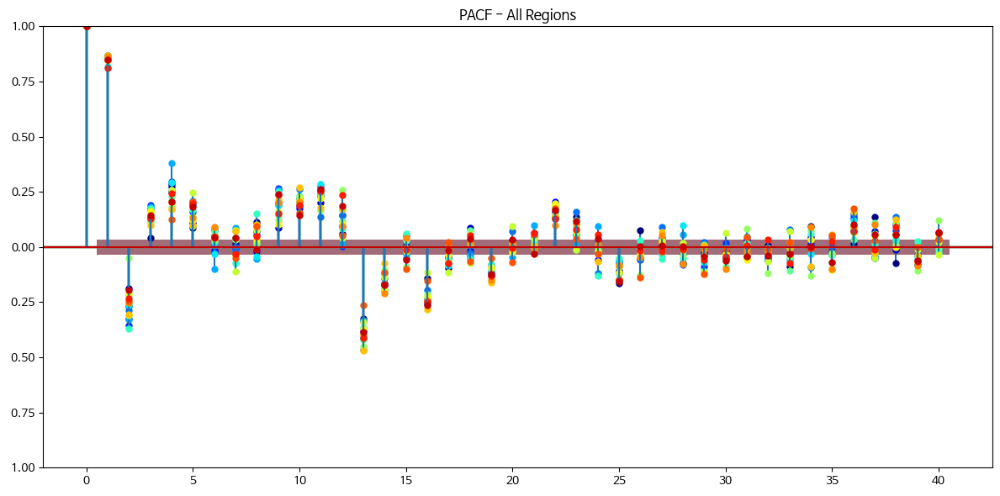

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# Number of regions
num_regions = len(region)

# Set up the subplots
fig, ax_acf = plt.subplots(figsize=(12, 6))
fig, ax_pacf = plt.subplots(figsize=(12, 6))

# Loop through each region and overlay ACF and PACF on the same plot
for i, address in enumerate(region):
    subset_df = result_dict[address]

    # Overlay ACF for the original time series data
    plot_acf(subset_df['인구 대비'], lags=40, ax=ax_acf, alpha=0.7, color=plt.cm.jet(i / num_regions))

    # Overlay PACF for the original time series data
    plot_pacf(subset_df['인구 대비'], lags=40, ax=ax_pacf, alpha=0.7, color=plt.cm.jet(i / num_regions))

# Set titles
ax_acf.set_title('ACF - All Regions')
ax_pacf.set_title('PACF - All Regions')

# Adjust layout
plt.tight_layout()
plt.show()


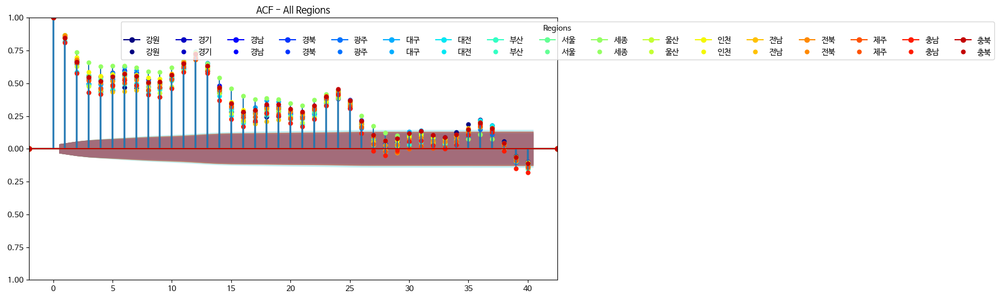

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# Number of regions
num_regions = len(region)

# Set up the subplots
fig, ax_acf = plt.subplots(figsize=(12, 6))
#fig, ax_pacf = plt.subplots(figsize=(12, 6))

# Loop through each region and overlay ACF and PACF on the same plot
for i, address in enumerate(region):
    subset_df = result_dict[address]

    # Overlay ACF for the original time series data
    plot_acf(subset_df['인구 대비'], lags=40, ax=ax_acf, alpha=0.7, color=plt.cm.jet(i / num_regions), marker='o', label=address)

    # Overlay PACF for the original time series data
    #plot_pacf(subset_df['인구 대비'], lags=40, ax=ax_pacf, alpha=0.7, color=plt.cm.jet(i / num_regions), marker='o')

# Set titles
ax_acf.set_title('ACF - All Regions')
ax_pacf.set_title('PACF - All Regions')

# Add legend to ACF plot and adjust its position
ax_acf.legend(loc='upper center', bbox_to_anchor=(1, 1), title='Regions', ncol=num_regions)

# Adjust layout
#plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


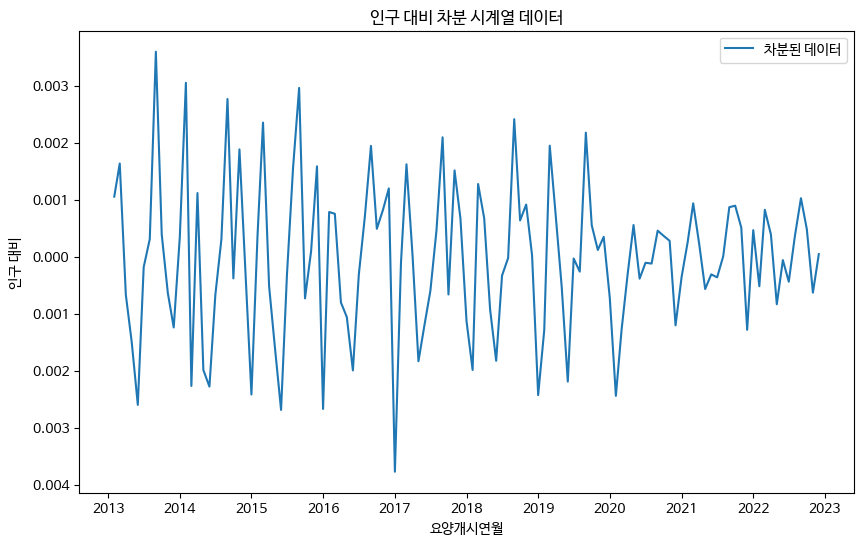

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# subset_df는 이미 데이터프레임으로 로드되어 있다고 가정합니다.
# '요양개시연월' 열을 datetime 형식으로 변환해야 합니다.
subset_df['요양개시연월'] = pd.to_datetime(subset_df['요양개시연월'])

# '요양개시연월' 열을 인덱스로 설정합니다.
subset_df.set_index('요양개시연월', inplace=True)

# 차분을 계산합니다.
diff_subset = subset_df['인구 대비'].diff().dropna()

# 차분을 통해 계산된 데이터로 그래프를 그립니다.
plt.figure(figsize=(10, 6))
plt.plot(diff_subset, label='차분된 데이터')
plt.title('천식 차분 시계열 데이터')
plt.xlabel('요양개시연월')
plt.ylabel('인구 대비')
plt.legend()
plt.show()


## 비염

In [ ]:

# 주소(시도) 열의 유니크한 값들 가져오기
unique_addresses = rH['주소(시도)'].unique()

# 각 주소(시도)별로 데이터프레임을 만들어 저장할 빈 리스트
result_frames = []

# 각 주소(시도)에 대해 반복
for address in unique_addresses:
    # 해당 주소(시도)에 해당하는 행들만 추출
    subset_df = rH[rH['주소(시도)'] == address][['요양개시연월', '인구 대비']]

    # 새로운 데이터프레임을 리스트에 추가
    result_frames.append(subset_df)

# 각 주소(시도)별로 만들어진 데이터프레임들을 딕셔너리로 저장
result_dict = dict(zip(unique_addresses, result_frames))



전부 정상성이 없다는 결론

In [ ]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt

# 주어진 데이터프레임 rH
# 예를 들어, rH 데이터프레임이 다음과 같다고 가정합니다.
# rH = pd.DataFrame({'주소(시도)': ['강원', '경기', '강원', '경남', '서울', '서울'],
#                   '요양개시연월': ['202101', '202102', '202103', '202104', '202105', '202106'],
#                   '인구 대비': [100, 150, 120, 200, 180, 250]})

# '요양개시연월'을 날짜로 변환
rH['요양개시연월'] = pd.to_datetime(rH['요양개시연월'], format='%Y%m')

# 각 지역별로 ADF 검정을 수행하고 결과를 출력하는 함수
def adf_test(data, address):
    result = adfuller(data)
    print(f"ADF Statistic for {address}: {result[0]}")
    print(f"P-value: {result[1]}")
    print("Critical Values:")
    for key, value in result[4].items():
        print(f"   {key}: {value}")

# 각 지역별로 시계열 정상성 검정 수행
for address in region:
    subset_df = result_dict[address]

    # '인구 대비'를 대상으로 ADF 검정 수행
    adf_test(subset_df['인구 대비'], address)



ADF Statistic for 강원: -1.021075653837031
P-value: 0.7455000422120001
Critical Values:
   1%: -3.492995948509562
   5%: -2.888954648057252
   10%: -2.58139291903223
ADF Statistic for 경기: -1.2548537712459011
P-value: 0.6495655616011855
Critical Values:
   1%: -3.492995948509562
   5%: -2.888954648057252
   10%: -2.58139291903223
ADF Statistic for 경남: -1.3216302416052463
P-value: 0.6192192760789935
Critical Values:
   1%: -3.492995948509562
   5%: -2.888954648057252
   10%: -2.58139291903223
ADF Statistic for 경북: -1.250050849975776
P-value: 0.6517033498117324
Critical Values:
   1%: -3.492995948509562
   5%: -2.888954648057252
   10%: -2.58139291903223
ADF Statistic for 광주: -1.2077172289984641
P-value: 0.6702671755338729
Critical Values:
   1%: -3.492995948509562
   5%: -2.888954648057252
   10%: -2.58139291903223
ADF Statistic for 대구: -1.2644434014245323
P-value: 0.6452785180941351
Critical Values:
   1%: -3.492995948509562
   5%: -2.888954648057252
   10%: -2.58139291903223
ADF Statisti

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# Number of regions
num_regions = len(region)

# Number of columns in the grid
num_cols = 2

# Number of rows in the grid (ceil division)
num_rows = num_regions

# Set up the subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 4 * num_rows))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop through each region and plot ACF and PACF
for i, address in enumerate(region):
    subset_df = result_dict[address]

    # Plot ACF for the original time series data
    plot_acf(subset_df['인구 대비'], lags=40, ax=axes[i * 2])
    axes[i * 2].set_title(f'ACF - {address}')

    # Plot PACF for the original time series data
    plot_pacf(subset_df['인구 대비'], lags=40, ax=axes[i * 2 + 1])
    axes[i * 2 + 1].set_title(f'PACF - {address}')

# Adjust layout
plt.tight_layout()
plt.show()


<ipython-input-9-ad9b7e220e3e>:26: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


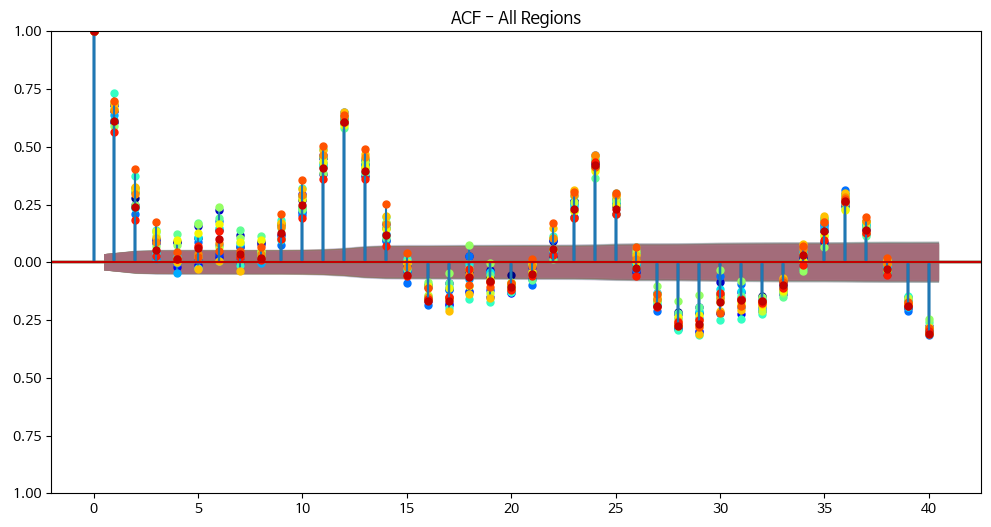

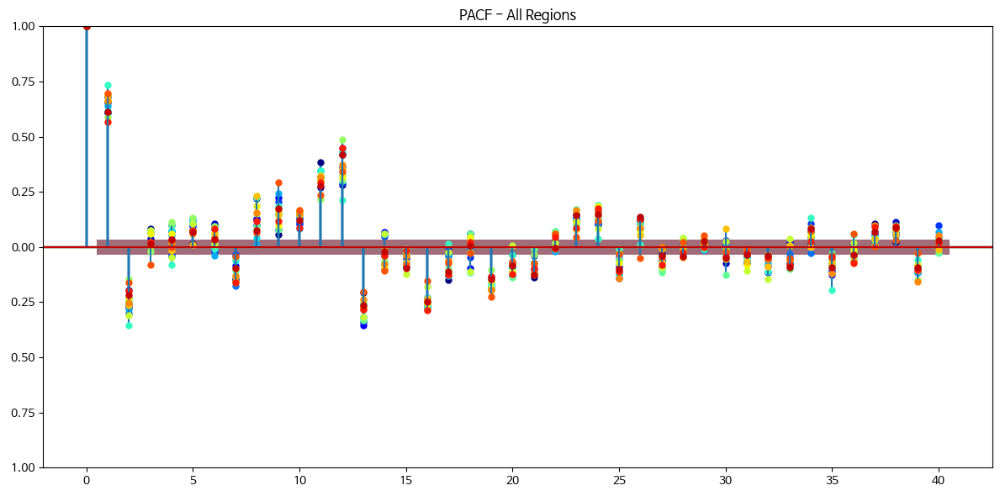

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# Number of regions
num_regions = len(region)

# Set up the subplots
fig, ax_acf = plt.subplots(figsize=(12, 6))
fig, ax_pacf = plt.subplots(figsize=(12, 6))

# Loop through each region and overlay ACF and PACF on the same plot
for i, address in enumerate(region):
    subset_df = result_dict[address]

    # Overlay ACF for the original time series data
    plot_acf(subset_df['인구 대비'], lags=40, ax=ax_acf, alpha=0.7, color=plt.cm.jet(i / num_regions))

    # Overlay PACF for the original time series data
    plot_pacf(subset_df['인구 대비'], lags=40, ax=ax_pacf, alpha=0.7, color=plt.cm.jet(i / num_regions))

# Set titles
ax_acf.set_title('ACF - All Regions')
ax_pacf.set_title('PACF - All Regions')

# Adjust layout
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


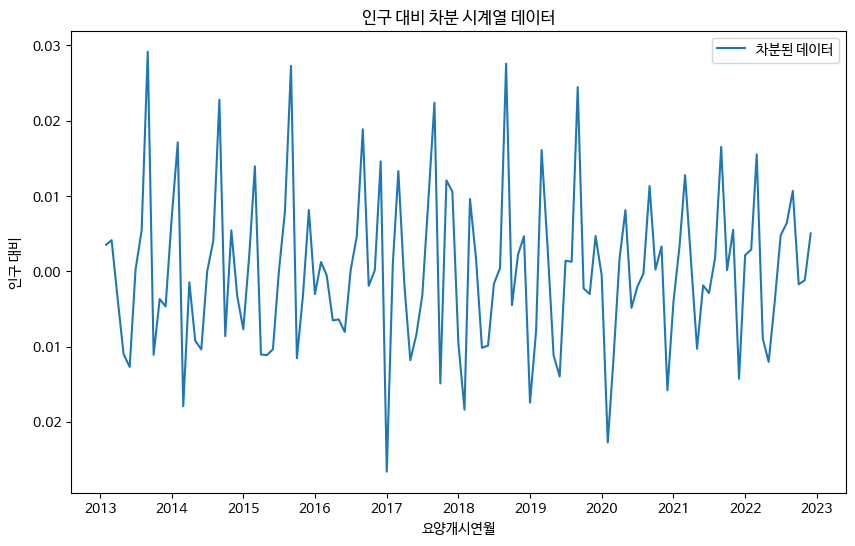

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# subset_df는 이미 데이터프레임으로 로드되어 있다고 가정합니다.
# '요양개시연월' 열을 datetime 형식으로 변환해야 합니다.
subset_df['요양개시연월'] = pd.to_datetime(subset_df['요양개시연월'])

# '요양개시연월' 열을 인덱스로 설정합니다.
subset_df.set_index('요양개시연월', inplace=True)

# 차분을 계산합니다.
diff_subset = subset_df['인구 대비'].diff().dropna()

# 차분을 통해 계산된 데이터로 그래프를 그립니다.
plt.figure(figsize=(10, 6))
plt.plot(diff_subset, label='차분된 데이터')
plt.title('인구 대비 차분 시계열 데이터')
plt.xlabel('요양개시연월')
plt.ylabel('인구 대비')
plt.legend()
plt.show()


## 아토피


In [ ]:
aT.head()

,요양개시연월,주소(시도),진료에피소드 건수,인구수,인구 대비,표준화
0,2013-01-01,강원,3980,1537704.0,0.002588,-0.510338
1,2013-01-01,경기,38978,11997735.0,0.003249,0.567627
2,2013-01-01,경남,7357,3318979.0,0.002217,-1.116848
3,2013-01-01,경북,6370,2698263.0,0.002361,-0.881620
4,2013-01-01,광주,4485,1470061.0,0.003051,0.244671


In [ ]:

# 주소(시도) 열의 유니크한 값들 가져오기
unique_addresses = aT['주소(시도)'].unique()

# 각 주소(시도)별로 데이터프레임을 만들어 저장할 빈 리스트
result_frames = []

# 각 주소(시도)에 대해 반복
for address in unique_addresses:
    # 해당 주소(시도)에 해당하는 행들만 추출
    subset_df = aT[aT['주소(시도)'] == address][['요양개시연월', '인구 대비']]

    # 새로운 데이터프레임을 리스트에 추가
    result_frames.append(subset_df)

# 각 주소(시도)별로 만들어진 데이터프레임들을 딕셔너리로 저장
result_dict = dict(zip(unique_addresses, result_frames))



In [ ]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt

aT['요양개시연월'] = pd.to_datetime(aT['요양개시연월'], format='%Y%m')

# 각 지역별로 ADF 검정을 수행하고 결과를 출력하는 함수
def adf_test(data, address):
    result = adfuller(data)
    print(f"ADF Statistic for {address}: {result[0]}")
    print(f"P-value: {result[1]}")
    print("Critical Values:")
    for key, value in result[4].items():
        print(f"   {key}: {value}")
    print(" ")

# 각 지역별로 시계열 정상성 검정 수행
for address in region:
    subset_df = result_dict[address]

    # '인구 대비'를 대상으로 ADF 검정 수행
    adf_test(subset_df['인구 대비'], address)



ADF Statistic for 강원: -2.0505239712145964
P-value: 0.2648685283961286
Critical Values:
   1%: -3.4924012594942333
   5%: -2.8886968193364835
   10%: -2.5812552709190673
 
ADF Statistic for 경기: -1.4273927874269126
P-value: 0.5690755207316629
Critical Values:
   1%: -3.4924012594942333
   5%: -2.8886968193364835
   10%: -2.5812552709190673
 
ADF Statistic for 경남: -0.7767001711773067
P-value: 0.8258705979201331
Critical Values:
   1%: -3.4924012594942333
   5%: -2.8886968193364835
   10%: -2.5812552709190673
 
ADF Statistic for 경북: -2.1491836913450837
P-value: 0.22520268439651048
Critical Values:
   1%: -3.4924012594942333
   5%: -2.8886968193364835
   10%: -2.5812552709190673
 
ADF Statistic for 광주: -2.426896490980264
P-value: 0.13428851345112108
Critical Values:
   1%: -3.492995948509562
   5%: -2.888954648057252
   10%: -2.58139291903223
 
ADF Statistic for 대구: -1.124858707117966
P-value: 0.7050574300781993
Critical Values:
   1%: -3.4924012594942333
   5%: -2.8886968193364835
   10%: 

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# Number of regions
num_regions = len(region)

# Number of columns in the grid
num_cols = 2

# Number of rows in the grid (ceil division)
num_rows = num_regions

# Set up the subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 4 * num_rows))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop through each region and plot ACF and PACF
for i, address in enumerate(region):
    subset_df = result_dict[address]

    # Plot ACF for the original time series data
    plot_acf(subset_df['인구 대비'], lags=40, ax=axes[i * 2])
    axes[i * 2].set_title(f'ACF - {address}')

    # Plot PACF for the original time series data
    plot_pacf(subset_df['인구 대비'], lags=40, ax=axes[i * 2 + 1])
    axes[i * 2 + 1].set_title(f'PACF - {address}')

# Adjust layout
plt.tight_layout()
plt.show()


<ipython-input-46-761b4cbdabe1>:26: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


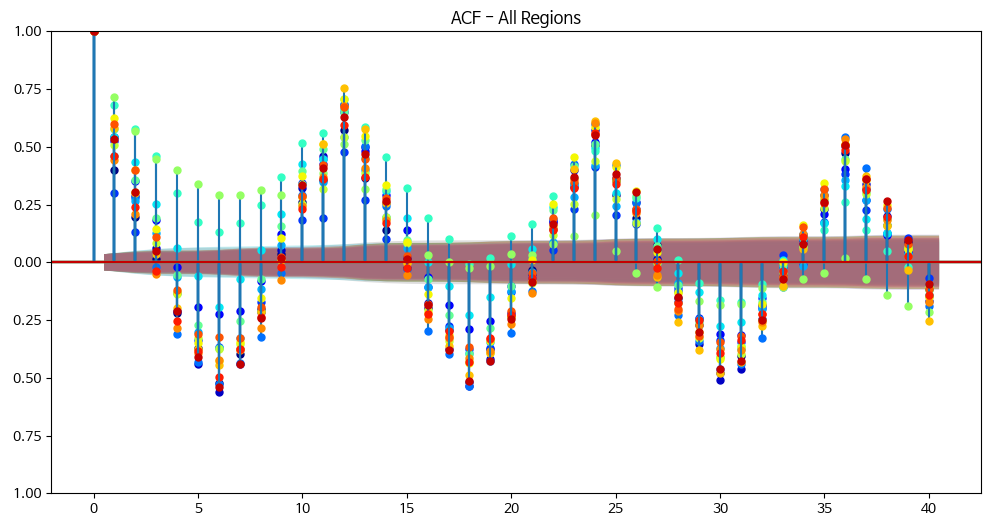

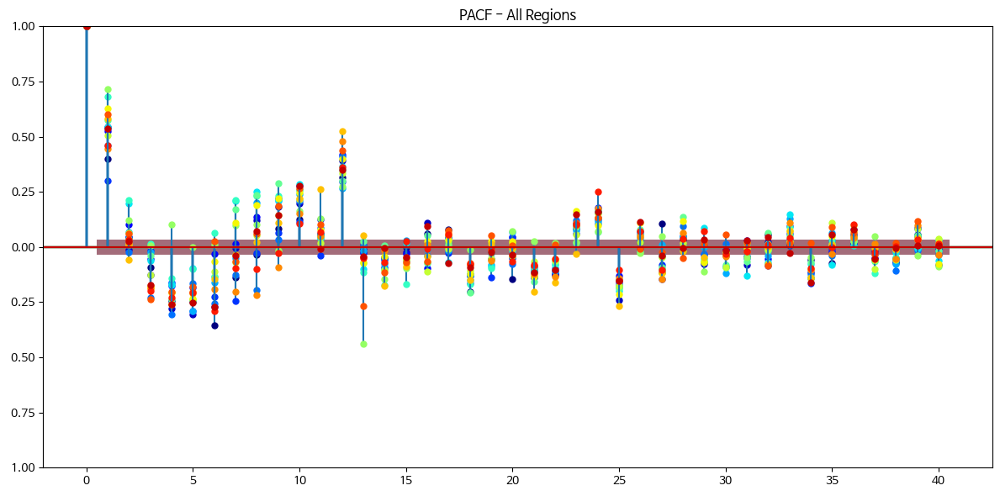

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# Number of regions
num_regions = len(region)

# Set up the subplots
fig, ax_acf = plt.subplots(figsize=(12, 6))
fig, ax_pacf = plt.subplots(figsize=(12, 6))

# Loop through each region and overlay ACF and PACF on the same plot
for i, address in enumerate(region):
    subset_df = result_dict[address]

    # Overlay ACF for the original time series data
    plot_acf(subset_df['인구 대비'], lags=40, ax=ax_acf, alpha=0.7, color=plt.cm.jet(i / num_regions))

    # Overlay PACF for the original time series data
    plot_pacf(subset_df['인구 대비'], lags=40, ax=ax_pacf, alpha=0.7, color=plt.cm.jet(i / num_regions))

# Set titles
ax_acf.set_title('ACF - All Regions')
ax_pacf.set_title('PACF - All Regions')

# Adjust layout
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


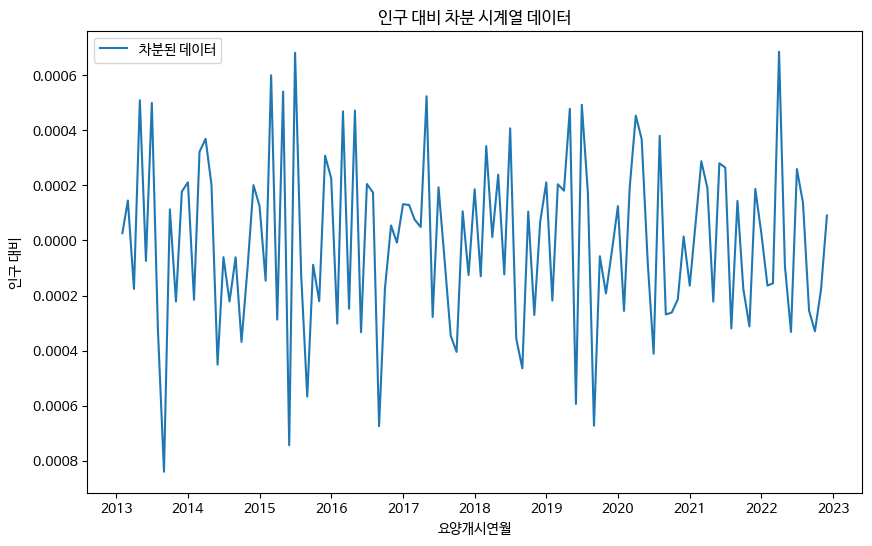

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# subset_df는 이미 데이터프레임으로 로드되어 있다고 가정합니다.
# '요양개시연월' 열을 datetime 형식으로 변환해야 합니다.
subset_df['요양개시연월'] = pd.to_datetime(subset_df['요양개시연월'])

# '요양개시연월' 열을 인덱스로 설정합니다.
subset_df.set_index('요양개시연월', inplace=True)

# 차분을 계산합니다.
diff_subset = subset_df['인구 대비'].diff().dropna()

# 차분을 통해 계산된 데이터로 그래프를 그립니다.
plt.figure(figsize=(10, 6))
plt.plot(diff_subset, label='차분된 데이터')
plt.title('인구 대비 차분 시계열 데이터')
plt.xlabel('요양개시연월')
plt.ylabel('인구 대비')
plt.legend()
plt.show()


In [ ]:
from statsmodels.tsa.stattools import adfuller

# 차분 데이터에 대해서 ADF 검정 수행
result = adfuller(diff_subset)

# 결과 출력
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

# p-value를 통해 검정 결과 해석
if result[1] <= 0.05:
    print("p-value가 0.05보다 작으므로 귀무가설을 기각하고, 시계열 데이터는 정상성을 만족합니다.")
else:
    print("p-value가 0.05보다 크므로 귀무가설을 기각하지 못하고, 시계열 데이터는 정상성을 만족하지 않습니다.")


ADF Statistic: -10.114033261723204
p-value: 9.831392444160394e-18
Critical Values: {'1%': -3.4924012594942333, '5%': -2.8886968193364835, '10%': -2.5812552709190673}
p-value가 0.05보다 작으므로 귀무가설을 기각하고, 시계열 데이터는 정상성을 만족합니다.


# 차분 데이터

아토피

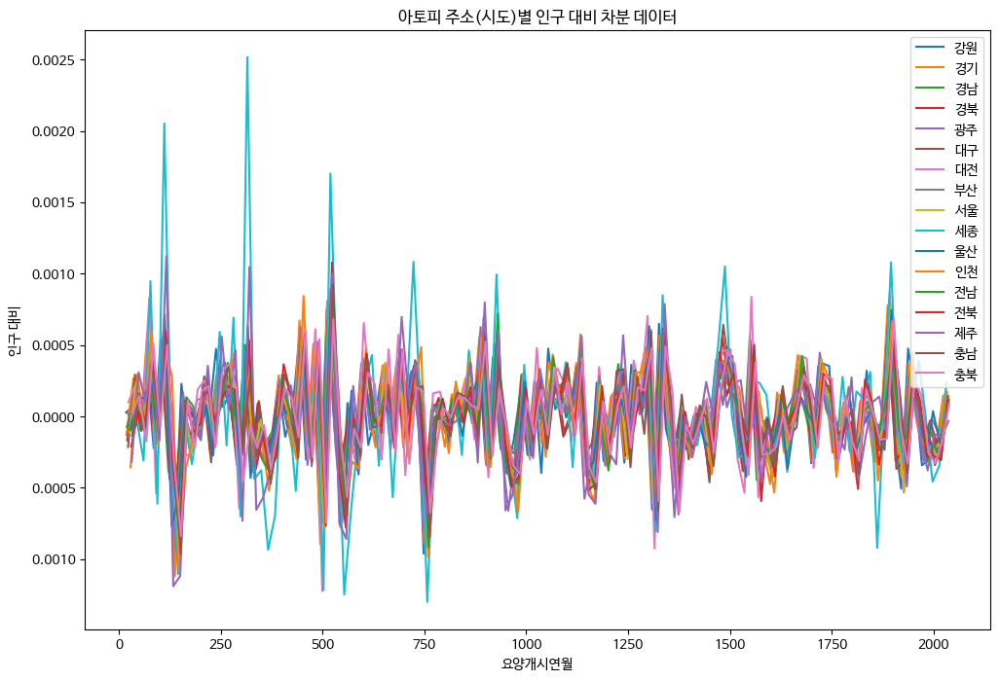

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt



# Check unique values in the '주소(시도)' column
unique_addresses = aT['주소(시도)'].unique()

# Iterate through unique addresses and plot the data
plt.figure(figsize=(12, 8))
for address in unique_addresses:
    subset_df = aT[aT['주소(시도)'] == address]['인구 대비'].diff().dropna()
    plt.plot(subset_df, label=f'{address}')

plt.title('아토피 주소(시도)별 인구 대비 차분 데이터')
plt.xlabel('요양개시연월')
plt.ylabel('인구 대비')
plt.legend()
plt.show()


In [ ]:
from statsmodels.tsa.stattools import adfuller

# Check unique values in the '주소(시도)' column
unique_addresses = aT['주소(시도)'].unique()

# Iterate through unique addresses and perform ADF test
for address in unique_addresses:
    subset_df = aT[aT['주소(시도)'] == address]['인구 대비'].diff(6).dropna()

    # Perform ADF test
    result = adfuller(subset_df)

    # Print the results
    print(f'ADF Statistic for {address}: {result[0]}')
    print(f'p-value for {address}: {result[1]}')
    print(f'Critical Values for {address}: {result[4]}')

    # Check for stationarity based on p-value
    if result[1] <= 0.05:
        print(f"{address} 데이터는 정상성을 만족합니다.")
    else:
        print(f"{address} 데이터는 정상성을 만족하지 않습니다.")
    print('\n')


ADF Statistic for 강원: -18.31232650158638
p-value for 강원: 2.274732648547388e-30
Critical Values for 강원: {'1%': -3.4924012594942333, '5%': -2.8886968193364835, '10%': -2.5812552709190673}
강원 데이터는 정상성을 만족합니다.


ADF Statistic for 경기: -21.847271219195484
p-value for 경기: 0.0
Critical Values for 경기: {'1%': -3.4924012594942333, '5%': -2.8886968193364835, '10%': -2.5812552709190673}
경기 데이터는 정상성을 만족합니다.


ADF Statistic for 경남: -2.9058253895381583
p-value for 경남: 0.04467476548629005
Critical Values for 경남: {'1%': -3.497501033, '5%': -2.89090644, '10%': -2.5824349}
경남 데이터는 정상성을 만족합니다.


ADF Statistic for 경북: -15.713220053352833
p-value for 경북: 1.3515591815822424e-28
Critical Values for 경북: {'1%': -3.4924012594942333, '5%': -2.8886968193364835, '10%': -2.5812552709190673}
경북 데이터는 정상성을 만족합니다.


ADF Statistic for 광주: -3.523506024106324
p-value for 광주: 0.0074035369395742375
Critical Values for 광주: {'1%': -3.4948504603223145, '5%': -2.889758398668639, '10%': -2.5818220155325444}
광주 데이터는 정상성을 만족합니다.


A

비염

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


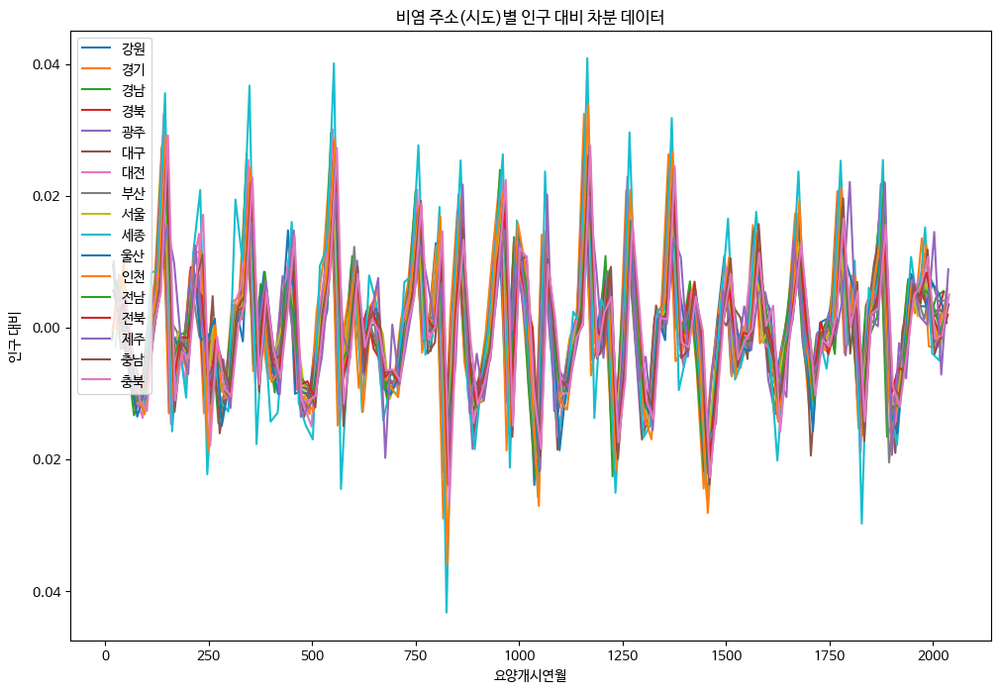

In [ ]:


# Check unique values in the '주소(시도)' column
unique_addresses = rH['주소(시도)'].unique()

# Iterate through unique addresses and plot the data
plt.figure(figsize=(12, 8))
for address in unique_addresses:
    subset_df = rH[rH['주소(시도)'] == address]['인구 대비'].diff().dropna()
    plt.plot(subset_df, label=f'{address}')

plt.title('비염 주소(시도)별 인구 대비 차분 데이터')
plt.xlabel('요양개시연월')
plt.ylabel('인구 대비')
plt.legend()
plt.show()


In [ ]:
from statsmodels.tsa.stattools import adfuller

# Check unique values in the '주소(시도)' column
unique_addresses = rH['주소(시도)'].unique()

# Iterate through unique addresses and perform ADF test
for address in unique_addresses:
    subset_df = rH[rH['주소(시도)'] == address]['인구 대비'].diff().dropna()

    # Perform ADF test
    result = adfuller(subset_df)

    # Print the results
    print(f'ADF Statistic for {address}: {result[0]}')
    print(f'p-value for {address}: {result[1]}')
    print(f'Critical Values for {address}: {result[4]}')

    # Check for stationarity based on p-value
    if result[1] <= 0.05:
        print(f"{address} 데이터는 정상성을 만족합니다.")
    else:
        print(f"{address} 데이터는 정상성을 만족하지 않습니다.")
    print('\n')


ADF Statistic for 강원: -5.095641170941842
p-value for 강원: 1.4304695045662459e-05
Critical Values for 강원: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.58139291903223}
강원 데이터는 정상성을 만족합니다.


ADF Statistic for 경기: -4.475579067297049
p-value for 경기: 0.00021761472818730788
Critical Values for 경기: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.58139291903223}
경기 데이터는 정상성을 만족합니다.


ADF Statistic for 경남: -4.241394467934901
p-value for 경남: 0.0005602901216013165
Critical Values for 경남: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.58139291903223}
경남 데이터는 정상성을 만족합니다.


ADF Statistic for 경북: -4.592586712810927
p-value for 경북: 0.00013329520617776696
Critical Values for 경북: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.58139291903223}
경북 데이터는 정상성을 만족합니다.


ADF Statistic for 광주: -4.858432503444168
p-value for 광주: 4.1988485185262665e-05
Critical Values for 광주: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.58139291903223

천식

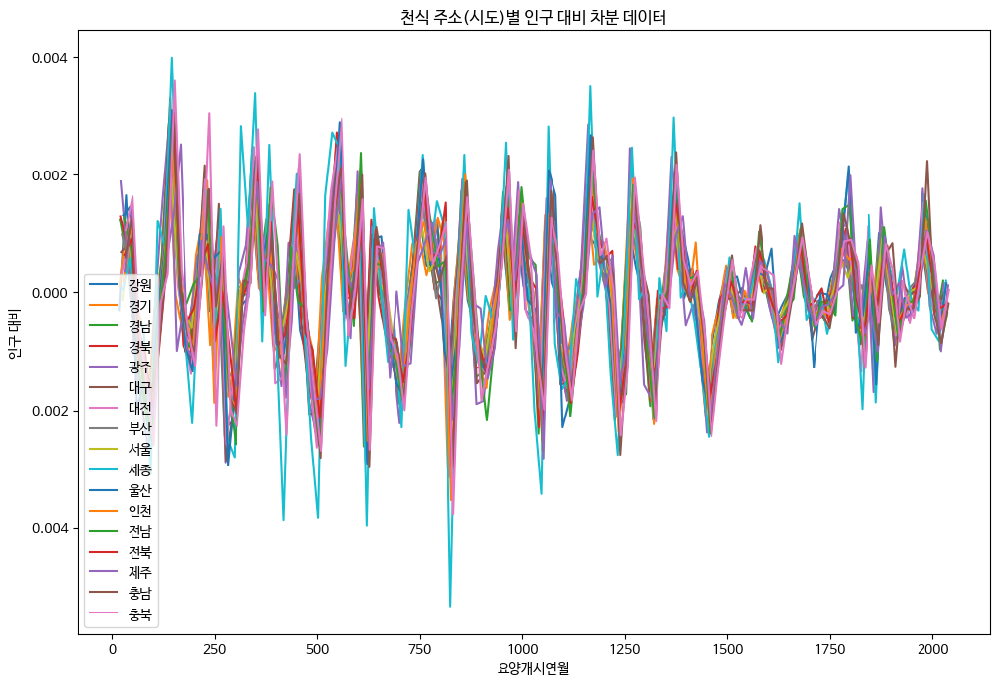

In [ ]:


# Check unique values in the '주소(시도)' column
unique_addresses = aS['주소(시도)'].unique()

# Iterate through unique addresses and plot the data
plt.figure(figsize=(12, 8))
for address in unique_addresses:
    subset_df = aS[aS['주소(시도)'] == address]['인구 대비'].diff().dropna()
    plt.plot(subset_df, label=f'{address}')

plt.title('천식 주소(시도)별 인구 대비 차분 데이터')
plt.xlabel('요양개시연월')
plt.ylabel('인구 대비')
plt.legend()
plt.show()


In [ ]:
from statsmodels.tsa.stattools import adfuller

# Check unique values in the '주소(시도)' column
unique_addresses = aS['주소(시도)'].unique()

# Iterate through unique addresses and perform ADF test
for address in unique_addresses:
    subset_df = aS[aS['주소(시도)'] == address]['인구 대비'].diff().dropna()

    # Perform ADF test
    result = adfuller(subset_df)

    # Print the results
    print(f'ADF Statistic for {address}: {result[0]}')
    print(f'p-value for {address}: {result[1]}')
    print(f'Critical Values for {address}: {result[4]}')

    # Check for stationarity based on p-value
    if result[1] <= 0.05:
        print(f"{address} 데이터는 정상성을 만족합니다.")
    else:
        print(f"{address} 데이터는 정상성을 만족하지 않습니다.")
    print('\n')


ADF Statistic for 강원: -3.2019634063172364
p-value for 강원: 0.01987131047397436
Critical Values for 강원: {'1%': -3.4936021509366793, '5%': -2.8892174239808703, '10%': -2.58153320754717}
강원 데이터는 정상성을 만족합니다.


ADF Statistic for 경기: -2.871225939094964
p-value for 경기: 0.04879780452669076
Critical Values for 경기: {'1%': -3.4936021509366793, '5%': -2.8892174239808703, '10%': -2.58153320754717}
경기 데이터는 정상성을 만족합니다.


ADF Statistic for 경남: -2.9448742211890844
p-value for 경남: 0.04037307190652097
Critical Values for 경남: {'1%': -3.4936021509366793, '5%': -2.8892174239808703, '10%': -2.58153320754717}
경남 데이터는 정상성을 만족합니다.


ADF Statistic for 경북: -3.1483425959974896
p-value for 경북: 0.023176386225764664
Critical Values for 경북: {'1%': -3.4936021509366793, '5%': -2.8892174239808703, '10%': -2.58153320754717}
경북 데이터는 정상성을 만족합니다.


ADF Statistic for 광주: -2.7047003235669544
p-value for 광주: 0.0732284335357419
Critical Values for 광주: {'1%': -3.4936021509366793, '5%': -2.8892174239808703, '10%': -2.58153320754717

In [ ]:
from statsmodels.tsa.stattools import adfuller

# Check unique values in the '주소(시도)' column
unique_addresses = aS['주소(시도)'].unique()

# Iterate through unique addresses and perform ADF test
for address in unique_addresses:
    subset_df = aS[aS['주소(시도)'] == address]['인구 대비'].diff(6).dropna()

    # Perform ADF test
    result = adfuller(subset_df)

    # Print the results
    print(f'ADF Statistic for {address}: {result[0]}')
    print(f'p-value for {address}: {result[1]}')
    print(f'Critical Values for {address}: {result[4]}')

    # Check for stationarity based on p-value
    if result[1] <= 0.05:
        print(f"{address} 데이터는 정상성을 만족합니다.")
    else:
        print(f"{address} 데이터는 정상성을 만족하지 않습니다.")
    print('\n')


ADF Statistic for 강원: -4.339017747223323
p-value for 강원: 0.00037995475928548426
Critical Values for 강원: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.58139291903223}
강원 데이터는 정상성을 만족합니다.


ADF Statistic for 경기: -3.798218589758857
p-value for 경기: 0.002925593826942665
Critical Values for 경기: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.58139291903223}
경기 데이터는 정상성을 만족합니다.


ADF Statistic for 경남: -2.154895159998236
p-value for 경남: 0.22302104854528482
Critical Values for 경남: {'1%': -3.4948504603223145, '5%': -2.889758398668639, '10%': -2.5818220155325444}
경남 데이터는 정상성을 만족하지 않습니다.


ADF Statistic for 경북: -4.007062365656066
p-value for 경북: 0.0013739787848698521
Critical Values for 경북: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.58139291903223}
경북 데이터는 정상성을 만족합니다.


ADF Statistic for 광주: -3.4907132776721914
p-value for 광주: 0.008228824585989161
Critical Values for 광주: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.5813929190322

# 로그 변환

비염

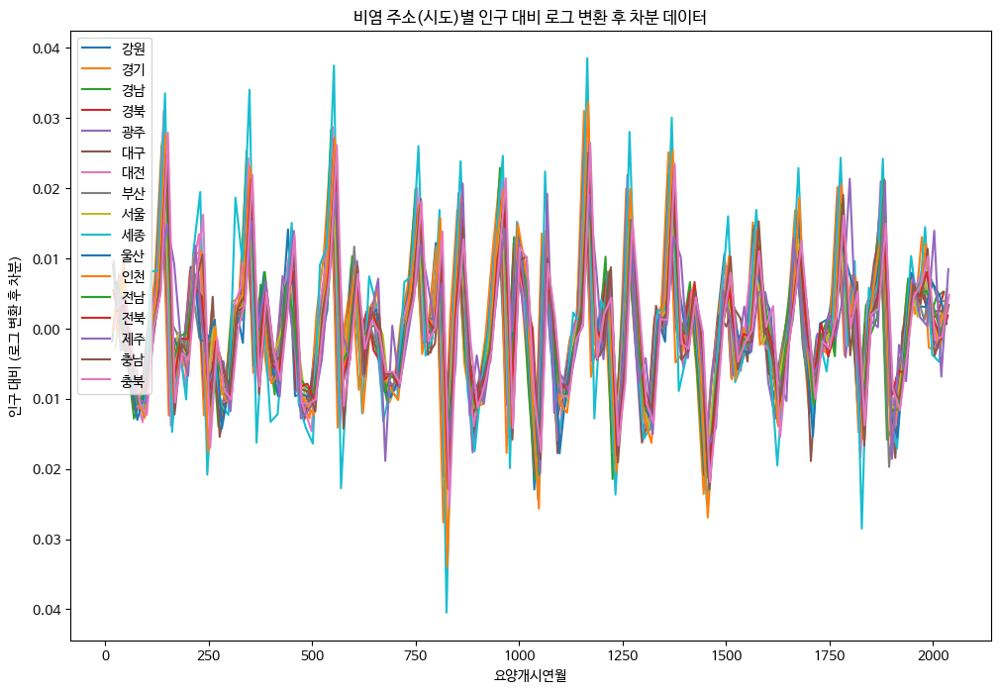

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Check unique values in the '주소(시도)' column
unique_addresses = rH['주소(시도)'].unique()

# Iterate through unique addresses and plot the data
plt.figure(figsize=(12, 8))
for address in unique_addresses:
    subset_df = rH[rH['주소(시도)'] == address]['인구 대비']

    # 로그 변환
    subset_df_log = np.log1p(subset_df)

    # 차분
    subset_df_diff = subset_df_log.diff().dropna()

    plt.plot(subset_df_diff, label=f'{address}')

plt.title('비염 주소(시도)별 인구 대비 로그 변환 후 차분 데이터')
plt.xlabel('요양개시연월')
plt.ylabel('인구 대비 (로그 변환 후 차분)')
plt.legend()
plt.show()


In [ ]:
from statsmodels.tsa.stattools import adfuller

# Check unique values in the '주소(시도)' column
unique_addresses = rH['주소(시도)'].unique()

# Iterate through unique addresses and perform ADF test
for address in unique_addresses:

    subset_df = np.log1p(rH[rH['주소(시도)'] == address]['인구 대비']).diff().dropna()

    # Perform ADF test
    result = adfuller(subset_df)

    # Print the results
    print(f'ADF Statistic for {address}: {result[0]}')
    print(f'p-value for {address}: {result[1]}')
    print(f'Critical Values for {address}: {result[4]}')

    # Check for stationarity based on p-value
    if result[1] <= 0.05:
        print(f"{address} 데이터는 정상성을 만족합니다.")
    else:
        print(f"{address} 데이터는 정상성을 만족하지 않습니다.")
    print('\n')


ADF Statistic for 강원: -5.06629895679223
p-value for 강원: 1.6379651595243314e-05
Critical Values for 강원: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.58139291903223}
강원 데이터는 정상성을 만족합니다.


ADF Statistic for 경기: -4.4511176961831636
p-value for 경기: 0.00024074484946035312
Critical Values for 경기: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.58139291903223}
경기 데이터는 정상성을 만족합니다.


ADF Statistic for 경남: -4.221912976664854
p-value for 경남: 0.0006048283592775716
Critical Values for 경남: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.58139291903223}
경남 데이터는 정상성을 만족합니다.


ADF Statistic for 경북: -4.570989399128214
p-value for 경북: 0.00014604301202619178
Critical Values for 경북: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.58139291903223}
경북 데이터는 정상성을 만족합니다.


ADF Statistic for 광주: -4.839134889950955
p-value for 광주: 4.5747108573165325e-05
Critical Values for 광주: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.58139291903223

아토피

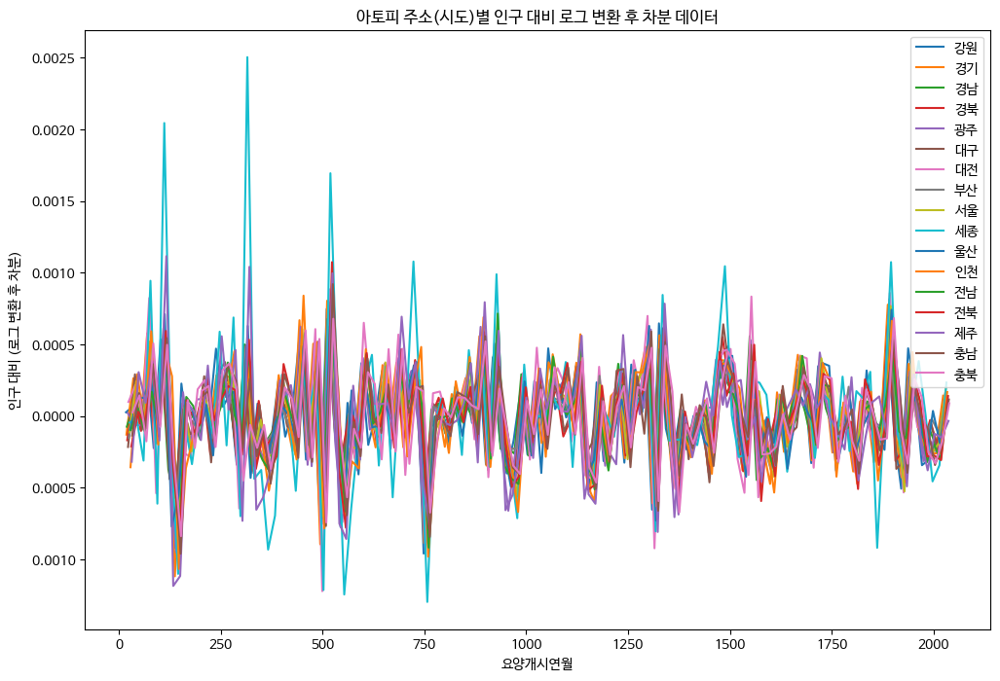

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Check unique values in the '주소(시도)' column
unique_addresses = aT['주소(시도)'].unique()

# Iterate through unique addresses and plot the data
plt.figure(figsize=(12, 8))
for address in unique_addresses:
    subset_df = aT[aT['주소(시도)'] == address]['인구 대비']

    # 로그 변환
    subset_df_log = np.log1p(subset_df)

    # 차분
    subset_df_diff = subset_df_log.diff().dropna()

    plt.plot(subset_df_diff, label=f'{address}')

plt.title('아토피 주소(시도)별 인구 대비 로그 변환 후 차분 데이터')
plt.xlabel('요양개시연월')
plt.ylabel('인구 대비 (로그 변환 후 차분)')
plt.legend()
plt.show()


In [ ]:
from statsmodels.tsa.stattools import adfuller

# Check unique values in the '주소(시도)' column
unique_addresses = aT['주소(시도)'].unique()

# Iterate through unique addresses and perform ADF test
for address in unique_addresses:

    subset_df = np.log1p(aT[aT['주소(시도)'] == address]['인구 대비']).diff().dropna()

    # Perform ADF test
    result = adfuller(subset_df)

    # Print the results
    print(f'ADF Statistic for {address}: {result[0]}')
    print(f'p-value for {address}: {result[1]}')
    print(f'Critical Values for {address}: {result[4]}')

    # Check for stationarity based on p-value
    if result[1] <= 0.05:
        print(f"{address} 데이터는 정상성을 만족합니다.")
    else:
        print(f"{address} 데이터는 정상성을 만족하지 않습니다.")
    print('\n')


ADF Statistic for 강원: -9.834345983631367
p-value for 강원: 4.9408830817800994e-17
Critical Values for 강원: {'1%': -3.4924012594942333, '5%': -2.8886968193364835, '10%': -2.5812552709190673}
강원 데이터는 정상성을 만족합니다.


ADF Statistic for 경기: -11.568956121295718
p-value for 경기: 3.136043928584192e-21
Critical Values for 경기: {'1%': -3.4924012594942333, '5%': -2.8886968193364835, '10%': -2.5812552709190673}
경기 데이터는 정상성을 만족합니다.


ADF Statistic for 경남: -10.850370801281331
p-value for 경남: 1.534266277076015e-19
Critical Values for 경남: {'1%': -3.4924012594942333, '5%': -2.8886968193364835, '10%': -2.5812552709190673}
경남 데이터는 정상성을 만족합니다.


ADF Statistic for 경북: -9.292377353751077
p-value for 경북: 1.1703699077341003e-15
Critical Values for 경북: {'1%': -3.4924012594942333, '5%': -2.8886968193364835, '10%': -2.5812552709190673}
경북 데이터는 정상성을 만족합니다.


ADF Statistic for 광주: -9.101228679570806
p-value for 광주: 3.601116274097926e-15
Critical Values for 광주: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -

천식

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


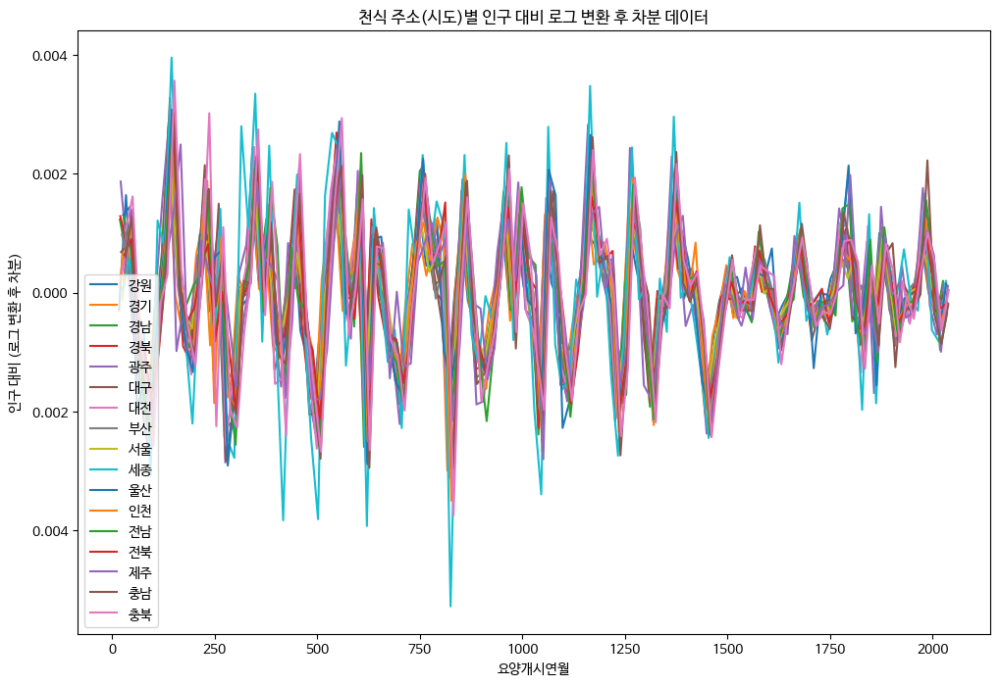

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Check unique values in the '주소(시도)' column
unique_addresses = aS['주소(시도)'].unique()

# Iterate through unique addresses and plot the data
plt.figure(figsize=(12, 8))
for address in unique_addresses:
    subset_df = aS[aS['주소(시도)'] == address]['인구 대비']

    # 로그 변환
    subset_df_log = np.log1p(subset_df)

    # 차분
    subset_df_diff = subset_df_log.diff().dropna()

    plt.plot(subset_df_diff, label=f'{address}')

plt.title('천식 주소(시도)별 인구 대비 로그 변환 후 차분 데이터')
plt.xlabel('요양개시연월')
plt.ylabel('인구 대비 (로그 변환 후 차분)')
plt.legend()
plt.show()


In [ ]:
from statsmodels.tsa.stattools import adfuller

# Check unique values in the '주소(시도)' column
unique_addresses = aS['주소(시도)'].unique()

# Iterate through unique addresses and perform ADF test
for address in unique_addresses:

    subset_df = np.log1p(aS[aS['주소(시도)'] == address]['인구 대비']).diff().dropna()

    # Perform ADF test
    result = adfuller(subset_df)

    # Print the results
    print(f'ADF Statistic for {address}: {result[0]}')
    print(f'p-value for {address}: {result[1]}')
    print(f'Critical Values for {address}: {result[4]}')

    # Check for stationarity based on p-value
    if result[1] <= 0.05:
        print(f"{address} 데이터는 정상성을 만족합니다.")
    else:
        print(f"{address} 데이터는 정상성을 만족하지 않습니다.")
    print('\n')


ADF Statistic for 강원: -3.1998367481281558
p-value for 강원: 0.01999413082287511
Critical Values for 강원: {'1%': -3.4936021509366793, '5%': -2.8892174239808703, '10%': -2.58153320754717}
강원 데이터는 정상성을 만족합니다.


ADF Statistic for 경기: -2.8688947965341947
p-value for 경기: 0.0490865189294964
Critical Values for 경기: {'1%': -3.4936021509366793, '5%': -2.8892174239808703, '10%': -2.58153320754717}
경기 데이터는 정상성을 만족합니다.


ADF Statistic for 경남: -2.942315608634614
p-value for 경남: 0.04064392474742703
Critical Values for 경남: {'1%': -3.4936021509366793, '5%': -2.8892174239808703, '10%': -2.58153320754717}
경남 데이터는 정상성을 만족합니다.


ADF Statistic for 경북: -3.145851236670412
p-value for 경북: 0.02334087697434791
Critical Values for 경북: {'1%': -3.4936021509366793, '5%': -2.8892174239808703, '10%': -2.58153320754717}
경북 데이터는 정상성을 만족합니다.


ADF Statistic for 광주: -2.7011174592167864
p-value for 광주: 0.07384509932831236
Critical Values for 광주: {'1%': -3.4936021509366793, '5%': -2.8892174239808703, '10%': -2.58153320754717}


# 환경데이터 추가


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/EDA_2/아황산이산화.csv',encoding = 'cp949')

In [ ]:
df = df.applymap(lambda x: x.replace('*', '') if isinstance(x, str) else x)
df['아황산'] = df['아황산'].astype('float64')
df.set_index(df['일시'], inplace=True)
df['온도차'] = df['평균최고기온(°C)'] - df['평균최저기온(°C)']
df = df.drop(columns=['일시'])

# '월합강수량(00~24h만)(mm)' 열의 이름을 '월강수량 합'으로 변경
df = df.rename(columns={'월합강수량(00~24h만)(mm)': '월강수량 합'})

In [ ]:
df.head()

,주소(시도),평균기온(°C),평균최저기온(°C),평균최고기온(°C),월강수량 합,인구대비 천식,인구대비 비염,인구대비 아토피,아황산,이산화질소,온도차
일시,,,,,,,,,,,
2013-01-01,강원,-4.700000,-9.707692,0.838462,39.961538,0.006959,0.037647,0.002588,0.010,0.028,10.546154
2013-02-01,강원,-1.484615,-6.792308,3.869231,36.992308,0.006662,0.035763,0.002615,0.007,0.026,10.661538
2013-03-01,강원,4.946154,-1.000000,11.315385,54.123077,0.008314,0.043735,0.002685,0.005,0.025,12.315385
2013-04-01,강원,8.830769,3.253846,14.584615,62.561538,0.007726,0.040480,0.002679,0.004,0.024,11.330769
2013-05-01,강원,16.892308,11.269231,23.100000,91.561538,0.006778,0.032398,0.003026,0.003,0.022,11.830769


정규성 확인

In [ ]:
import pandas as pd
from scipy.stats import shapiro

# 예시 데이터프레임 생성
# df = ...

# '주소(시도)' 열을 기준으로 데이터프레임을 분할
unique_addresses = df['주소(시도)'].unique()

for address in unique_addresses:
    # 각 주소(시도)에 해당하는 데이터 추출
    subset_df = df[df['주소(시도)'] == address]

    # 선택한 열을 제외한 열들을 선택
    selected_columns = subset_df.columns[2:]

    # 각 열에 대해 정규성 검정 수행
    for column in selected_columns:
        stat, p_value = shapiro(subset_df[column])

        # p-value가 일반적인 유의수준 (예: 0.05)보다 작으면 정규성 가정을 기각
        if p_value < 0.05:
            pass
        else:
            print(f"{address}, {column}: p-value = {p_value} (Fail to reject null hypothesis - Normally distributed)")


강원, 온도차: p-value = 0.3250267803668976 (Fail to reject null hypothesis - Normally distributed)
경기, 온도차: p-value = 0.10867737233638763 (Fail to reject null hypothesis - Normally distributed)
경북, 인구대비 아토피: p-value = 0.5498814582824707 (Fail to reject null hypothesis - Normally distributed)
경북, 온도차: p-value = 0.6001912951469421 (Fail to reject null hypothesis - Normally distributed)
광주, 온도차: p-value = 0.2054109424352646 (Fail to reject null hypothesis - Normally distributed)
대구, 인구대비 아토피: p-value = 0.2630504071712494 (Fail to reject null hypothesis - Normally distributed)
대구, 온도차: p-value = 0.17430049180984497 (Fail to reject null hypothesis - Normally distributed)
대전, 인구대비 아토피: p-value = 0.9178344011306763 (Fail to reject null hypothesis - Normally distributed)
대전, 온도차: p-value = 0.17773549258708954 (Fail to reject null hypothesis - Normally distributed)
부산, 이산화질소: p-value = 0.060671474784612656 (Fail to reject null hypothesis - Normally distributed)
서울, 온도차: p-value = 0.282148152589798 (

In [ ]:
df.columns

Index(['주소(시도)', '평균기온(°C)', '평균최저기온(°C)', '평균최고기온(°C)', '월강수량 합', '인구대비 천식',
       '인구대비 비염', '인구대비 아토피', '아황산', '이산화질소', '온도차'],
      dtype='object')

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


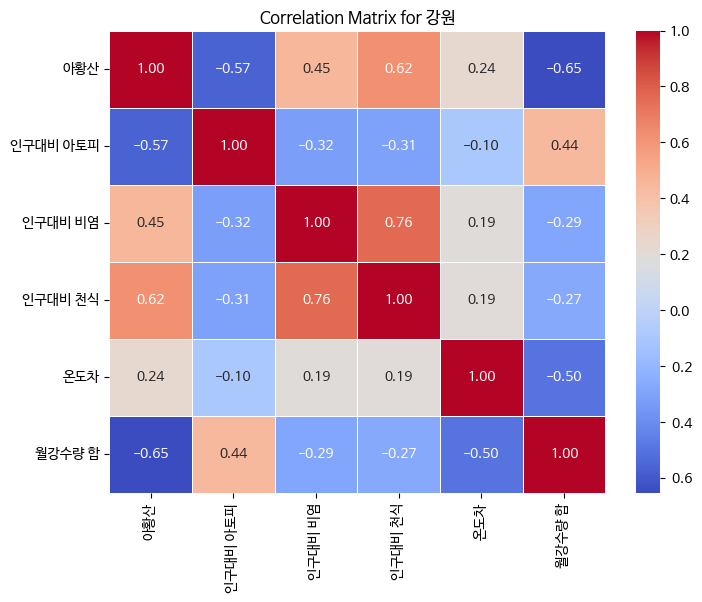

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


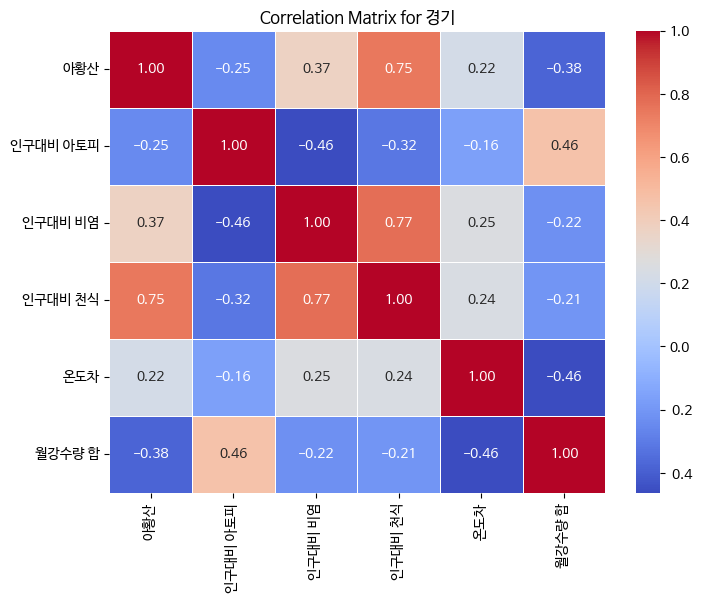

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


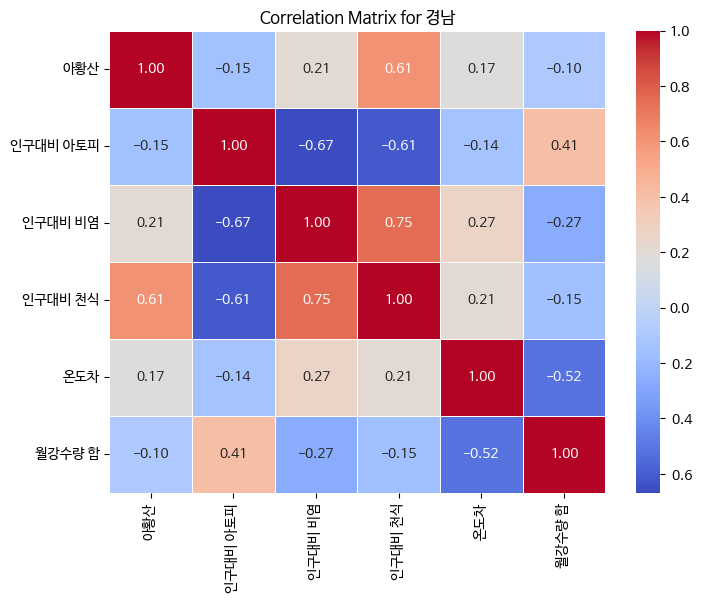

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


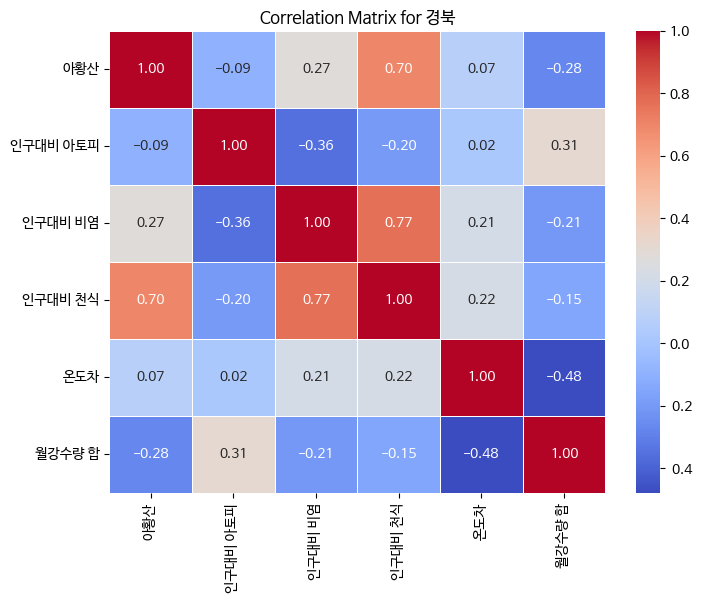

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


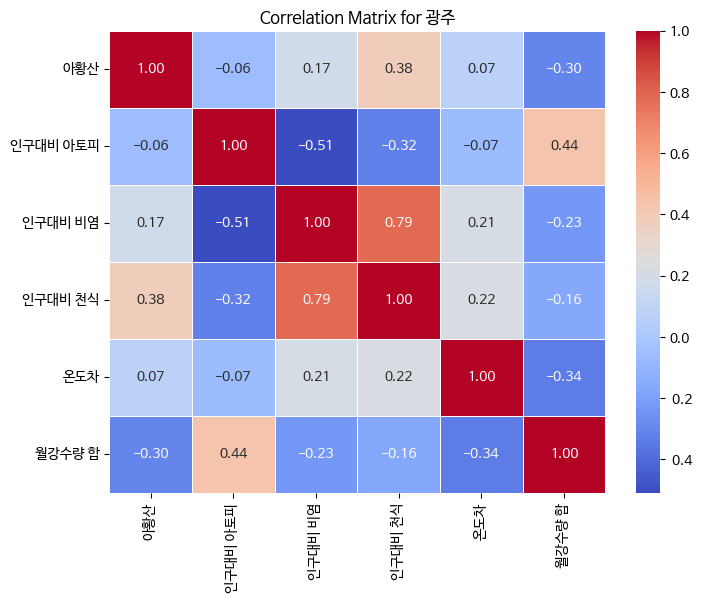

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


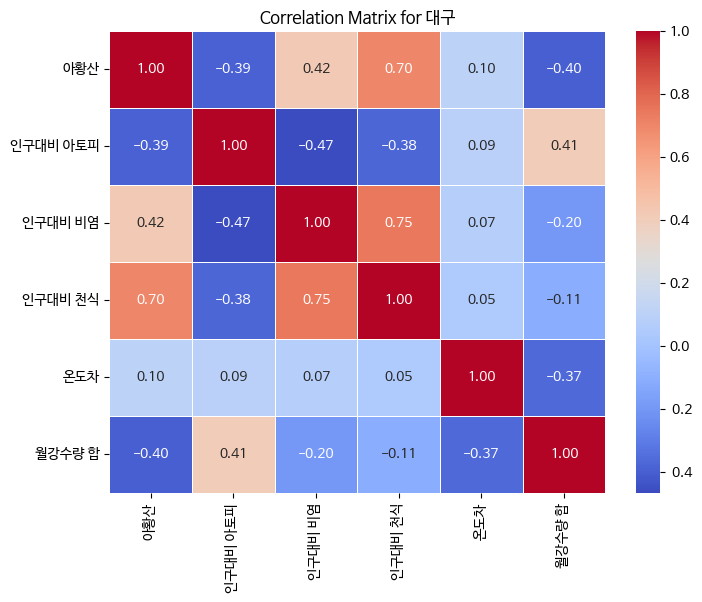

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


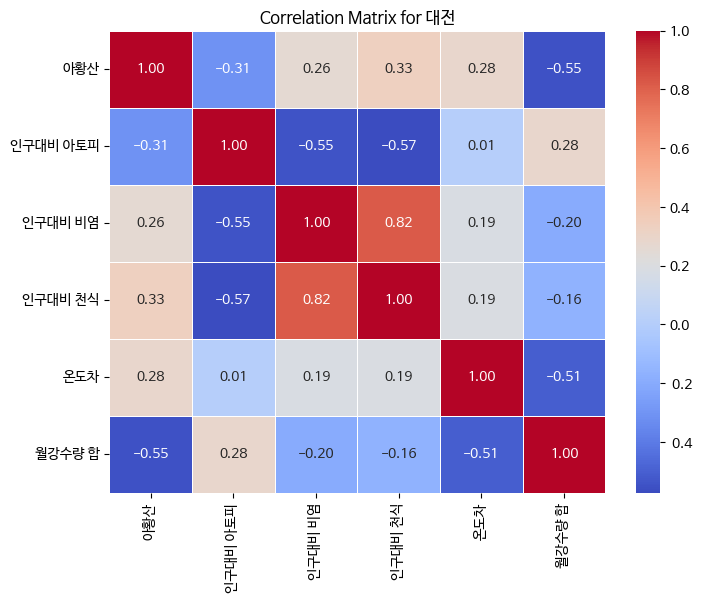

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


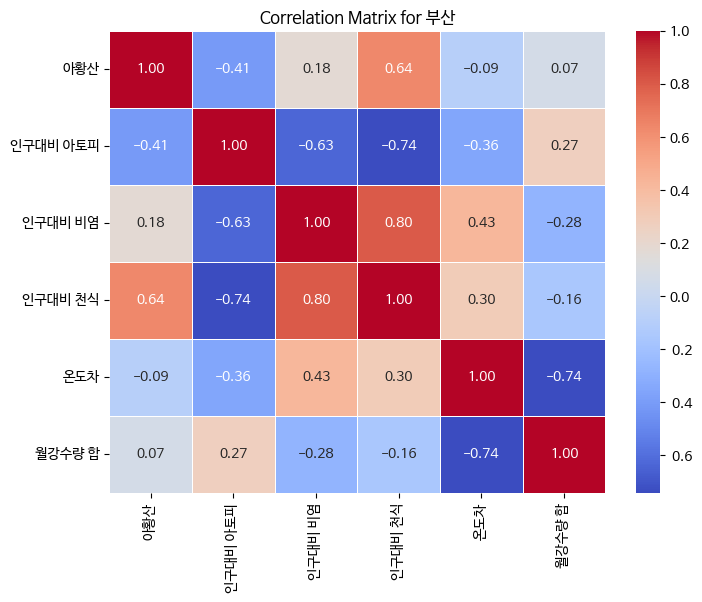

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


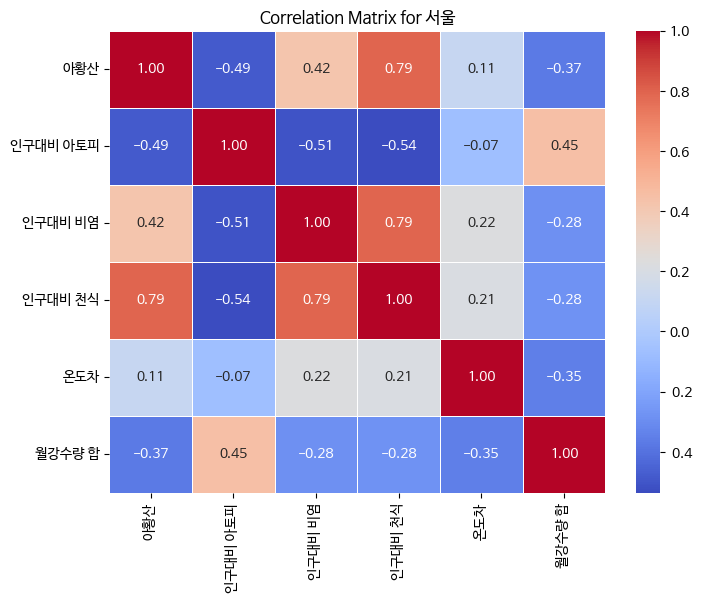

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


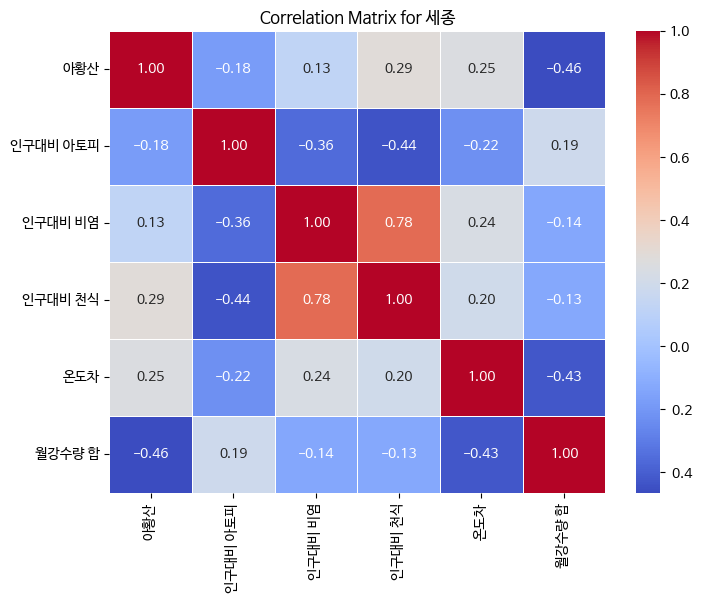

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


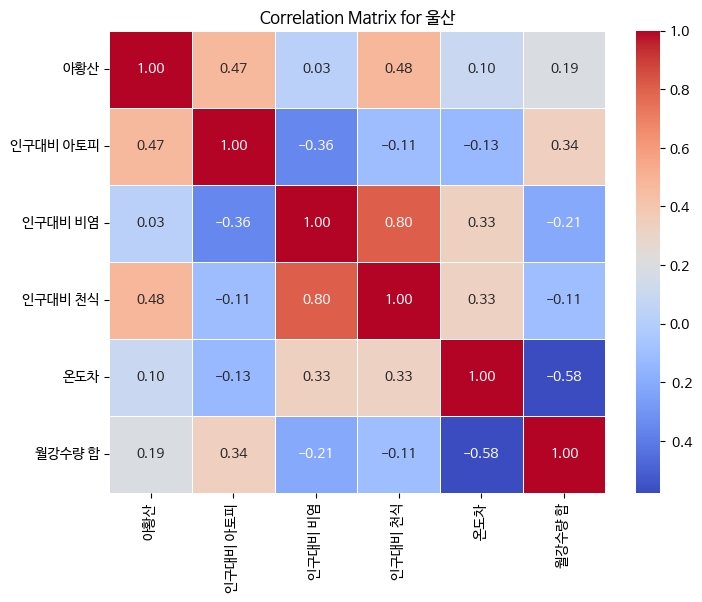

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


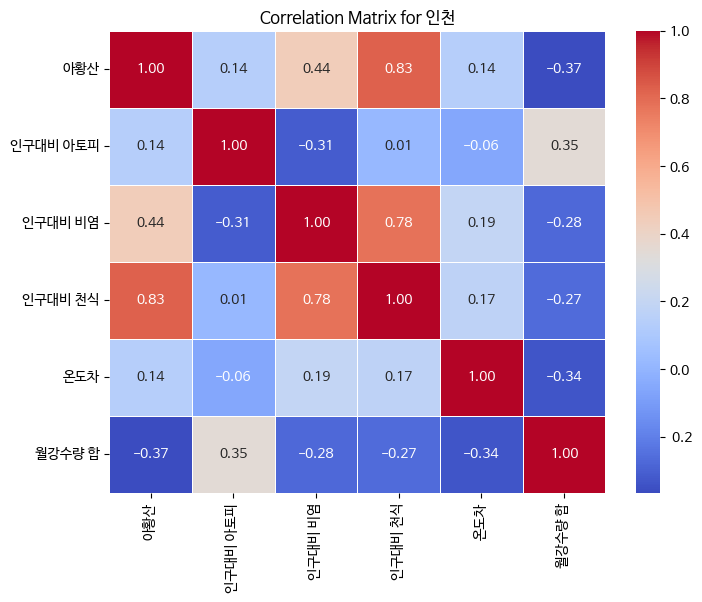

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


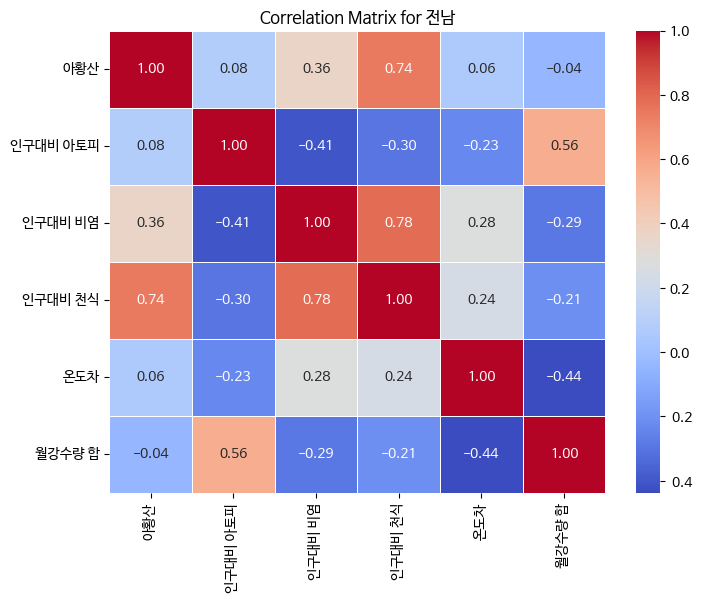

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


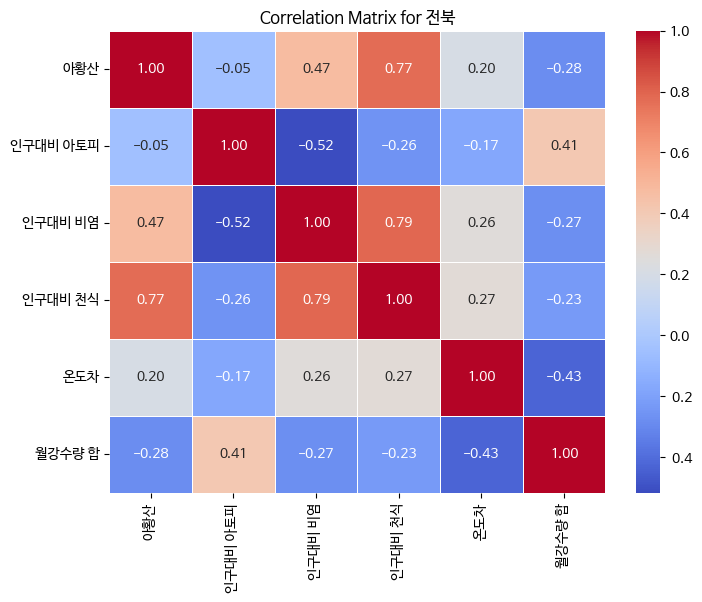

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


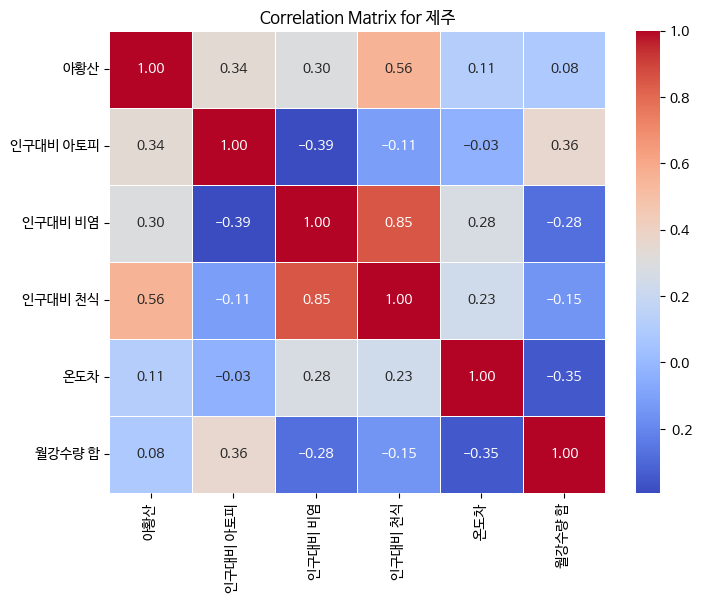

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


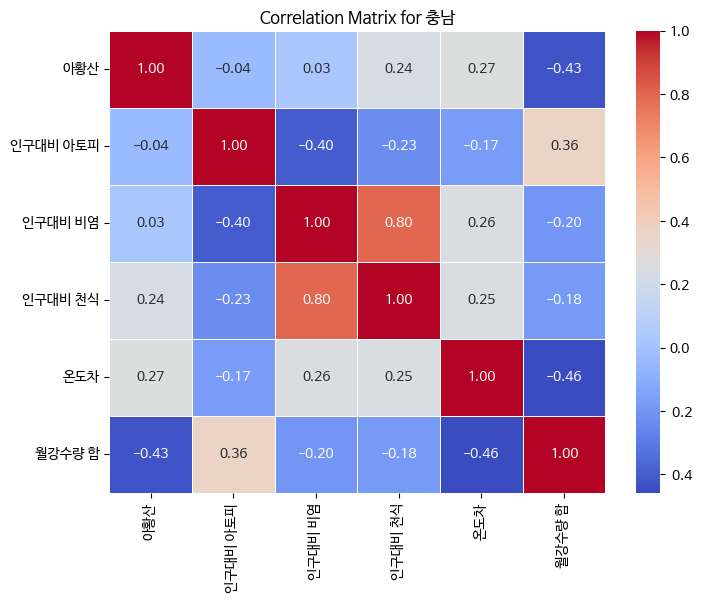

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


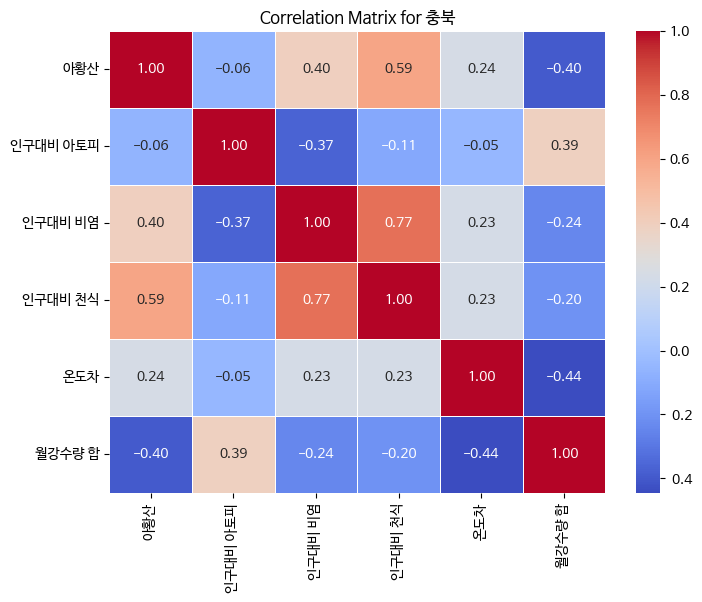

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# 예시 데이터프레임 생성
# df = ...

# '주소(시도)' 열을 기준으로 데이터프레임을 분할
unique_addresses = df['주소(시도)'].unique()

for address in unique_addresses:
    # 각 주소(시도)에 해당하는 데이터 추출
    subset_df = df[df['주소(시도)'] == address]

    # 선택한 열들을 추출
    selected_columns = ['아황산', '인구대비 아토피', '인구대비 비염', '인구대비 천식','온도차','월강수량 합']
    subset_df = subset_df[selected_columns]

    # 상관계수 계산 (여기서는 Spearman 상관계수 사용)
    correlation_matrix, _ = spearmanr(subset_df)

    # 결과 출력
    correlation_df = pd.DataFrame(correlation_matrix, index=selected_columns, columns=selected_columns)

    # 히트맵 그리기
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlation_df, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
    plt.title(f"Correlation Matrix for {address}")
    plt.show()


In [ ]:
import pandas as pd
from scipy.stats import mannwhitneyu
import numpy as np

# 예시 데이터프레임 생성
# df = ...

# '아산화' 열에 로그 씌우기
df['아황산'] = np.log(df['아황산'])

# '아황산'이 높은 지역과 낮은 지역으로 나누기
high_asan = df[df['아황산'] > df['아황산'].median()]  # 혹은 다른 기준으로 나눌 수 있음
low_asan = df[df['아황산'] <= df['아황산'].median()]

# '인구대비 천식', '인구대비 비염', '인구대비 아토피'의 값 비교
columns_of_interest = ['인구대비 천식', '인구대비 비염', '인구대비 아토피']

for column in columns_of_interest:
    # Mann-Whitney U 검정을 사용하여 두 그룹 간의 차이 테스트
    stat, p_value = mannwhitneyu(high_asan[column], low_asan[column], alternative='two-sided')

    print(f"'{column}'에 대한 검정 결과:")
    print(f"통계량 (U-statistic): {stat}")
    print(f"P-value: {p_value}")

    # P-value를 기준으로 결과 출력
    if p_value < 0.05:
        print("유의미한 차이가 있음\n")
    else:
        print("유의미한 차이가 없음\n")


'인구대비 천식'에 대한 검정 결과:
통계량 (U-statistic): 642164.0
P-value: 1.3131263872019681e-74
유의미한 차이가 있음

'인구대비 비염'에 대한 검정 결과:
통계량 (U-statistic): 531343.0
P-value: 1.6282917804616288e-19
유의미한 차이가 있음

'인구대비 아토피'에 대한 검정 결과:
통계량 (U-statistic): 349429.0
P-value: 8.781031609313289e-10
유의미한 차이가 있음



환경 데이터에 로그 씌운 거

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


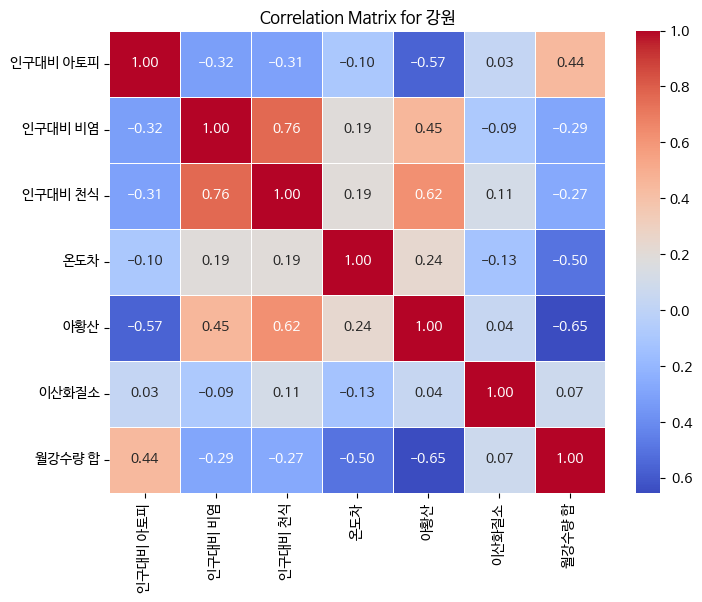

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


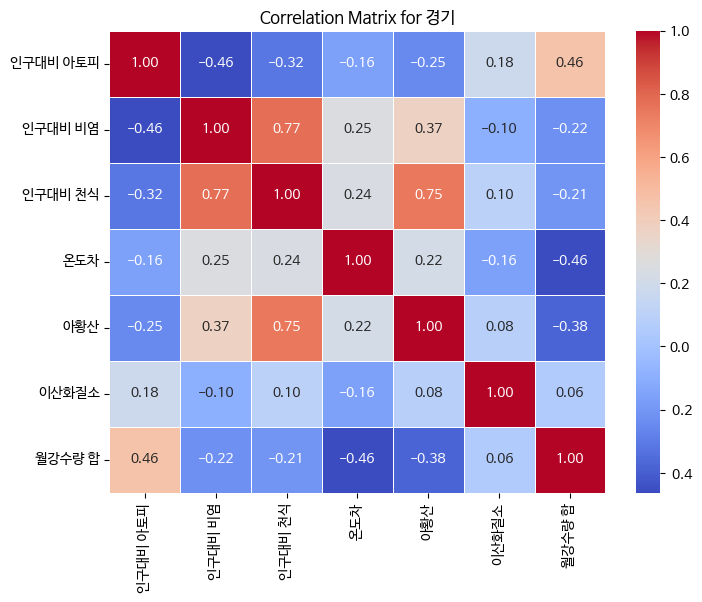

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


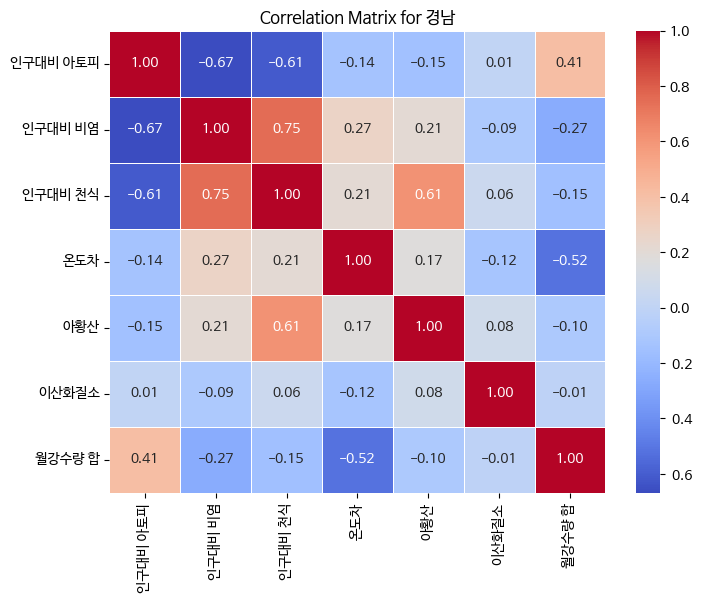

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


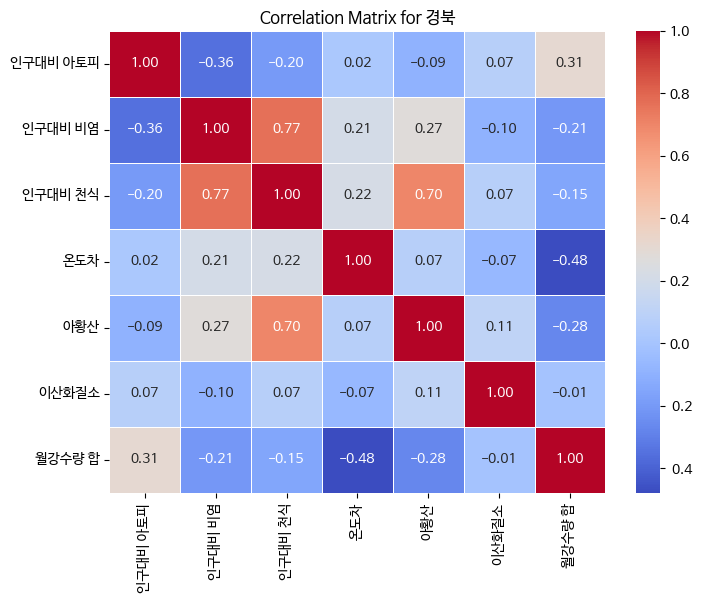

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


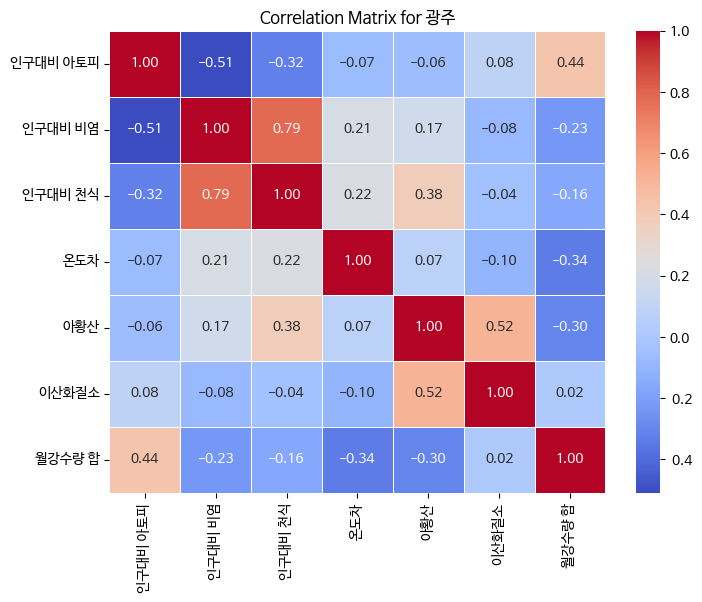

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


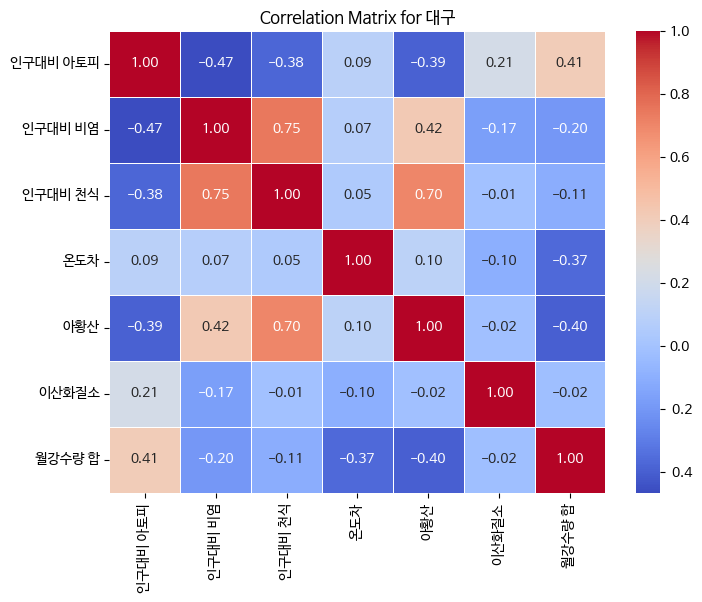

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


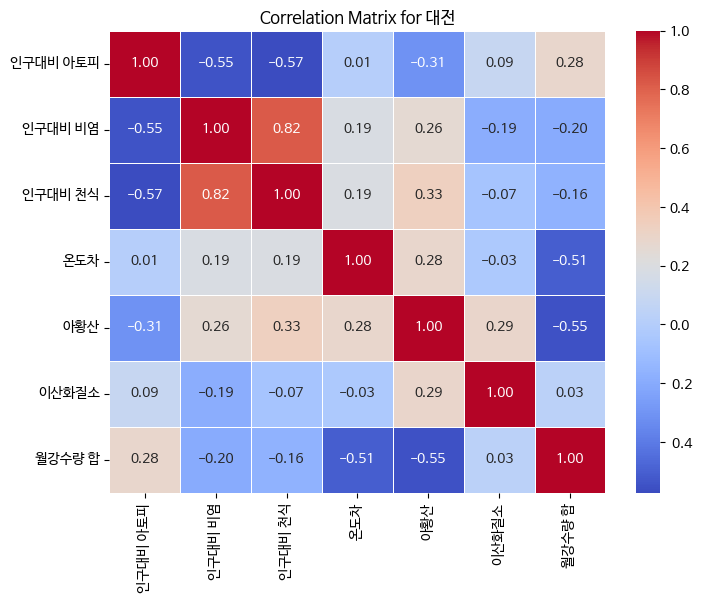

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


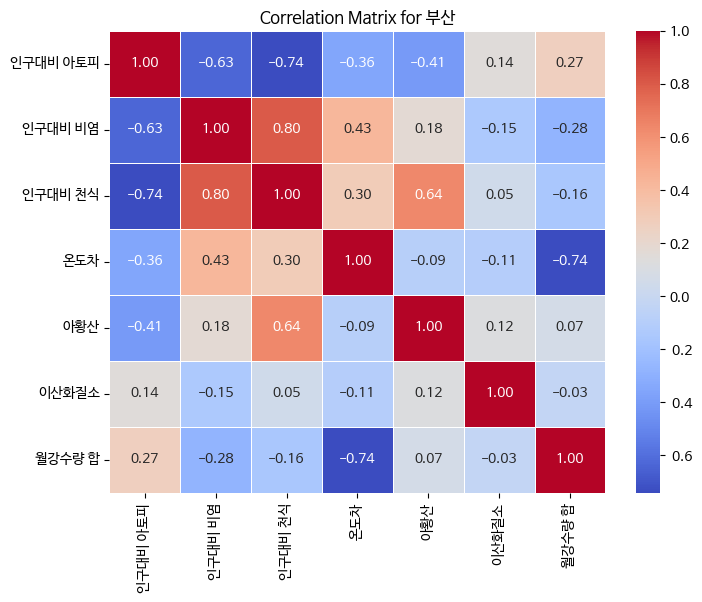

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


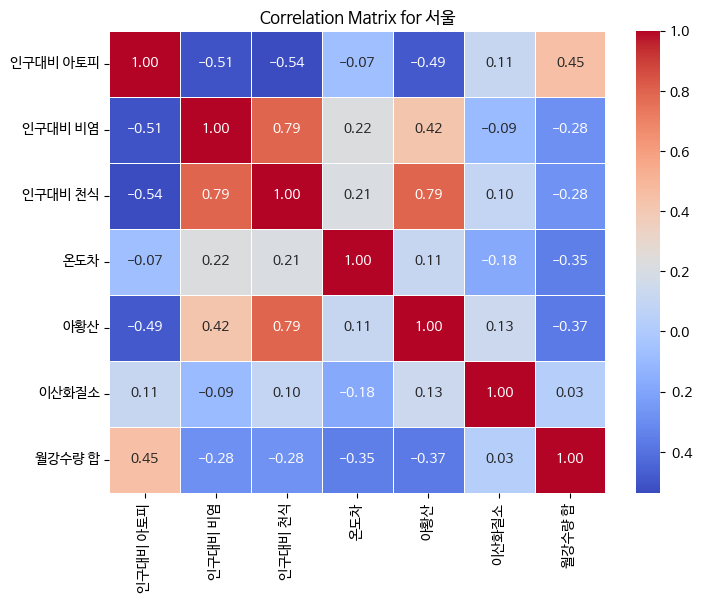

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


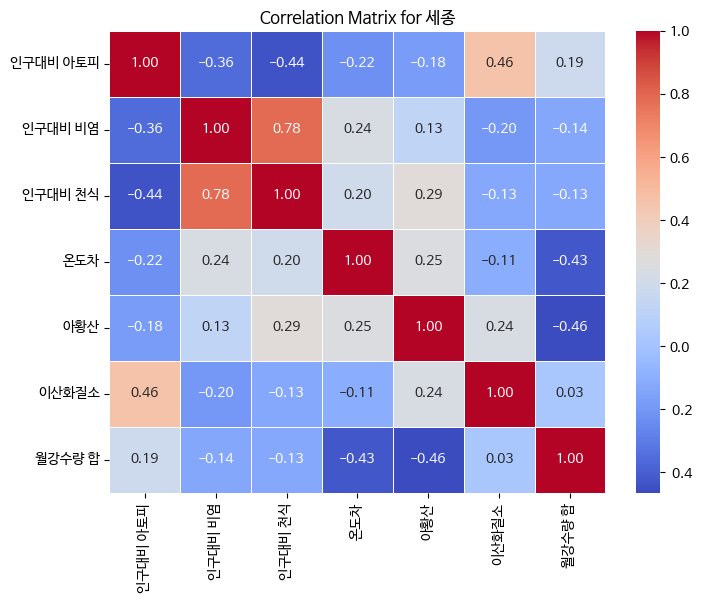

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


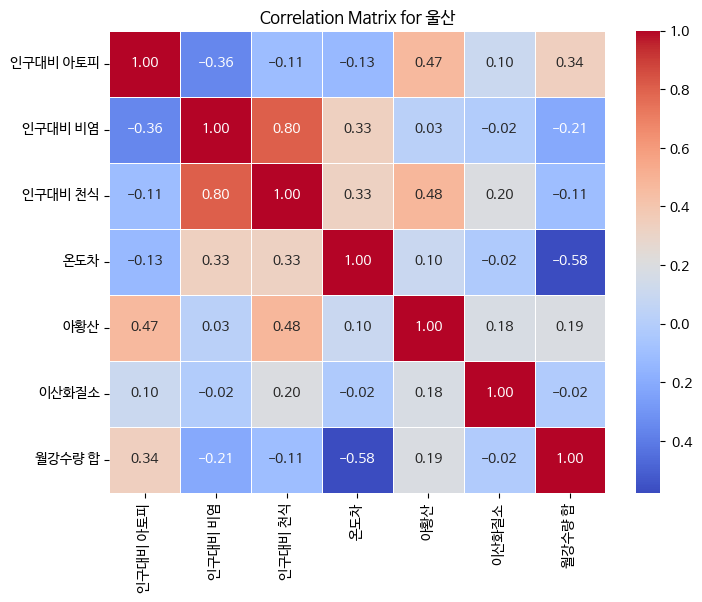

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


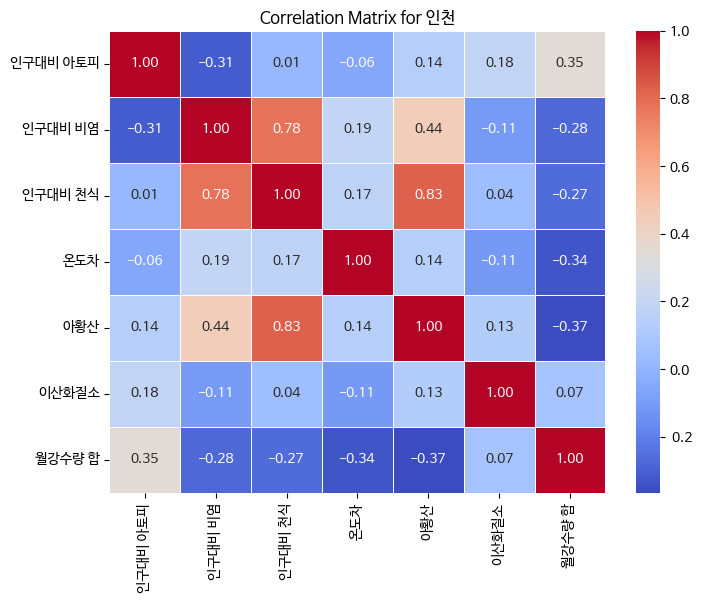

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


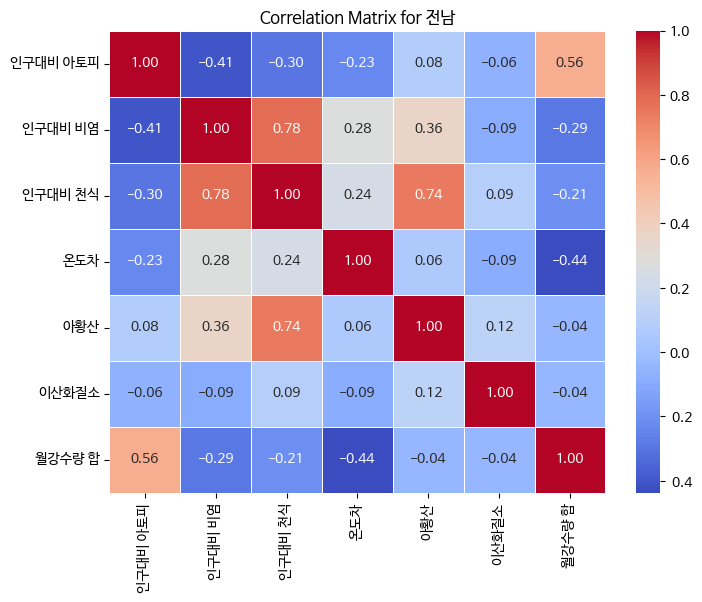

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


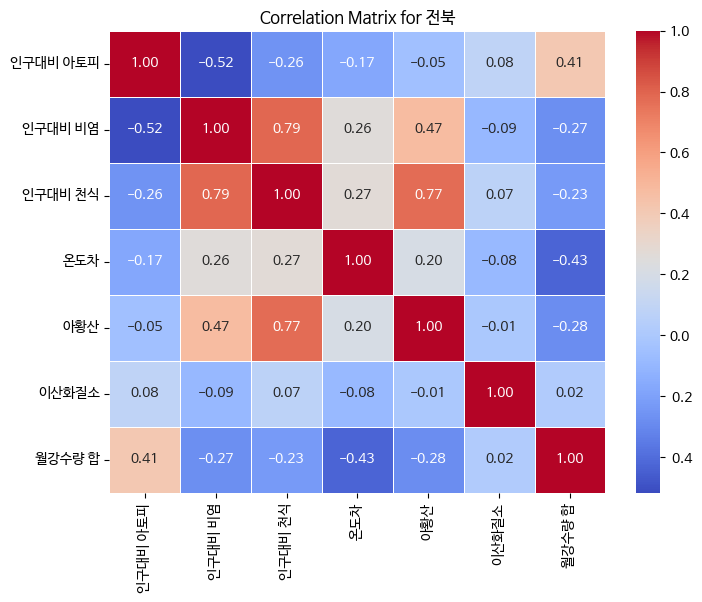

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


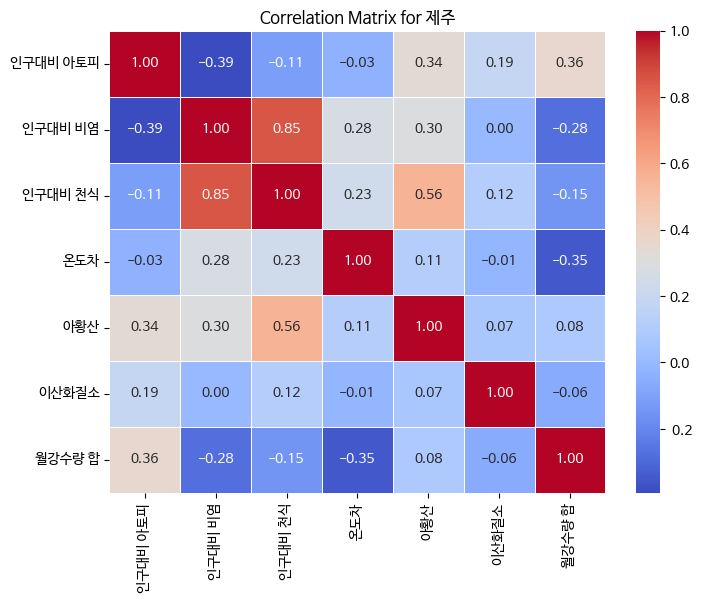

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


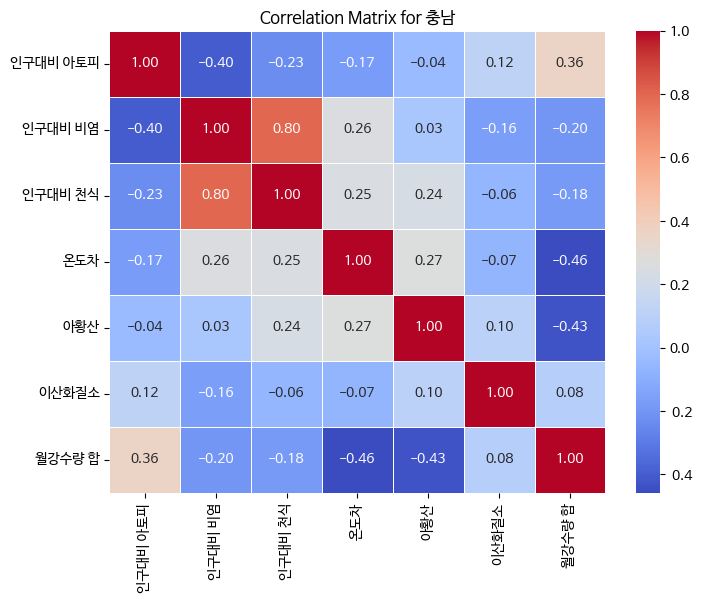

<ipython-input-71-7c34cd2161c2>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


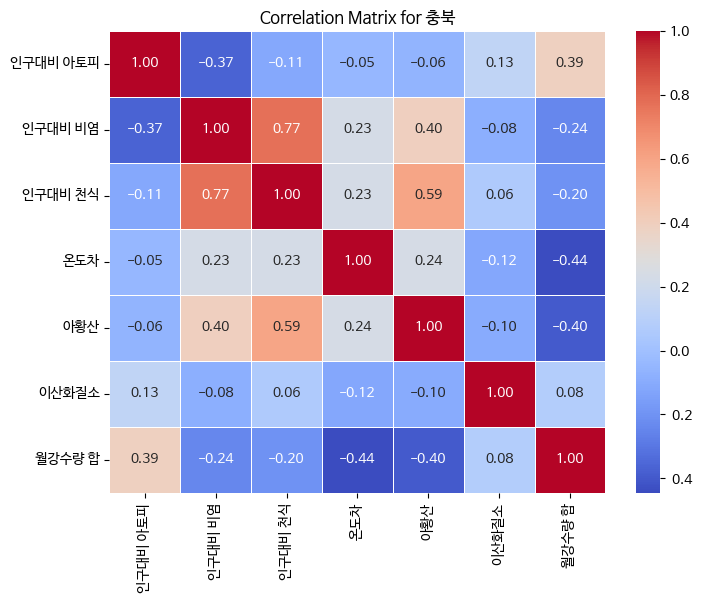

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
import numpy as np

# 예시 데이터프레임 생성
# df = ...

# '주소(시도)' 열을 기준으로 데이터프레임을 분할
unique_addresses = df['주소(시도)'].unique()

for address in unique_addresses:
    # 각 주소(시도)에 해당하는 데이터 추출
    subset_df = df[df['주소(시도)'] == address]

    # 선택한 열들을 추출
    selected_columns = [ '인구대비 아토피', '인구대비 비염', '인구대비 천식','온도차','아황산', '이산화질소','월강수량 합']

    # '아황산', '이산화질소' 열에 로그를 씌움
    subset_df[['아황산', '이산화질소']] = subset_df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)

    subset_df = subset_df[selected_columns]

    # 상관계수 계산 (여기서는 Spearman 상관계수 사용)
    correlation_matrix, _ = spearmanr(subset_df)

    # 결과 출력
    correlation_df = pd.DataFrame(correlation_matrix, index=selected_columns, columns=selected_columns)

    # 히트맵 그리기
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlation_df, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
    plt.title(f"Correlation Matrix for {address}")
    plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


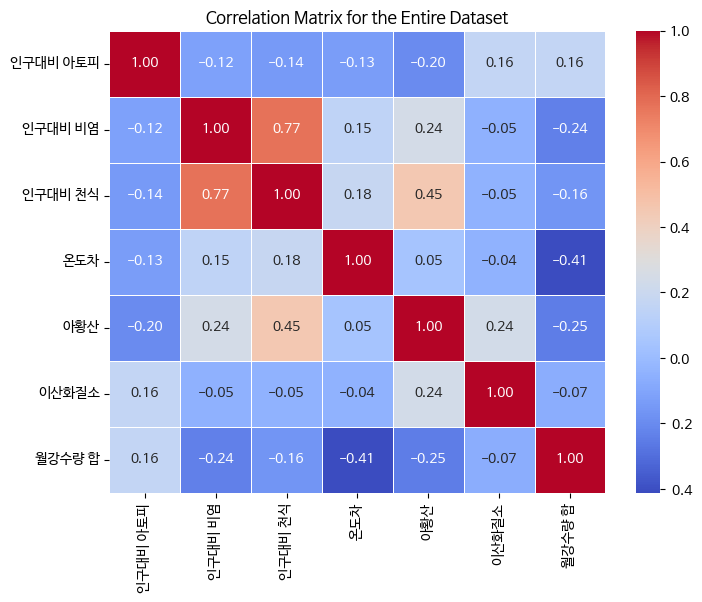

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
import numpy as np

# 예시 데이터프레임 생성
# df = ...

# 선택한 열들을 추출
selected_columns = ['인구대비 아토피', '인구대비 비염', '인구대비 천식', '온도차', '아황산', '이산화질소','월강수량 합']

# '아황산', '이산화질소' 열에 로그를 씌움
df[['아황산', '이산화질소']] = df[['아황산', '이산화질소']].apply(lambda x: np.log(x) if x.name in ['아황산', '이산화질소'] else x)

# 데이터 전체에 대한 상관계수 계산 (여기서는 Spearman 상관계수 사용)
correlation_matrix, _ = spearmanr(df[selected_columns])

# 결과 출력
correlation_df = pd.DataFrame(correlation_matrix, index=selected_columns, columns=selected_columns)

# 히트맵 그리기
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_df, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Matrix for the Entire Dataset")
plt.show()


# permutation importance

In [ ]:
df['로그_아황산'] = np.log1p(df['아황산'])
df['로그_이산화질소'] = np.log1p(df['이산화질소'])

In [ ]:
df.head()

,주소(시도),평균기온(°C),평균최저기온(°C),평균최고기온(°C),월강수량 합,인구대비 천식,인구대비 비염,인구대비 아토피,아황산,이산화질소,온도차,로그_아황산,로그_일산화질소
일시,,,,,,,,,,,,,
2013-01-01,강원,-4.700000,-9.707692,0.838462,39.961538,0.006959,0.037647,0.002588,0.010,0.028,10.546154,0.009950,0.027615
2013-02-01,강원,-1.484615,-6.792308,3.869231,36.992308,0.006662,0.035763,0.002615,0.007,0.026,10.661538,0.006976,0.025668
2013-03-01,강원,4.946154,-1.000000,11.315385,54.123077,0.008314,0.043735,0.002685,0.005,0.025,12.315385,0.004988,0.024693
2013-04-01,강원,8.830769,3.253846,14.584615,62.561538,0.007726,0.040480,0.002679,0.004,0.024,11.330769,0.003992,0.023717
2013-05-01,강원,16.892308,11.269231,23.100000,91.561538,0.006778,0.032398,0.003026,0.003,0.022,11.830769,0.002996,0.021761


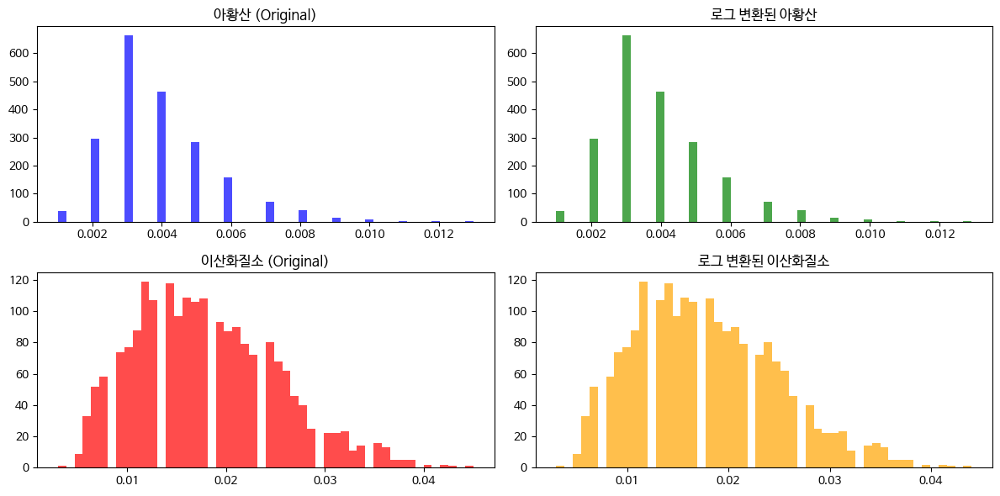

In [ ]:
df['로그_아황산'] = np.log1p(df['아황산'])
df['로그_이산화질소'] = np.log1p(df['이산화질소'])

# 분포 그래프 그리기
plt.figure(figsize=(12, 6))

plt.subplot(2, 2, 1)
plt.hist(df['아황산'], bins=50, color='blue', alpha=0.7)
plt.title('아황산 (Original)')

plt.subplot(2, 2, 2)
plt.hist(df['로그_아황산'], bins=50, color='green', alpha=0.7)
plt.title('로그 변환된 아황산')

plt.subplot(2, 2, 3)
plt.hist(df['이산화질소'], bins=50, color='red', alpha=0.7)
plt.title('이산화질소 (Original)')

plt.subplot(2, 2, 4)
plt.hist(df['로그_이산화질소'], bins=50, color='orange', alpha=0.7)
plt.title('로그 변환된 이산화질소')

plt.tight_layout()
plt.show()

# 중금속 추가

In [ ]:
df2.head()

,주소(시도),일시,평균기온(°C),평균최저기온(°C),평균최고기온(°C),월합강수량(00~24h만)(mm),아황산가스(ppm),이산화질소(ppm),As(μg/m³),Cd,...,Cu,Fe,Mn,Ni,Pb,오존(ppm),미세먼지,인구대비 천식,인구대비 비염,인구대비 아토피
0,강원,2013-01-01,-4.700000,-9.707692,0.838462,39.961538,0.01,0.028,0.008600,0.002475,...,0.020425,0.960825,0.069225,0.003475,0.093475,0.018,72,0.006959,0.037647,0.002588
1,강원,2013-02-01,-1.484615,-6.792308,3.869231,36.992308,0.007,0.023,0.005675,0.001225,...,0.018900,1.093250,0.059775,0.003575,0.056675,0.024,NaN,0.006662,0.035763,0.002615
2,강원,2013-03-01,4.946154,-1.000000,11.315385,54.123077,0.005,0.021,0.010425,0.002350,...,0.034725,2.283200,0.164425,0.008450,0.100750,0.03,NaN,0.008314,0.043735,0.002685
3,강원,2013-04-01,8.830769,3.253846,14.584615,62.561538,0.004,0.017,0.002950,0.000825,...,0.013025,1.181400,0.055450,0.003825,0.037925,0.037,57,0.007726,0.040480,0.002679
4,강원,2013-05-01,16.892308,11.269231,23.100000,91.561538,0.003,0.015,0.005950,0.001000,...,0.021325,1.175250,0.158575,0.004225,0.050325,0.041,60,0.006778,0.032398,0.003026


In [ ]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

df2 = df2.applymap(lambda x: x.replace('*', '') if isinstance(x, str) else x)
df2.set_index(df2['일시'], inplace=True)
df2['온도차'] = df2['평균최고기온(°C)'] - df2['평균최저기온(°C)']

df2 = df2.rename(columns={'아황산가스(ppm)': '아황산가스'})
df2 = df2.rename(columns={'이산화질소(ppm)': '이산화질소'})
df2 = df2[~df2['주소(시도)'].isin(['세종', '제주'])]
df2 = df2.drop(columns=['As(μg/m³)','Cd','Ni'])
df2 = df2.drop(columns=['Cr','Cu'])
df2 = df2.rename(columns={'월합강수량(00~24h만)(mm)': '월강수량 합'})
df2 = df2.dropna()
scaler = MinMaxScaler()
df2[['Fe', 'Mn', 'Pb']] = scaler.fit_transform(df2[['Fe', 'Mn', 'Pb']])
# 'Fe', 'Mn', 'Pb' 열의 값을 합친 '중금속' 열 생성
df2['중금속'] = df2['Fe'] + df2['Mn'] + df2['Pb']

In [ ]:
df2 = df2.rename(columns={'오존(ppm)': '오존'})

In [ ]:
df2.columns

Index(['주소(시도)', '일시', '평균기온(°C)', '평균최저기온(°C)', '평균최고기온(°C)', '월강수량 합',
       '아황산가스', '이산화질소', 'Fe', 'Mn', 'Pb', '오존(ppm)', '미세먼지', '인구대비 천식',
       '인구대비 비염', '인구대비 아토피', '온도차', '중금속'],
      dtype='object')

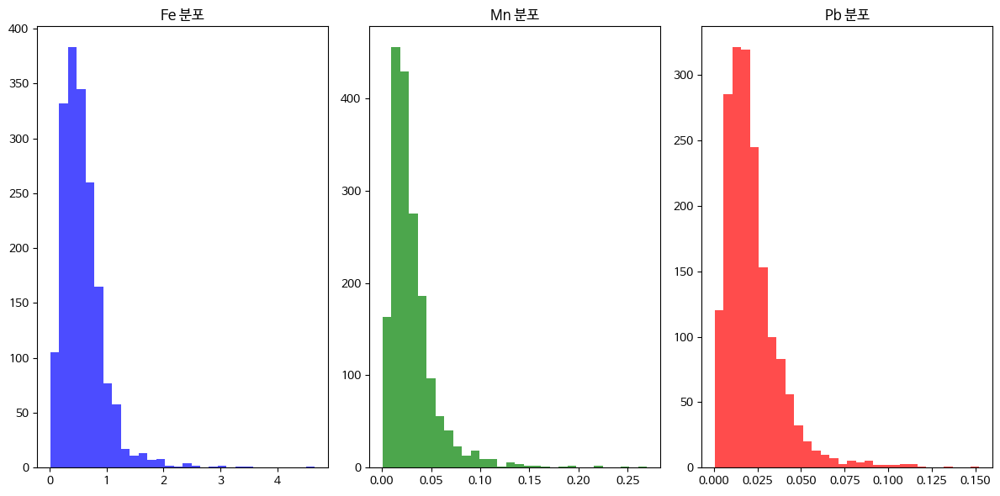

In [ ]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.hist(df2['Fe'], bins=30, color='blue', alpha=0.7)
plt.title('Fe 분포')

plt.subplot(1, 3, 2)
plt.hist(df2['Mn'], bins=30, color='green', alpha=0.7)
plt.title('Mn 분포')

plt.subplot(1, 3, 3)
plt.hist(df2['Pb'], bins=30, color='red', alpha=0.7)
plt.title('Pb 분포')

plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


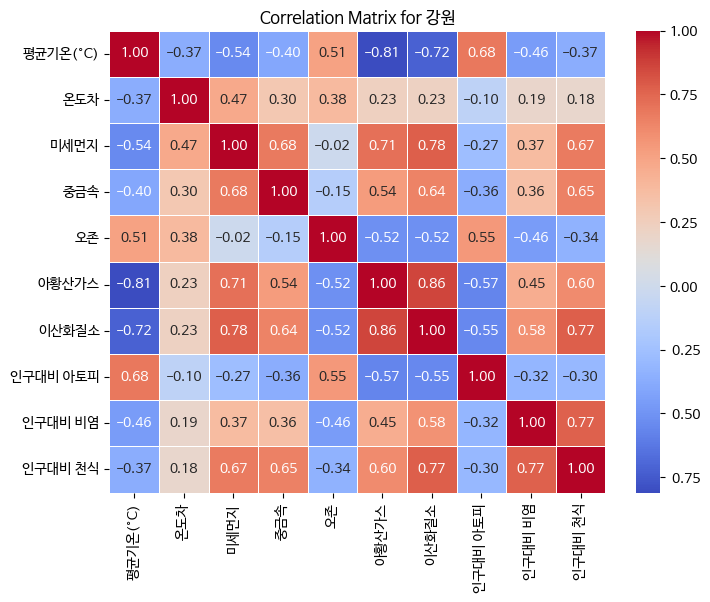

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


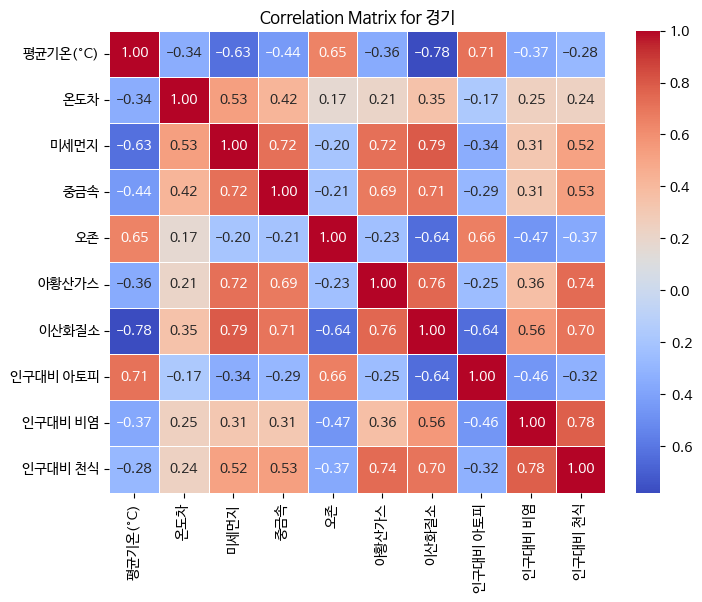

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


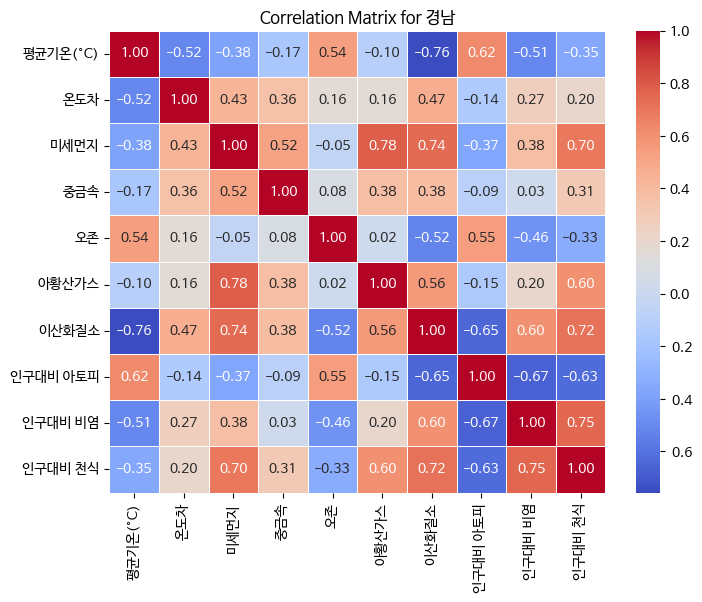

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


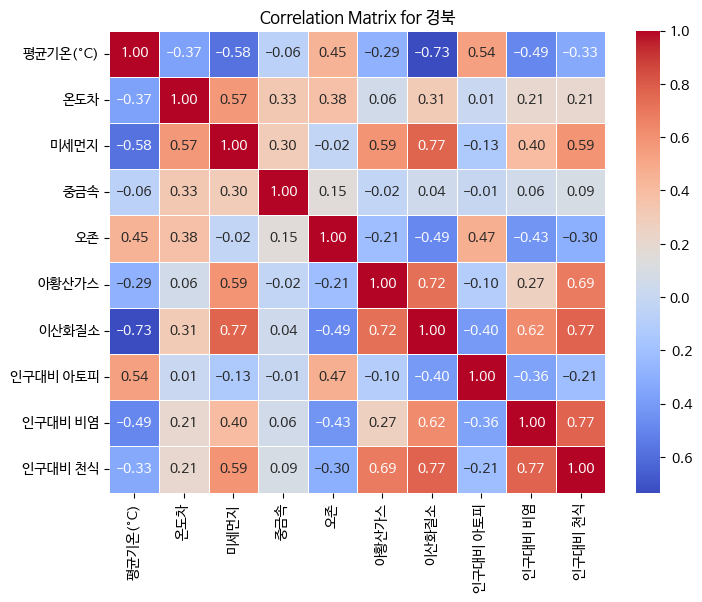

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


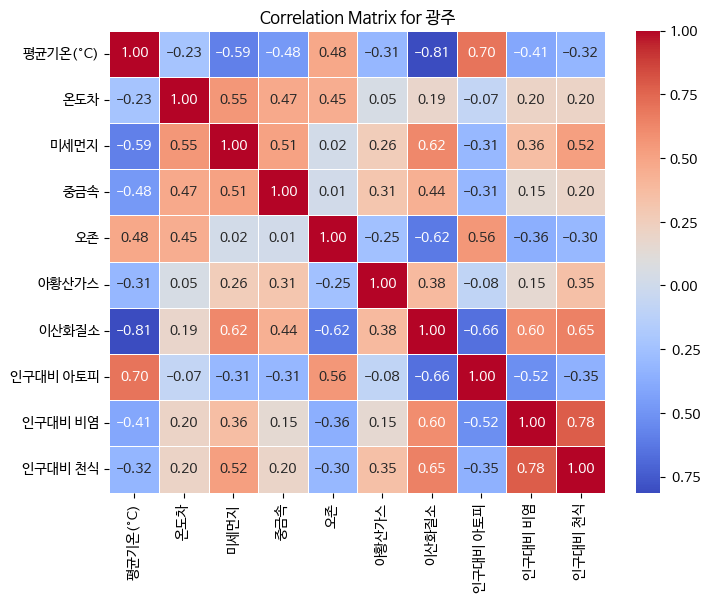

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


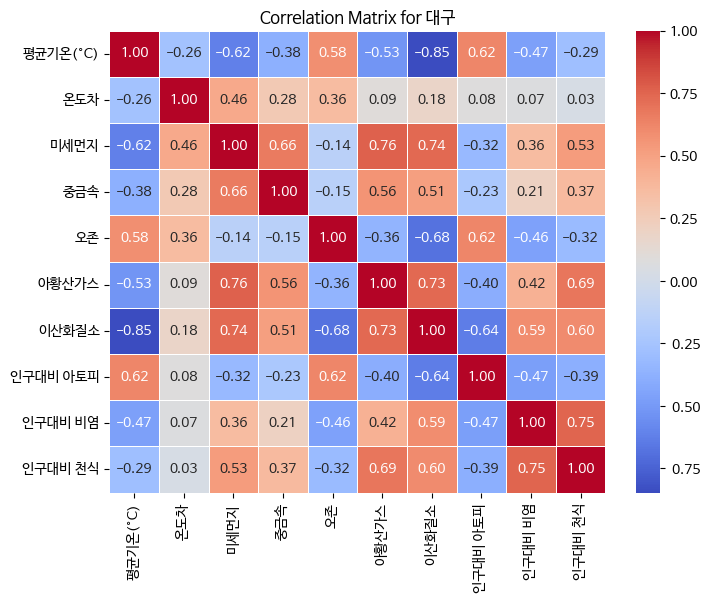

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


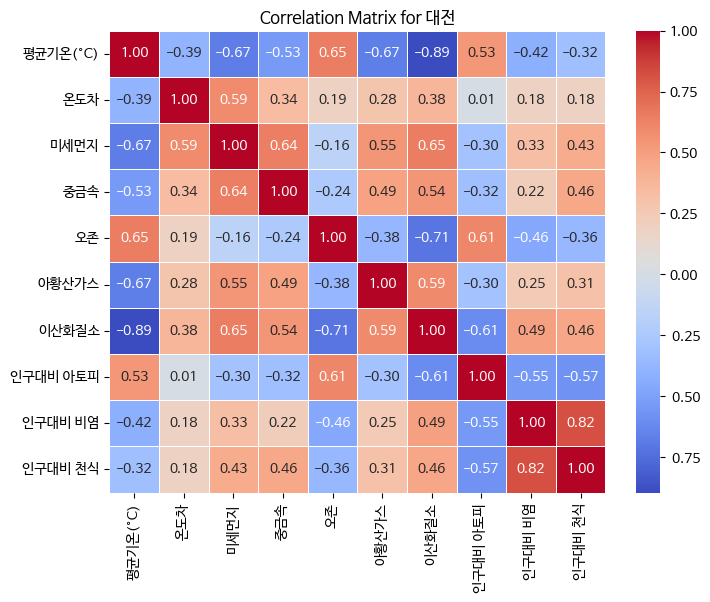

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


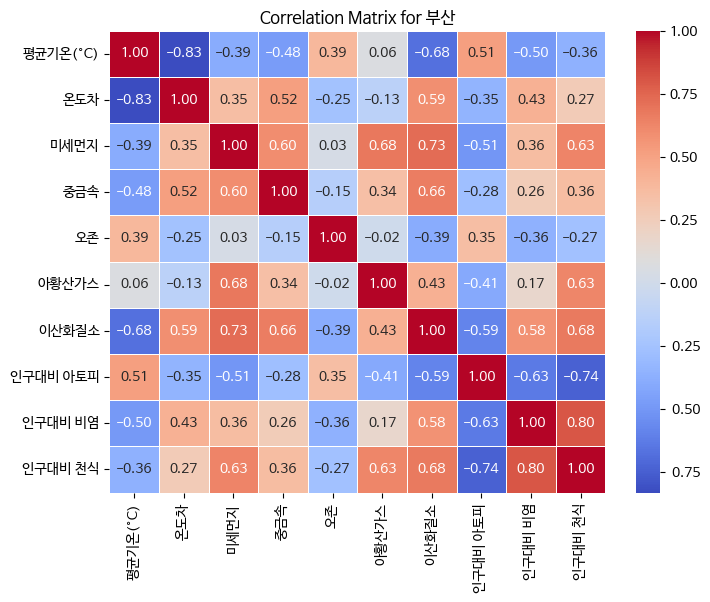

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


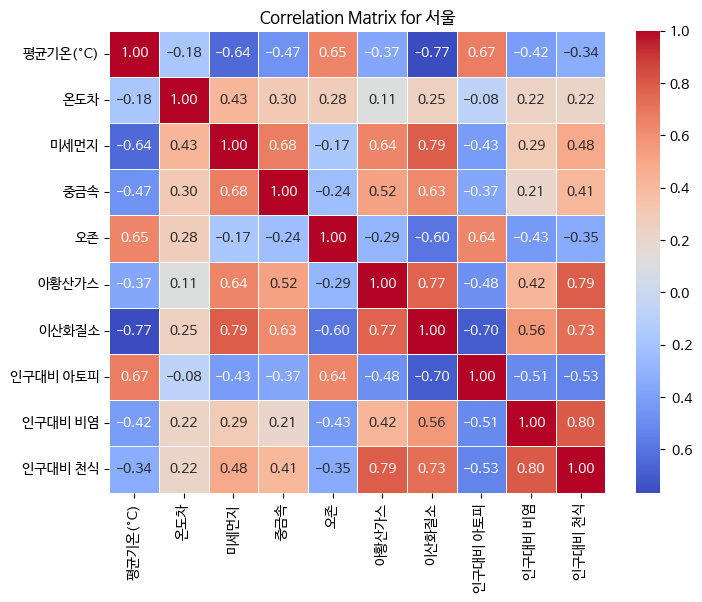

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


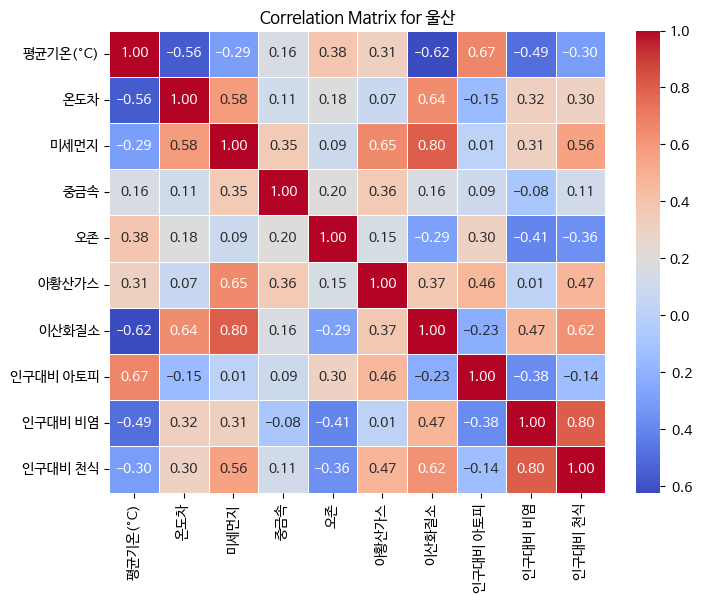

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


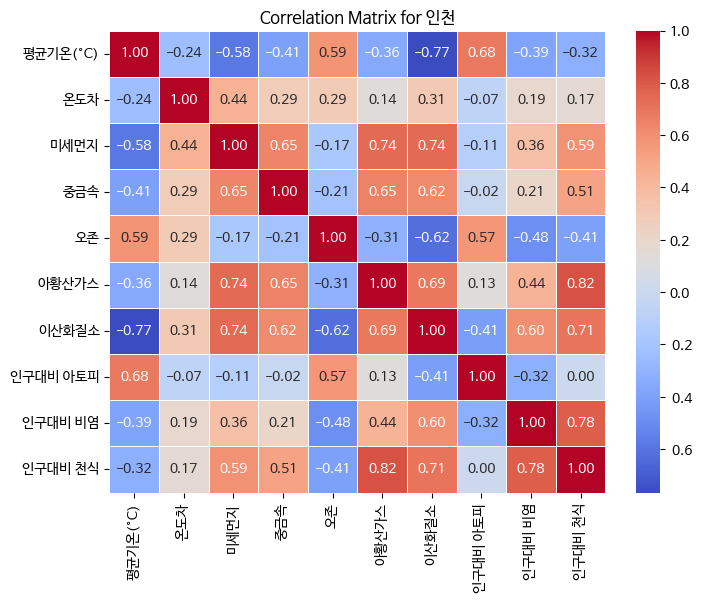

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


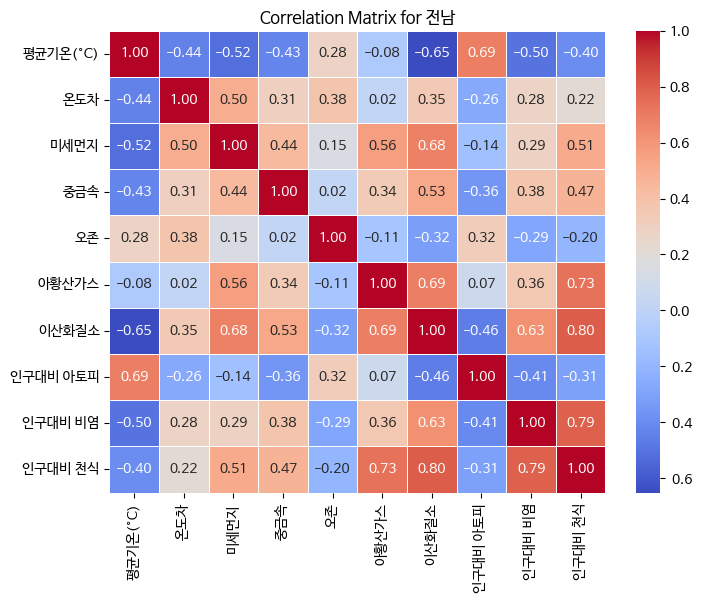

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


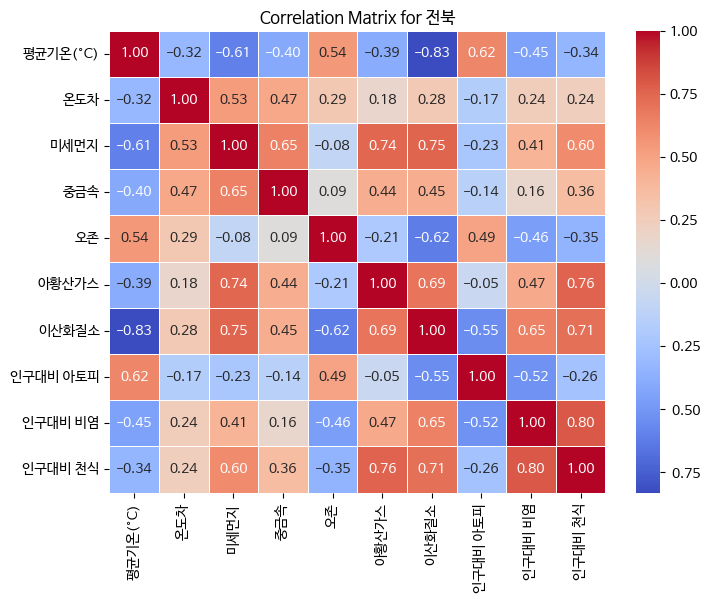

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


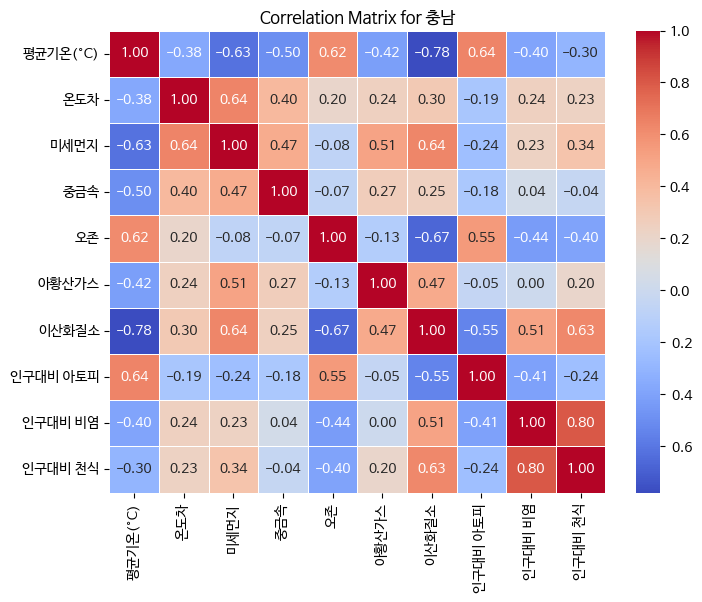

/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


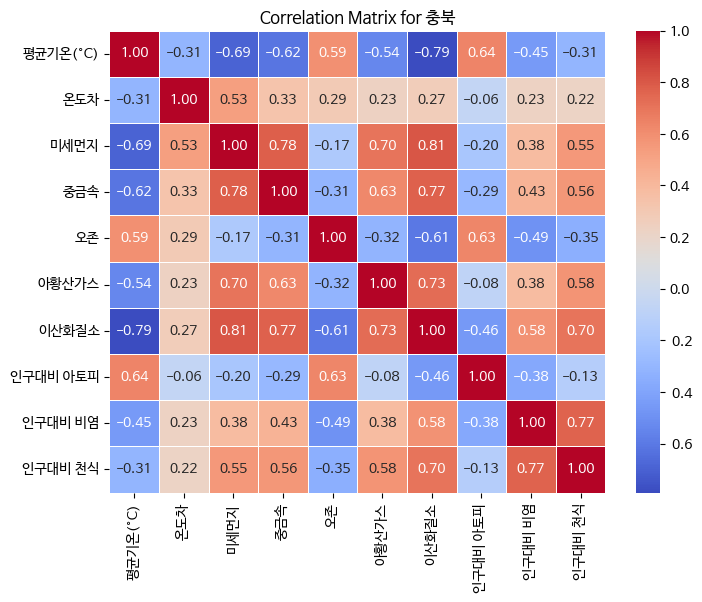

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
import numpy as np

# 예시 데이터프레임 생성
# df = ...

# '주소(시도)' 열을 기준으로 데이터프레임을 분할
unique_addresses = df2['주소(시도)'].unique()

for address in unique_addresses:
    # 각 주소(시도)에 해당하는 데이터 추출
    subset_df = df2[df2['주소(시도)'] == address]

    # 선택한 열들을 추출
    selected_columns = [ '평균기온(°C)','온도차','미세먼지','중금속','오존','아황산가스', '이산화질소','인구대비 아토피', '인구대비 비염', '인구대비 천식']

    # '아황산', '이산화질소' 열에 로그를 씌움

    subset_df = subset_df[selected_columns]

    # 상관계수 계산 (여기서는 Spearman 상관계수 사용)
    correlation_matrix, _ = spearmanr(subset_df)

    # 결과 출력
    correlation_df = pd.DataFrame(correlation_matrix, index=selected_columns, columns=selected_columns)

    # 히트맵 그리기
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlation_df, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
    plt.title(f"Correlation Matrix for {address}")
    plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


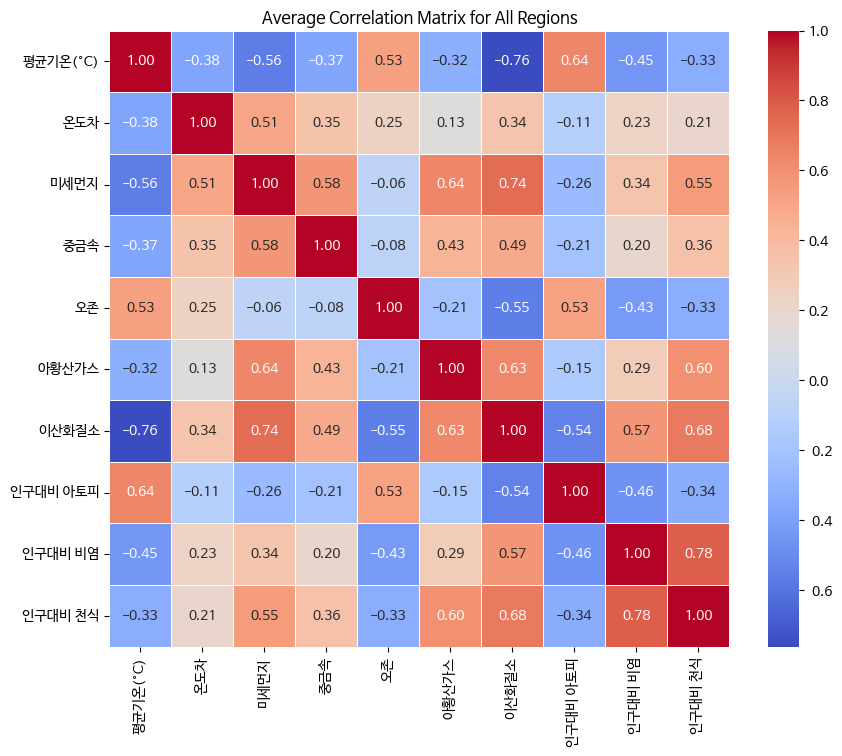

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
import numpy as np

# 예시 데이터프레임 생성
# df2 = ...

# '주소(시도)' 열을 기준으로 데이터프레임을 분할
unique_addresses = df2['주소(시도)'].unique()

# 빈 상관계수 행렬 초기화
total_correlation_matrix = np.zeros((len(selected_columns), len(selected_columns)))

# 각 주소(시도)에 대한 상관계수 계산 및 누적
for address in unique_addresses:
    # 각 주소(시도)에 해당하는 데이터 추출
    subset_df = df2[df2['주소(시도)'] == address]

    # 선택한 열들을 추출
    subset_df = subset_df[selected_columns]

    # 상관계수 계산 (여기서는 Spearman 상관계수 사용)
    correlation_matrix, _ = spearmanr(subset_df)

    # 누적
    total_correlation_matrix += correlation_matrix

# 각 지역별로 더한 후 평균을 구함
average_correlation_matrix = total_correlation_matrix / len(unique_addresses)

# 결과 출력
correlation_df = pd.DataFrame(average_correlation_matrix, index=selected_columns, columns=selected_columns)

# 히트맵 그리기
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_df, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Average Correlation Matrix for All Regions")
plt.show()


In [ ]:
def test(df,col):
  import pandas as pd
  from scipy.stats import mannwhitneyu
  import numpy as np

  # '아산화' 열에 로그 씌우기

  # '아황산'이 높은 지역과 낮은 지역으로 나누기
  high_asan = df[df[col] > df[col].median()]  # 혹은 다른 기준으로 나눌 수 있음
  low_asan = df[df[col] <= df[col].median()]

  # '인구대비 천식', '인구대비 비염', '인구대비 아토피'의 값 비교
  columns_of_interest = ['인구대비 천식', '인구대비 비염', '인구대비 아토피']

  for column in columns_of_interest:
      # Mann-Whitney U 검정을 사용하여 두 그룹 간의 차이 테스트
      stat, p_value = mannwhitneyu(high_asan[column], low_asan[column], alternative='two-sided')

      print(f"'{column}'에 대한 검정 결과:")
      print(f"통계량 (U-statistic): {stat}")
      print(f"P-value: {p_value}")

      # P-value를 기준으로 결과 출력
      if p_value < 0.05:
          print(f"{col}에 대해 유의미한 차이가 있음\n")
      else:
          print(f"{col}에 대해유의미한 차이가 없음\n")

In [ ]:
df2.iloc[:, 2:] = df2.iloc[:, 2:].astype('float64')
def test(df, col):
    import pandas as pd
    from scipy.stats import mannwhitneyu

    # '아산화' 열에 로그 씌우기

    # 지역(시도)열 별 값의 평균 계산
    region_means = df.groupby('주소(시도)')[col].mean()

    # 중앙값보다 높은 지역(시도)과 낮은 지역(시도)으로 나누기
    high_asan_regions = region_means[region_means > region_means.median()].index
    low_asan_regions = region_means[region_means <= region_means.median()].index

    # '인구대비 천식', '인구대비 비염', '인구대비 아토피'의 값 비교
    columns_of_interest = ['인구대비 천식', '인구대비 비염', '인구대비 아토피']

    for column in columns_of_interest:
        # Mann-Whitney U 검정을 사용하여 두 그룹 간의 차이 테스트
        stat, p_value = mannwhitneyu(df[df['주소(시도)'].isin(high_asan_regions)][column],
                                      df[df['주소(시도)'].isin(low_asan_regions)][column], alternative='two-sided')

        print(f"'{column}'에 대한 검정 결과:")
        print(f"통계량 (U-statistic): {stat}")
        print(f"P-value: {p_value}")

        # P-value를 기준으로 결과 출력
        if p_value < 0.05:
            print(f"{col}에 대해 유의미한 차이가 있음\n")
        else:
            print(f"{col}에 대해 유의미한 차이가 없음\n")

    print("____________________")

temp = ['온도차','중금속','아황산가스', '미세먼지','오존','이산화질소']
for i in temp:
    test(df2, i)


'인구대비 천식'에 대한 검정 결과:
통계량 (U-statistic): 385544.0
P-value: 0.8493691371693373
온도차에 대해 유의미한 차이가 없음

'인구대비 비염'에 대한 검정 결과:
통계량 (U-statistic): 362808.0
P-value: 0.020414634341759958
온도차에 대해 유의미한 차이가 있음

'인구대비 아토피'에 대한 검정 결과:
통계량 (U-statistic): 321058.0
P-value: 4.736717413590408e-10
온도차에 대해 유의미한 차이가 있음

____________________
'인구대비 천식'에 대한 검정 결과:
통계량 (U-statistic): 318119.0
P-value: 7.132565145203414e-11
중금속에 대해 유의미한 차이가 있음

'인구대비 비염'에 대한 검정 결과:
통계량 (U-statistic): 341022.0
P-value: 1.2200085396776776e-05
중금속에 대해 유의미한 차이가 있음

'인구대비 아토피'에 대한 검정 결과:
통계량 (U-statistic): 304991.0
P-value: 9.4308172944467e-15
중금속에 대해 유의미한 차이가 있음

____________________
'인구대비 천식'에 대한 검정 결과:
통계량 (U-statistic): 365629.0
P-value: 0.038394808960833374
아황산가스에 대해 유의미한 차이가 있음

'인구대비 비염'에 대한 검정 결과:
통계량 (U-statistic): 395106.0
P-value: 0.49112536805828344
아황산가스에 대해 유의미한 차이가 없음

'인구대비 아토피'에 대한 검정 결과:
통계량 (U-statistic): 364262.0
P-value: 0.027908199412585075
아황산가스에 대해 유의미한 차이가 있음

____________________
'인구대비 천식'에 대한 검정 결과:
통계량 (U-

<ipython-input-29-d039858cf7b2>:1: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  df2.iloc[:, 2:] = df2.iloc[:, 2:].astype('float64')


<ipython-input-1-4a871243e566>:6: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  skorea = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


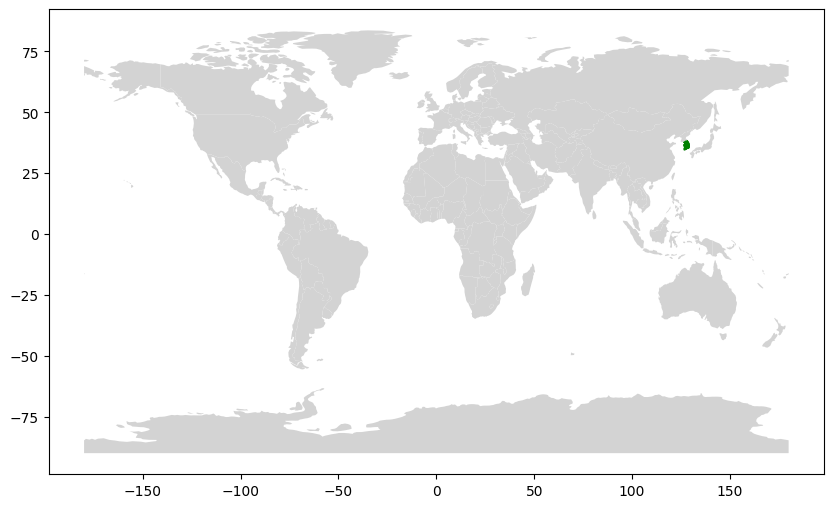

In [ ]:
# 필요한 라이브러리 import
import geopandas as gpd
import matplotlib.pyplot as plt

# 대한민국 지도 데이터 불러오기
skorea = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# 인천, 제주, 세종 데이터 추출
incheon = skorea[skorea['name'] == 'South Korea']
jeju = skorea[skorea['name'] == 'South Korea']
sejong = skorea[skorea['name'] == 'South Korea']

# 지도 그리기
fig, ax = plt.subplots(figsize=(10, 10))
skorea.plot(ax=ax, color='lightgrey')
incheon.plot(ax=ax, color='green')
jeju.plot(ax=ax, color='green')
sejong.plot(ax=ax, color='green')

# 그래프 표시
plt.show()
